In [28]:
import pandas as pd
import numpy as np
from scipy.io import wavfile
import os,glob
from tqdm import tqdm
import h5py
from pathlib import Path
import matplotlib.pyplot as plt


In [29]:
import sys
# ava_path = '/Users/gg3065/autoencoded-vocal-analysis/' #path to ava directory
# sys.path.append(ava_path) #this adds the location of ava to your path
#from ava.preprocessing.preprocess import process_sylls


from ava.preprocessing.utils import get_spec
from ava.preprocessing.preprocess import get_syll_specs

In [27]:
import inspect

# where is it defined?
print(get_syll_specs.__module__)
print(inspect.getsourcefile(get_syll_specs))

# peek at the source (prints to console)
print(inspect.getsource(get_syll_specs))


ava.preprocessing.preprocess
C:\Users\gg3065\code\vocalizations\.venv\Lib\site-packages\ava\preprocessing\preprocess.py
def get_syll_specs(onsets, offsets, audio_filename, p):
	"""
	Return the spectrograms corresponding to `onsets` and `offsets`.

	Parameters
	----------
	onsets : list of floats
		Syllable onsets.
	offsets : list of floats
		Syllable offsets.
	audio_filename : str
		Audio filename.
	p : dict
		A dictionary mapping preprocessing parameters to their values. NOTE: ADD
		REFERENCE HERE!

	Returns
	-------
	specs : list of {numpy.ndarray, None}
		Spectrograms.
	valid_syllables : list of int
		Indices of `specs` containing valid syllables.
	"""
	with warnings.catch_warnings():
		warnings.filterwarnings("ignore", category=WavFileWarning)
		fs, audio = wavfile.read(audio_filename)
	assert p['nperseg'] % 2 == 0 and p['nperseg'] > 2
	if p['mel']:
		target_freqs = np.linspace( \
				_mel(p['min_freq']), _mel(p['max_freq']), p['num_freq_bins'])
		target_freqs = _inv_mel(target_fre

In [15]:
exp = 237

In [32]:
data_path = fr"\\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\{exp}" #'/mnt/home/mmartinez/ceph/data/gerbil/gily'
print(data_path)
onoffpath = os.path.join(data_path,'vox_for_Miles.csv')
wavpath = os.path.join(data_path,'Averaged_wavs_w_annotations') #'audio')
specpath = os.path.join(data_path,'processed-data/family1')

spec_dir = Path(specpath)                 # your output directory
spec_dir.mkdir(parents=True, exist_ok=True)


\\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\237


In [31]:
params ={'get_spec': get_spec, # spectrogram maker,
'num_freq_bins':128,
'num_time_bins':128,
'min_freq': 500, # minimum frequency
'max_dur': 0.5, # maximum syllable duration'min_freq': 500, # minimum frequency (ralph used 0.3sec on warped specs)
'max_freq': 62500, # maximum frequency
'nperseg': 512, # FFT
'noverlap': 256, # FFT
'spec_min_val': -8, # minimum log-spectrogram value
'spec_max_val': -5, # maximum log-spectrogram value
'fs': 125000, # audio sample rate
'mel': False, # frequency spacing, mel or linear
'time_stretch': True, # stretch short syllables?
'within_syll_normalize': False, # normalize spectrogram values on a
                       # spectrogram-by-spectrogram basis
'max_num_syllables': None, # maximum number of syllables per directory
'sylls_per_file': 100, # syllable per file
'real_preprocess_params': ('min_freq', 'max_freq', 
     'spec_min_val','spec_max_val', 'max_dur'), # tunable parameters
'int_preprocess_params': ('nperseg','noverlap'), # tunable parameters
'binary_preprocess_params': ('time_stretch', 'mel',
      'within_syll_normalize'), # tunable parameters
}

In [18]:
voc_data = pd.read_csv(onoffpath)

In [19]:
channel_key = ['arena_1',
              'arena_2',
              'underground']
onsets,offsets = voc_data.start_time_file_sec,voc_data.stop_time_file_sec
lens = voc_data.duration_sec
channels = voc_data.assigned_channel
file_nums = voc_data.file_num
locs = voc_data.assigned_location

filenames = [os.path.join(wavpath,'channel_{}_file_{}.wav'.format(c,str(fn).zfill(3))) for c,fn in zip(channels,file_nums)]

In [20]:
print(voc_data.head())


   file_num event_type  start_time_file_sec  stop_time_file_sec  duration_sec  \
0         0        vox                0.000               0.058         0.058   
1         0        vox                0.088               0.177         0.088   
2         0        vox                0.200               0.357         0.157   
3         0        vox                0.544               0.650         0.106   
4         0        vox                0.788               0.883         0.095   

  assigned_location  assigned_channel  
0       underground                30  
1       underground                30  
2       underground                30  
3       underground                30  
4       underground                30  


In [21]:
channel_10_dict = {
    'loc':'arena_1',
    'onsets':[o for o,c in zip(onsets,channels) if c == 10],
    'offsets':[o for o,c in zip(offsets,channels) if c == 10],
    'filenames':[o for o,c in zip(filenames,channels) if c == 10]}
channel_20_dict = {
    'loc':'arena_2',
    'onsets':[o for o,c in zip(onsets,channels) if c == 20],
    'offsets':[o for o,c in zip(offsets,channels) if c ==20],
    'filenames':[o for o,c in zip(filenames,channels) if c == 20]}
channel_30_dict = {
    'loc':'underground',
    'onsets':[o for o,c in zip(onsets,channels) if c == 30],
    'offsets':[o for o,c in zip(offsets,channels) if c == 30],
    'filenames':[o for o,c in zip(filenames,channels) if c == 30]}

In [22]:
def process_sylls_dict(info_dict):

    
    onsets,offsets,filenames,loc = info_dict['onsets'],info_dict['offsets'],info_dict['filenames'],info_dict['loc']
    print(f"processing {len(onsets)} vocs from arena {loc}")
    write_file_num = 0
    syll_data = {
        'specs':[],
        'onsets':[],
        'offsets':[],
        'audio_filenames':[],
        'location':[]
    }
    sylls_per_file = params['sylls_per_file']
    for onset,offset,fn in zip(onsets,offsets,filenames):
        
        spec,valid = get_syll_specs([onset],[offset],fn,params)
        if len(valid) > 0:
            syll_data['specs'] += spec
            syll_data['onsets'] += [onset]
            syll_data['offsets'] += [offset]
            syll_data['audio_filenames'] += \
                    [os.path.split(fn)[-1]]
            syll_data['location'] += [loc]
        while len(syll_data['onsets']) >= sylls_per_file:
            save_filename = \
                    "syllables_" + str(write_file_num).zfill(4) + '.hdf5'
            save_filename = os.path.join(specpath, save_filename)
            #print(f"saving {save_filename}") 
            #print(f"filenames will be (e.g.): {os.path.join(wavpath, syll_data['audio_filenames'][0])}")
            #assert False
            with h5py.File(save_filename, "w") as f:
                # Add all the fields.
                for key in ['onsets', 'offsets']:
                    f.create_dataset(key, \
                            data=np.array(syll_data[key][:sylls_per_file]))
                f.create_dataset('specs', \
                        data=np.stack(syll_data['specs'][:sylls_per_file]))
                temp = [os.path.join(wavpath, i) for i in \
                        syll_data['audio_filenames'][:sylls_per_file]]
                f.create_dataset('audio_filenames', \
                        data=np.array(temp).astype('S'))
                f.create_dataset('locations',\
                        data = np.array(syll_data['location']).astype('S'))
            write_file_num += 1
            # Remove the written data from temporary storage.
            for key in syll_data:
                syll_data[key] = syll_data[key][sylls_per_file:]
    print(f"Done with {loc}!")

In [23]:
import scipy.interpolate as si
print("interp2d exists:", hasattr(si, "interp2d"))

from ava.preprocessing.preprocess import get_syll_specs
print("get_syll_specs imported OK")


interp2d exists: True
get_syll_specs imported OK


In [24]:
write_file_num = 0
syll_data = {
    'specs':[],
    'onsets':[],
    'offsets':[],
    'audio_filenames':[],
    'location':[]
}
sylls_per_file = params['sylls_per_file']
for onset,offset,fn,loc in tqdm(zip(onsets,offsets,filenames,locs),total=len(filenames)):
    
    spec,valid = get_syll_specs([onset],[offset],fn,params)
    if len(valid) > 0:
        syll_data['specs'] += spec
        syll_data['onsets'] += [onset]
        syll_data['offsets'] += [offset]
        syll_data['audio_filenames'] += \
                [os.path.split(fn)[-1]]
        syll_data['location'] += [loc]
    while len(syll_data['onsets']) >= sylls_per_file:
        save_filename = \
                "syllables_" + str(write_file_num).zfill(4) + '.hdf5'
        save_filename = os.path.join(specpath, save_filename)
        #print(f"saving {save_filename}") 
        #print(f"filenames will be (e.g.): {os.path.join(wavpath, syll_data['audio_filenames'][0])}")
        #assert False
        with h5py.File(save_filename, "w") as f:
            # Add all the fields.
            for key in ['onsets', 'offsets']:
                f.create_dataset(key, \
                        data=np.array(syll_data[key][:sylls_per_file]))
            f.create_dataset('specs', \
                    data=np.stack(syll_data['specs'][:sylls_per_file]))
            temp = [os.path.join(wavpath, i) for i in \
                    syll_data['audio_filenames'][:sylls_per_file]]
            f.create_dataset('audio_filenames', \
                    data=np.array(temp).astype('S'))
            f.create_dataset('locations',\
                        data = np.array(syll_data['location']).astype('S'))
        write_file_num += 1
        # Remove the written data from temporary storage.
        for key in syll_data:
            syll_data[key] = syll_data[key][sylls_per_file:]
print("Done!")

  1%|          | 244/38680 [00:15<32:47, 19.53it/s] C:\Users\gg3065\code\vocalizations\.venv\Lib\site-packages\ava\preprocessing\utils.py:64: UserWarning: Found segment longer than max_dur: 0.6520000000000152s, max_dur = 0.5s
  warnings.warn(message)
 15%|█▍        | 5773/38680 [07:03<32:26, 16.90it/s]  C:\Users\gg3065\code\vocalizations\.venv\Lib\site-packages\ava\preprocessing\utils.py:64: UserWarning: Found segment longer than max_dur: 0.5930000000000177s, max_dur = 0.5s
  warnings.warn(message)
 48%|████▊     | 18683/38680 [24:56<17:13, 19.34it/s]  C:\Users\gg3065\code\vocalizations\.venv\Lib\site-packages\ava\preprocessing\utils.py:64: UserWarning: Found segment longer than max_dur: 0.6040000000000134s, max_dur = 0.5s
  warnings.warn(message)
 53%|█████▎    | 20665/38680 [27:08<15:27, 19.43it/s]  C:\Users\gg3065\code\vocalizations\.venv\Lib\site-packages\ava\preprocessing\utils.py:64: UserWarning: Found segment longer than max_dur: 0.5910000000000082s, max_dur = 0.5s
  warnings.wa

Done!


In [25]:
specs = get_syll_specs([onsets[0]],[offsets[0]],filenames[0],params)

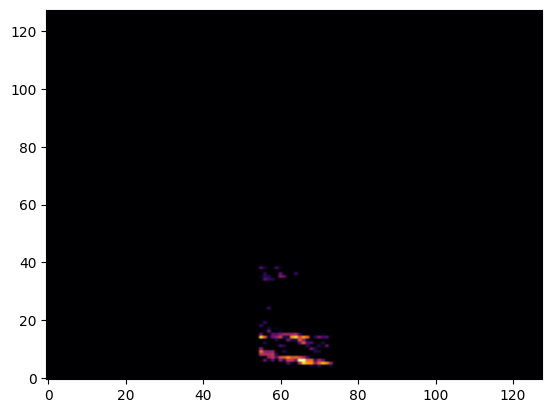

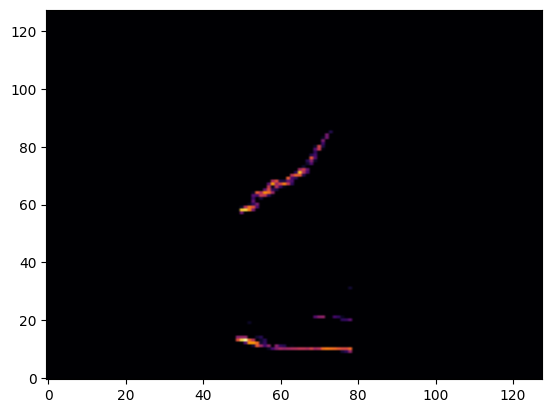

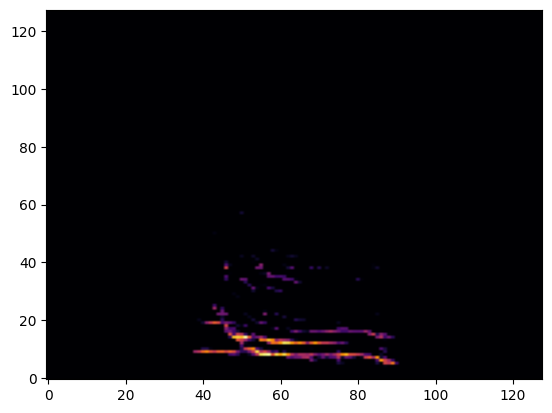

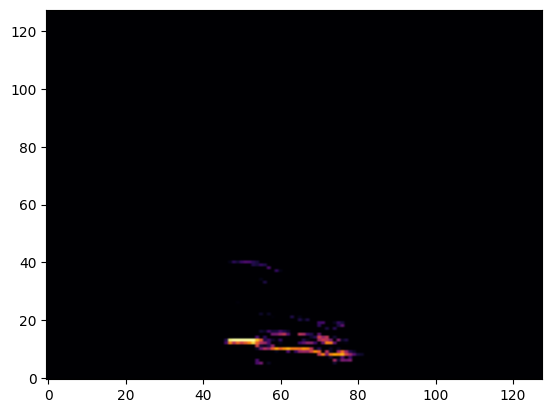

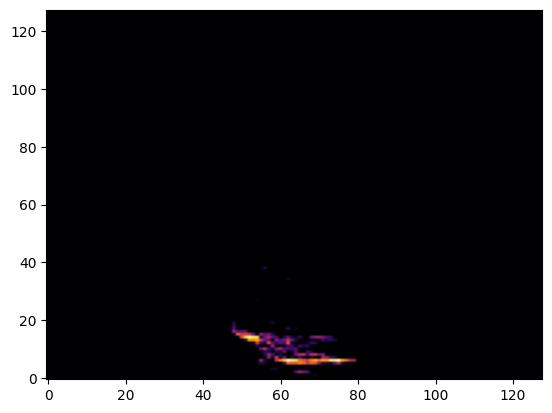

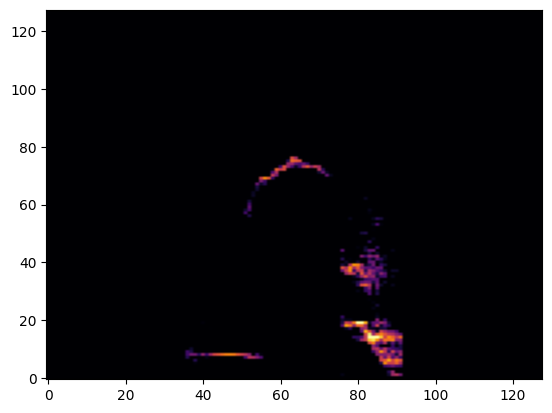

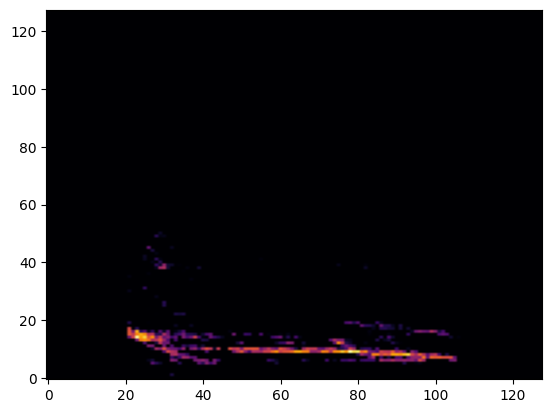

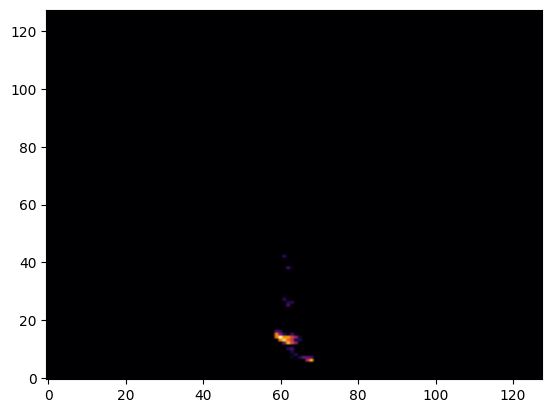

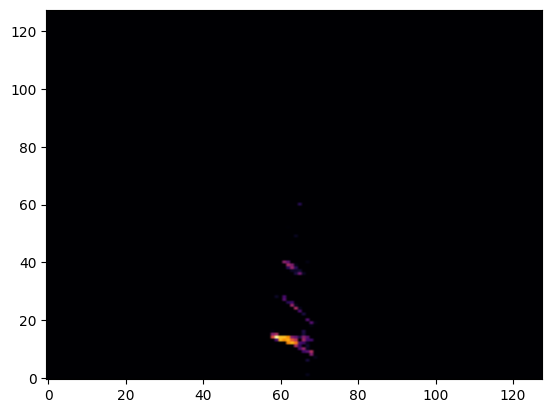

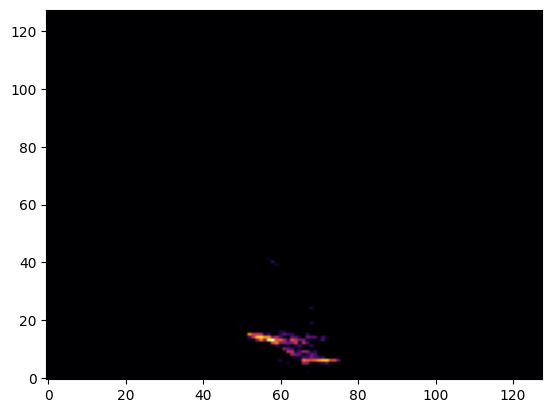

In [26]:
%matplotlib inline
for ii in range(10):
    spec,valids = get_syll_specs([onsets[ii]],[offsets[ii]],filenames[ii],params)
    ax = plt.gca()
    ax.imshow(spec[0].squeeze(),origin='lower',aspect='auto',cmap='inferno')
    plt.show()
    plt.close()

In [264]:
%matplotlib inline


In [265]:
# What's in a hdf5 file?
import h5py
import numpy as np
from collections import Counter
from pprint import pprint

def _to_str_array(arr):
    """
    Convert a numpy array that might be bytes / fixed-length ASCII / vlen strings
    into a 1D list of Python str.
    """
    # Already strings
    if arr.dtype.kind in ("U", "O"):
        # If object dtype, try to convert each element to str
        return [str(x) if not isinstance(x, (bytes, np.bytes_)) else x.decode("utf-8", "ignore") for x in arr]
    # Fixed-length ASCII like 'S32'
    if arr.dtype.kind == "S":
        return [x.decode("utf-8", "ignore") for x in arr.astype("S")]
    # Fallback: try decoding elementwise
    out = []
    for x in arr:
        if isinstance(x, (bytes, np.bytes_)):
            out.append(x.decode("utf-8", "ignore"))
        else:
            out.append(str(x))
    return out

def preview_dataset(ds, name, max_show=10):
    """
    Print shape/dtype and up to `max_show` example entries.
    If the dataset looks string-like, show unique counts (top-20).
    """
    print(f"\n--- Dataset '{name}' ---")
    print("shape:", ds.shape, "dtype:", ds.dtype)

    # small helpers
    n = ds.shape[0] if ds.ndim >= 1 else 1
    show_n = min(max_show, n)

    # Try to detect string-like data
    is_stringy = (ds.dtype.kind in ("S", "O", "U"))

    try:
        if ds.ndim == 0:
            val = ds[()]
            if isinstance(val, (bytes, np.bytes_)):
                val = val.decode("utf-8", "ignore")
            print("value:", val)
            return

        # 1D datasets (common for per-spec metadata like locations, caller, etc.)
        if ds.ndim == 1:
            if is_stringy:
                arr = _to_str_array(ds[()])  # full array (safe if not huge)
                print(f"first {show_n} values:")
                for i in range(show_n):
                    print(f"  [{i}]: {arr[i]}")
                # show a small frequency table
                c = Counter(arr)
                print("\n(top 20) value counts:")
                for k, v in c.most_common(20):
                    print(f"  {k!r}: {v}")
            else:
                arr = ds[()]
                print(f"first {show_n} values:", arr[:show_n])
                if np.issubdtype(arr.dtype, np.number):
                    print("min/max:", np.nanmin(arr), np.nanmax(arr))
            return

        # 2D+ datasets (e.g., specs: (N, H, W) or (N, C, H, W))
        # Just show a small slice to avoid spamming
        sl = tuple(slice(0,1) if i == 0 else slice(None) for i in range(ds.ndim))
        sample = ds[sl]
        print(f"preview of first item shape: {sample.shape}, dtype: {sample.dtype}")
        if np.issubdtype(sample.dtype, np.number):
            print("first item min/max:", float(np.nanmin(sample)), float(np.nanmax(sample)))

    except Exception as e:
        print(f"(Could not preview '{name}': {e})")

def inspect_h5(fn, show_locations=True):
    print("\n==============================")
    print("FILE:", fn)
    with h5py.File(fn, "r") as f:
        # File-level attributes
        attrs = {k: f.attrs[k] for k in f.attrs.keys()}
        print("Attributes:")
        pprint(attrs)

        keys = list(f.keys())
        print("Datasets:", keys)

        # Always preview 'specs' if present
        if "specs" in f:
            preview_dataset(f["specs"], "specs")

        # If there are location or caller-like fields, show their actual content
        for k in keys:
            if k == "specs":
                continue
            if show_locations and k.lower() in ("locations", "location", "caller", "arena", "arena_id", "file", "audio_filenames"):
                preview_dataset(f[k], k)
            else:
                # brief summary for other datasets
                ds = f[k]
                print(f"\n--- Dataset '{k}' ---")
                print("shape:", ds.shape, "dtype:", ds.dtype)

        # Cross-check lengths (useful sanity check)
        if "specs" in f:
            n_specs = len(f["specs"])
            print("\nSanity checks:")
            for k in keys:
                if k == "specs":
                    continue
                try:
                    if f[k].shape and f[k].shape[0] == n_specs:
                        print(f"  '{k}' aligns with specs: length {n_specs}")
                except Exception:
                    pass

# ---- usage ----
fn = r"D:\Data\237\processed-data\family1\syllables_0123.hdf5"
inspect_h5(fn)



FILE: D:\Data\237\processed-data\family1\syllables_0123.hdf5
Attributes:
{}
Datasets: ['audio_filenames', 'locations', 'offsets', 'onsets', 'specs']

--- Dataset 'specs' ---
shape: (100, 128, 128) dtype: float64
preview of first item shape: (1, 128, 128), dtype: float64
first item min/max: 0.0 0.0

--- Dataset 'audio_filenames' ---
shape: (100,) dtype: |S119
first 10 values:
  [0]: \\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\237\Averaged_wavs_w_annotations\channel_10_file_075.wav
  [1]: \\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\237\Averaged_wavs_w_annotations\channel_30_file_075.wav
  [2]: \\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\237\Averaged_wavs_w_annotations\channel_30_file_075.wav
  [3]: \\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\237\Averaged_wavs_w_annotations\channel_30_file_075.wav
  [4]: \\sanesstorage.cns.nyu.edu\archive\ginosar\Processed_data\Audio\237\Averaged_wavs_w_annotations\channel_30

In [36]:
# ===== FIXED: correct kHz y-axis + robust freq-axis detection & flipping =====
import os, glob, warnings, shutil
from pathlib import Path
import h5py
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# -------------------- USER KNOBS --------------------
H5_DIR   = r"D:\Data\235\processed-data\family1"   # where original HDF5s live
H5_GLOB  = "*.hdf5"

SAVE_MODE  = "copy"  # "inplace" or "copy"
OUT_H5_DIR = r"D:\Data\235\processed-data\family1-freq"

FIG_OUT_DIR = r"D:\Data\235\peaks_examples"
N_EXAMPLES_PER_FILE = 6
RNG_SEED = 42

# Frequency axis source order: try in-file datasets/attrs, then fallback here.
# Set these fallbacks to YOUR preprocessing band (e.g., 2000..80000 for 2–80 kHz).
FALLBACK_MIN_FREQ_HZ = 2000.0
FALLBACK_MAX_FREQ_HZ = 60000.0

PEAK_TIME_REDUCTION = "max"   # "max" or "mean"
CMAP = "inferno"
DPI  = 200
# ----------------------------------------------------

h5_dir = Path(H5_DIR); assert h5_dir.is_dir()
files = sorted(h5_dir.glob(H5_GLOB)); assert files, f"No files in {h5_dir}"
if SAVE_MODE.lower() == "copy":
    Path(OUT_H5_DIR).mkdir(parents=True, exist_ok=True)
fig_dir = Path(FIG_OUT_DIR); fig_dir.mkdir(parents=True, exist_ok=True)
rng = np.random.default_rng(RNG_SEED) if RNG_SEED is not None else np.random.default_rng()

def _get_freq_axis(f: h5py.File, n_freq: int) -> np.ndarray:
    """Try: dataset 'freq_axis_hz' -> file attrs -> fallback."""
    # 1) dataset
    if "freq_axis_hz" in f:
        fa = np.asarray(f["freq_axis_hz"])
        if fa.ndim == 1 and fa.size == n_freq:
            return fa.astype(np.float32)

    # 2) common attrs
    candidates = []
    for k in ["min_freq_hz", "min_freq", "fmin_hz", "low_freq_hz"]:
        if k in f.attrs: candidates.append(("min", float(f.attrs[k])))
    for k in ["max_freq_hz", "max_freq", "fmax_hz", "high_freq_hz"]:
        if k in f.attrs: candidates.append(("max", float(f.attrs[k])))
    mins = [v for t, v in candidates if t == "min"]
    maxs = [v for t, v in candidates if t == "max"]
    if mins and maxs:
        fmin, fmax = float(mins[0]), float(maxs[0])
        return np.linspace(fmin, fmax, n_freq, dtype=np.float32)

    # 3) fallback
    return np.linspace(FALLBACK_MIN_FREQ_HZ, FALLBACK_MAX_FREQ_HZ, n_freq, dtype=np.float32)

def _compute_peak_freq(spec2d: np.ndarray, freq_axis_hz: np.ndarray, reduction: str):
    """Returns (peak_bin, peak_hz). Handles NaNs and descending freq axes."""
    s = np.asarray(spec2d)
    fa = np.asarray(freq_axis_hz)

    # Ensure ascending frequency axis; if descending, flip both
    descending = fa[0] > fa[-1]
    if descending:
        s  = s[::-1, :]        # flip freq dimension
        fa = fa[::-1]          # ascending now

    # peak over time
    if reduction == "mean":
        prof = np.nanmean(s, axis=1)
    else:
        prof = np.nanmax(s, axis=1)
    prof = np.where(np.isfinite(prof), prof, -np.inf)

    pb  = int(np.argmax(prof))         # index in (possibly flipped) s
    phz = float(fa[pb])

    # Map back to original indexing if caller expects original spec orientation
    if descending:
        # original peak bin index relative to original (unflipped) array
        pb_orig = s.shape[0] - 1 - pb
        return pb_orig, phz, True  # flipped
    else:
        return pb, phz, False

def _plot_example(spec2d: np.ndarray, freq_axis_hz: np.ndarray, peak_hz: float, out_png: Path):
    """Save PNG with y-axis in kHz; auto-handles ascending/descending."""
    s = np.asarray(spec2d)
    fa = np.asarray(freq_axis_hz)

    # If descending, flip for plotting so y goes low->high
    if fa[0] > fa[-1]:
        s  = s[::-1, :]
        fa = fa[::-1]

    y0, y1 = fa[0] / 1e3, fa[-1] / 1e3
    extent = (0, s.shape[1], y0, y1)

    plt.figure(figsize=(4.0, 3.2), dpi=DPI)
    ax = plt.gca()
    im = ax.imshow(s, origin="lower", aspect="auto", cmap=CMAP, extent=extent)
    ax.axhline(peak_hz / 1e3, color="cyan", lw=1.5, alpha=0.9)  # peak in kHz
    ax.set_xlabel("Frames")
    ax.set_ylabel("Frequency (kHz)")
    ax.set_title(f"Peak = {peak_hz/1e3:.1f} kHz")
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label("Power (a.u.)")
    plt.tight_layout()
    plt.savefig(out_png, dpi=DPI, bbox_inches="tight")
    plt.close()

n_ok = 0
for src in tqdm(files, desc="Augmenting HDF5"):
    try:
        dst = Path(OUT_H5_DIR) / src.name if SAVE_MODE.lower() == "copy" else src
        if SAVE_MODE.lower() == "copy":
            shutil.copy2(src, dst)

        with h5py.File(dst, "r+") as f:
            if "specs" not in f:
                warnings.warn(f"'specs' missing in {dst.name}; skip")
                continue
            specs = f["specs"]  # (N,F,T)
            if specs.ndim != 3:
                warnings.warn(f"Expected (N,F,T), got {specs.shape} in {dst.name}; skip")
                continue

            N, F, T = specs.shape
            freq_axis_hz = _get_freq_axis(f, F)

            # compute peaks
            peak_bin = np.empty(N, dtype=np.int32)
            peak_hz  = np.empty(N, dtype=np.float32)
            for i in range(N):
                pb, phz, _ = _compute_peak_freq(specs[i], freq_axis_hz, PEAK_TIME_REDUCTION)
                peak_bin[i] = pb
                peak_hz[i]  = phz

            # write datasets (overwrite if present)
            for d in ("peak_bin", "peak_freq_hz"):
                if d in f: del f[d]
            f.create_dataset("peak_bin",     data=peak_bin, dtype="i4")
            f.create_dataset("peak_freq_hz", data=peak_hz,  dtype="f4")

            # persist freq axis if not present (useful later)
            if "freq_axis_hz" not in f:
                f.create_dataset("freq_axis_hz", data=freq_axis_hz.astype("f4"))

            # examples
            k = min(N_EXAMPLES_PER_FILE, N)
            if k > 0:
                idxs = rng.choice(np.arange(N), size=k, replace=False)
                base = Path(dst).stem
                for j, idx in enumerate(idxs):
                    out_png = fig_dir / f"{base}_idx{idx:05d}_ex{j+1:02d}_peak_{(peak_hz[idx]/1e3):.1f}kHz.png"
                    _plot_example(np.asarray(specs[idx]), freq_axis_hz, float(peak_hz[idx]), out_png)

        n_ok += 1
    except Exception as e:
        warnings.warn(f"{src.name}: {e}")

print(f"Done. Updated {n_ok}/{len(files)} files.")
print(f"Mode: {SAVE_MODE} | HDF5 out: {OUT_H5_DIR if SAVE_MODE.lower()=='copy' else '(in-place)'}")
print(f"Example PNGs → {FIG_OUT_DIR}")


Augmenting HDF5: 100%|██████████| 365/365 [05:36<00:00,  1.09it/s]

Done. Updated 365/365 files.
Mode: copy | HDF5 out: D:\Data\235\processed-data\family1-freq
Example PNGs → D:\Data\235\peaks_examples


Found 365 HDF5 files in D:\Data\235\processed-data\family1
[1/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0000.hdf5
   wrote peak_freq_hz (min=1622.0, max=43299.2)


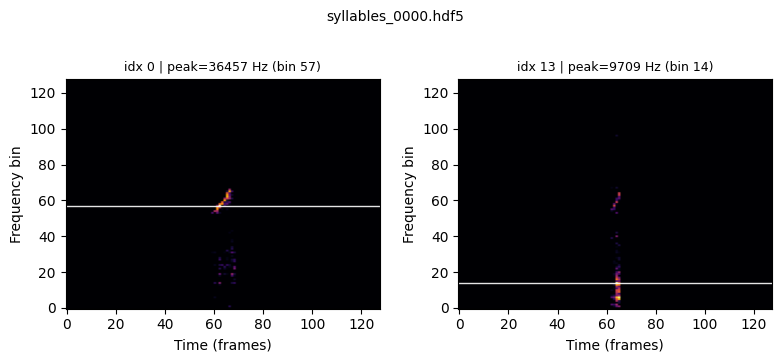

[2/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0001.hdf5
   wrote peak_freq_hz (min=1622.0, max=44543.3)


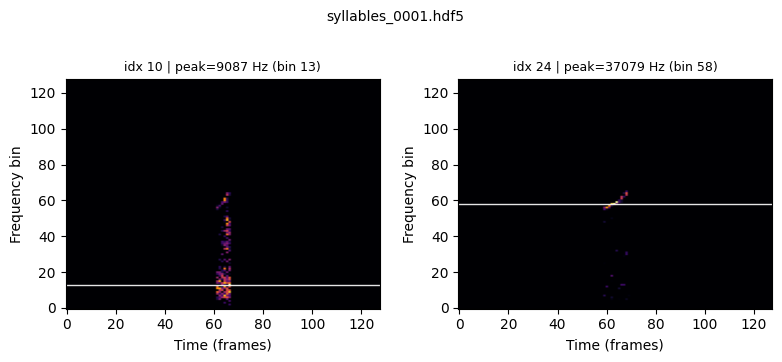

[3/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0002.hdf5
   wrote peak_freq_hz (min=1622.0, max=58850.4)


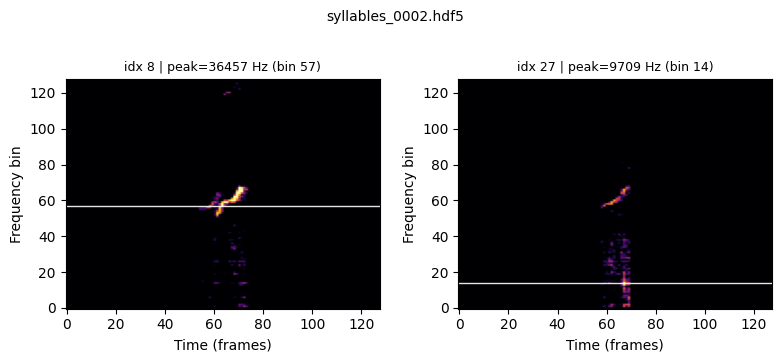

[4/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0003.hdf5
   wrote peak_freq_hz (min=1000.0, max=76267.7)


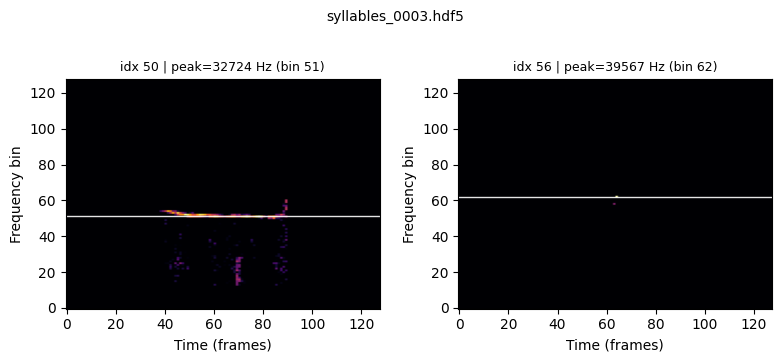

[5/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0004.hdf5
   wrote peak_freq_hz (min=1000.0, max=46409.4)


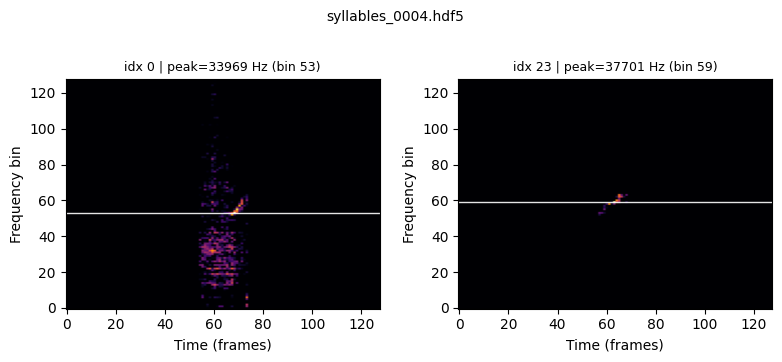

[6/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0005.hdf5
   wrote peak_freq_hz (min=1000.0, max=46409.4)


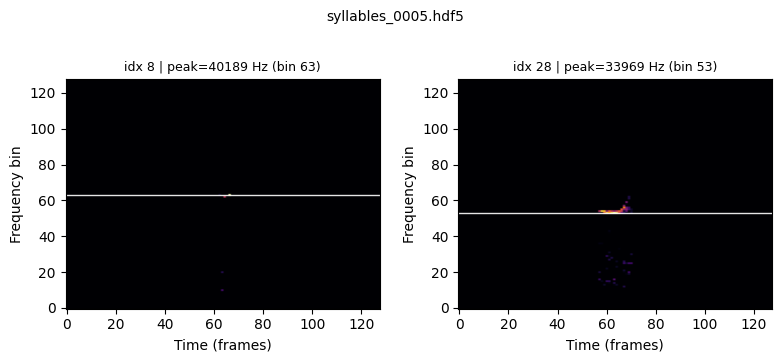

[7/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0006.hdf5
   wrote peak_freq_hz (min=1000.0, max=44543.3)


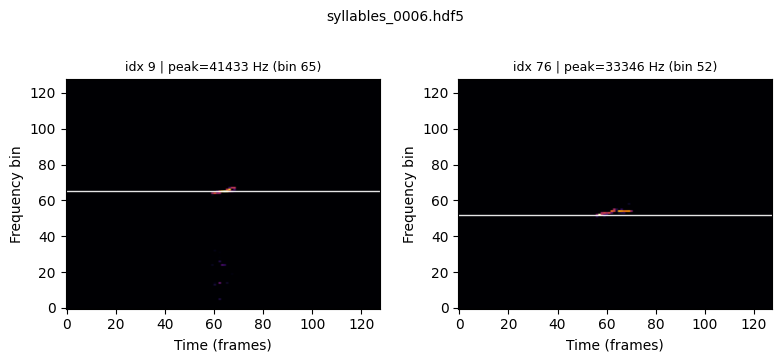

[8/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0007.hdf5
   wrote peak_freq_hz (min=1000.0, max=53874.0)


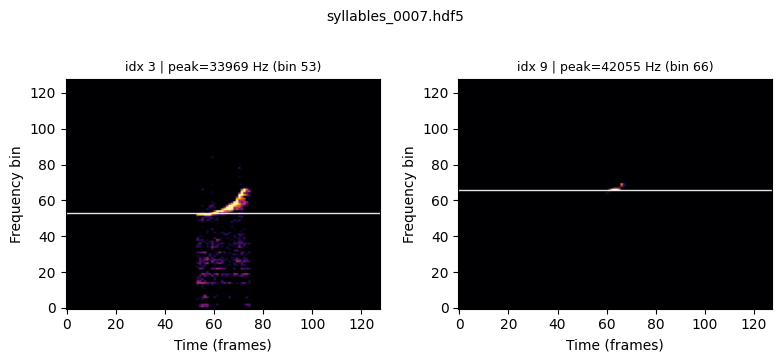

[9/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0008.hdf5
   wrote peak_freq_hz (min=4110.2, max=43921.3)


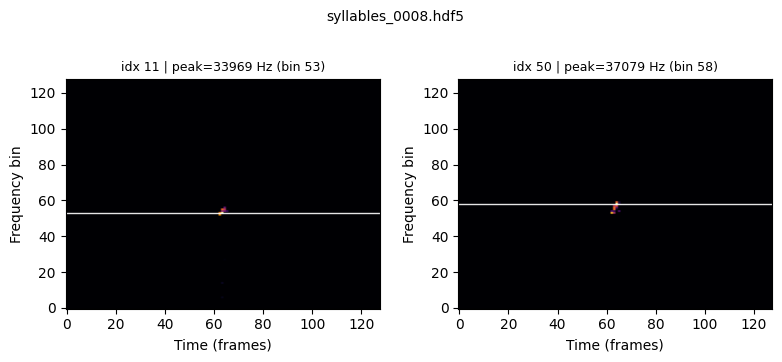

[10/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0009.hdf5
   wrote peak_freq_hz (min=1000.0, max=60716.5)


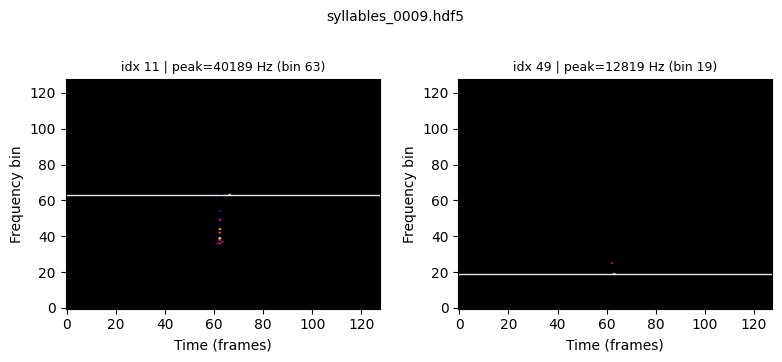

[11/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0010.hdf5
   wrote peak_freq_hz (min=1622.0, max=53252.0)


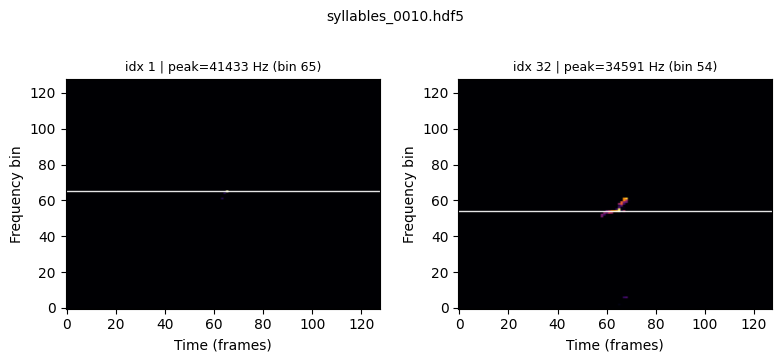

[12/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0011.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


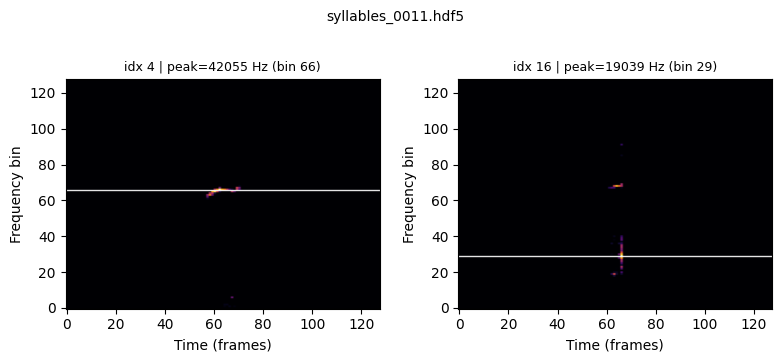

[13/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0012.hdf5
   wrote peak_freq_hz (min=1000.0, max=60716.5)


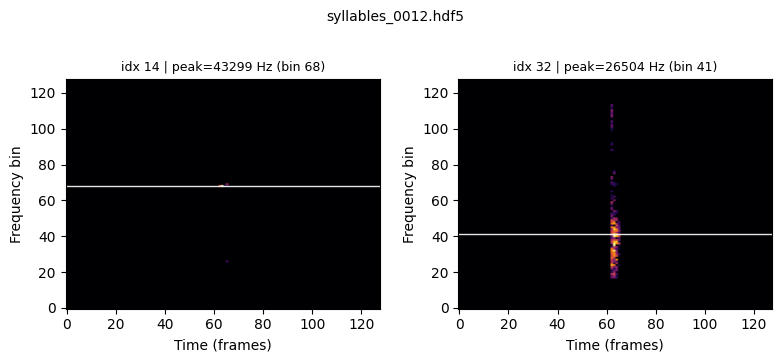

[14/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0013.hdf5
   wrote peak_freq_hz (min=1000.0, max=60716.5)


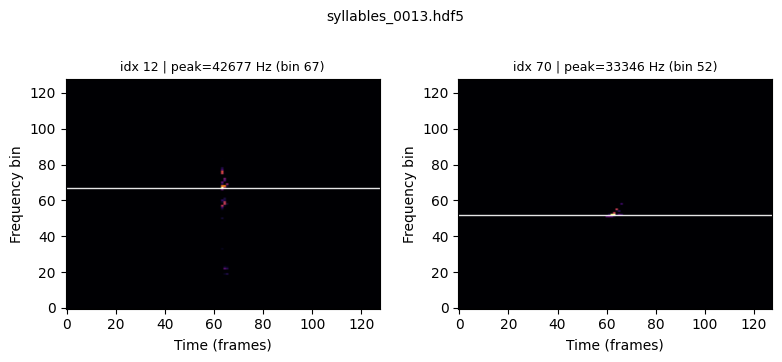

[15/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0014.hdf5
   wrote peak_freq_hz (min=1000.0, max=47031.5)


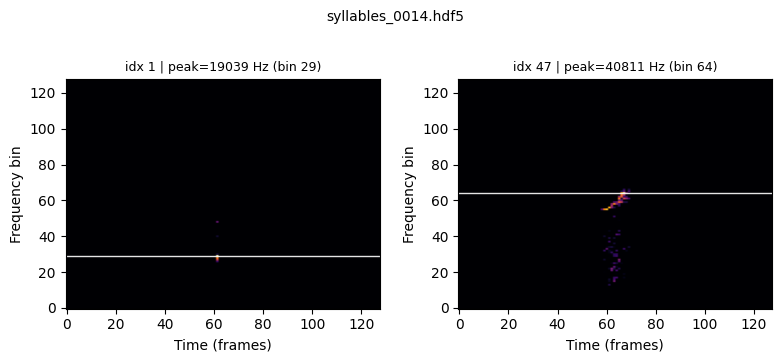

[16/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0015.hdf5
   wrote peak_freq_hz (min=1000.0, max=47031.5)


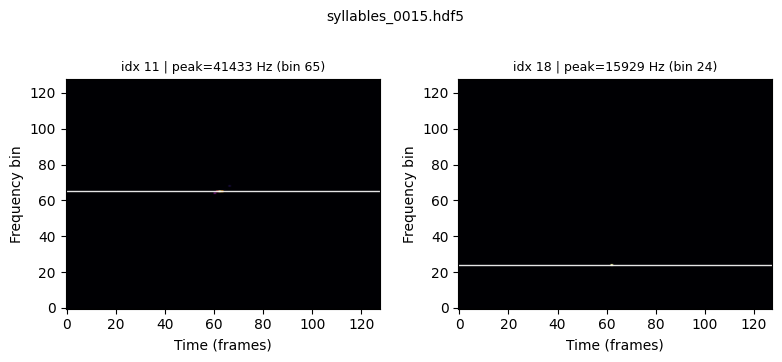

[17/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0016.hdf5
   wrote peak_freq_hz (min=1000.0, max=46409.4)


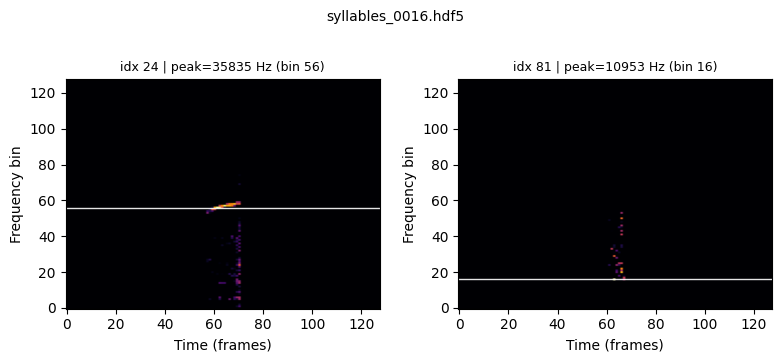

[18/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0017.hdf5
   wrote peak_freq_hz (min=2244.1, max=67559.1)


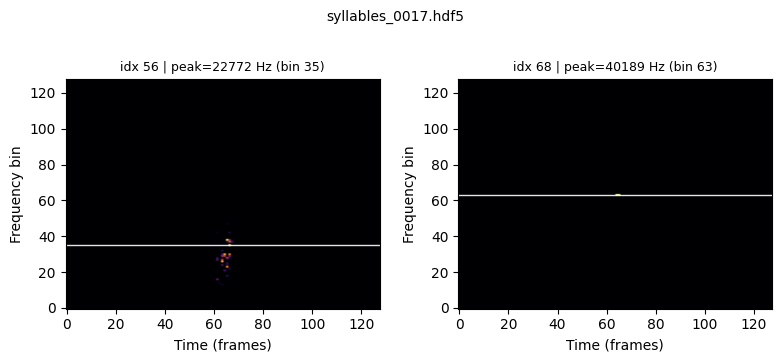

[19/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0018.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


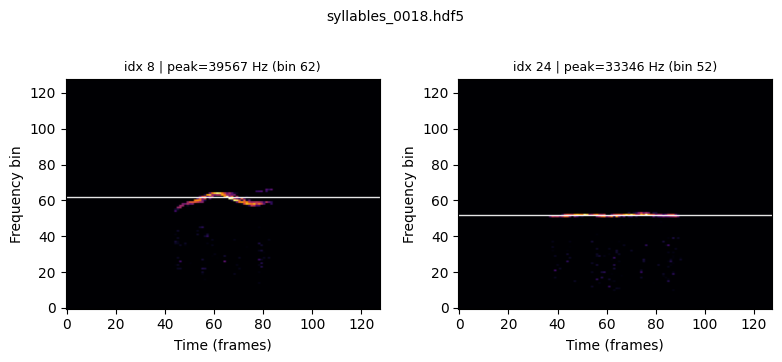

[20/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0019.hdf5
   wrote peak_freq_hz (min=2244.1, max=45165.4)


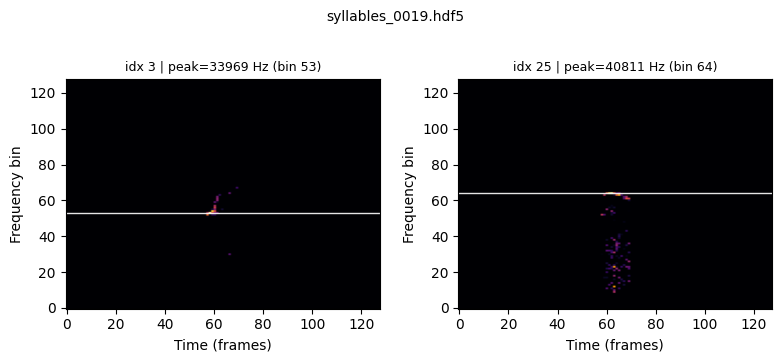

[21/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0020.hdf5
   wrote peak_freq_hz (min=12196.9, max=42677.2)


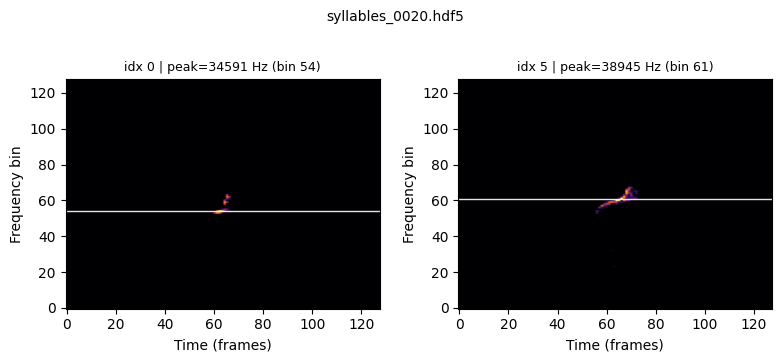

[22/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0021.hdf5
   wrote peak_freq_hz (min=1000.0, max=43299.2)


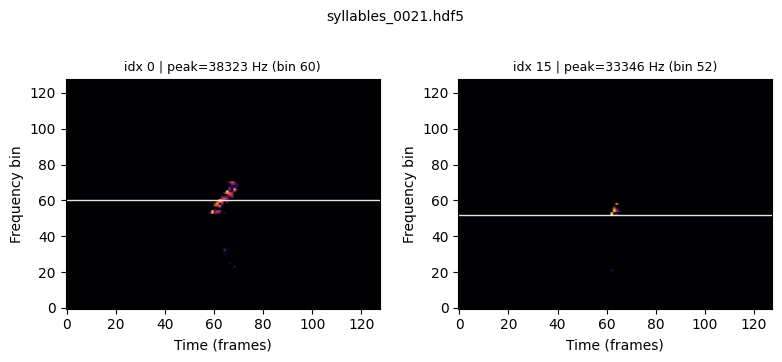

[23/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0022.hdf5
   wrote peak_freq_hz (min=1000.0, max=48275.6)


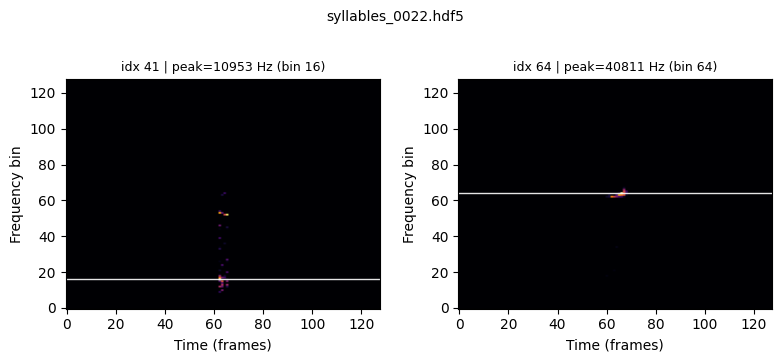

[24/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0023.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


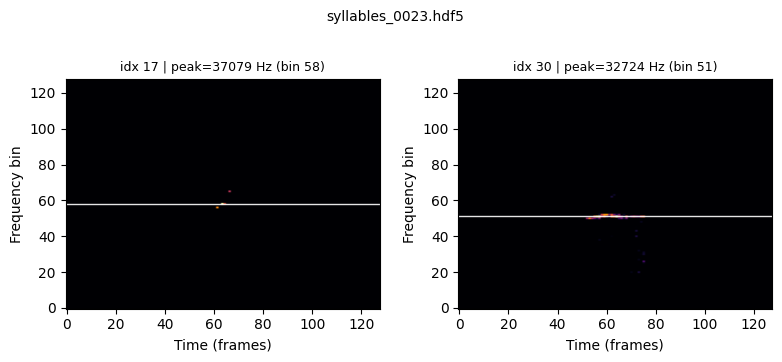

[25/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0024.hdf5
   wrote peak_freq_hz (min=1000.0, max=59472.4)


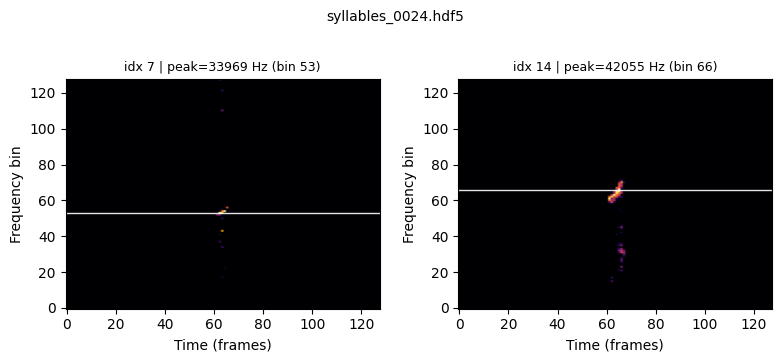

[26/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0025.hdf5
   wrote peak_freq_hz (min=1000.0, max=47653.5)


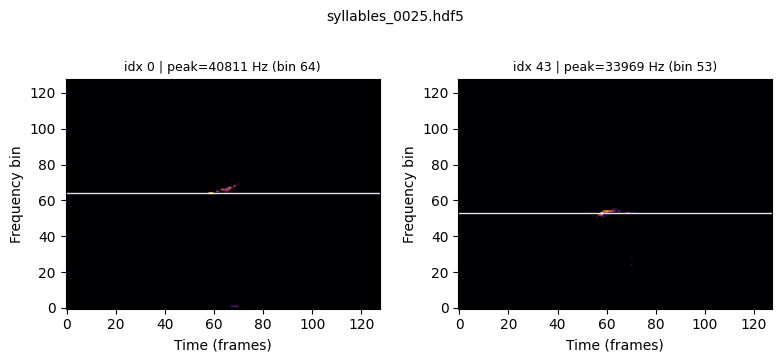

[27/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0026.hdf5
   wrote peak_freq_hz (min=1000.0, max=43921.3)


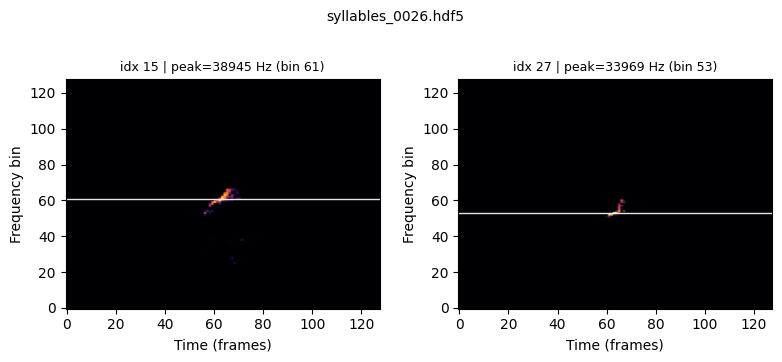

[28/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0027.hdf5
   wrote peak_freq_hz (min=1622.0, max=42677.2)


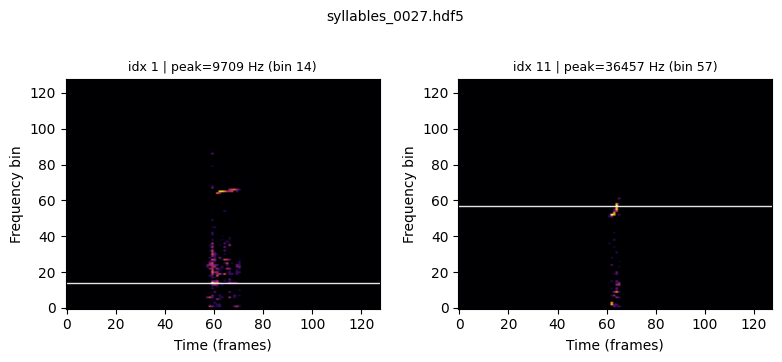

[29/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0028.hdf5
   wrote peak_freq_hz (min=1000.0, max=54496.1)


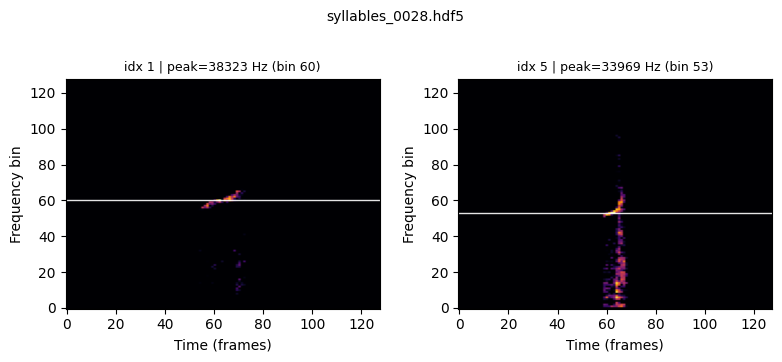

[30/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0029.hdf5
   wrote peak_freq_hz (min=1000.0, max=47031.5)


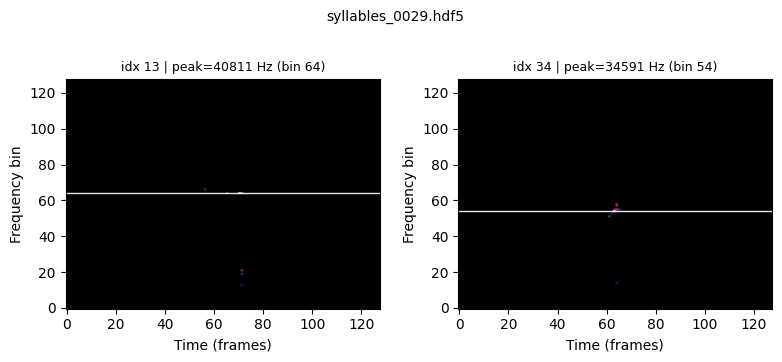

[31/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0030.hdf5
   wrote peak_freq_hz (min=1000.0, max=47031.5)


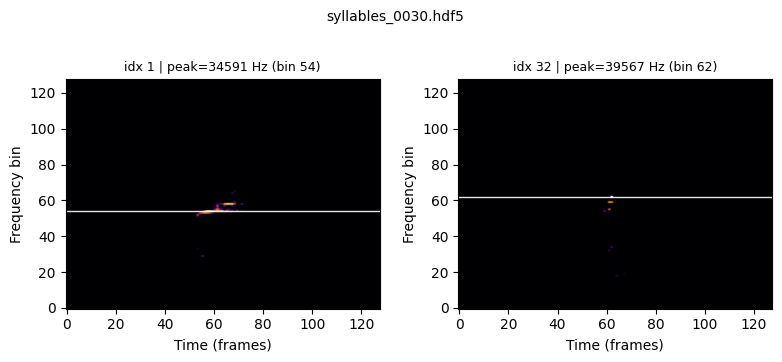

[32/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0031.hdf5
   wrote peak_freq_hz (min=6598.4, max=58850.4)


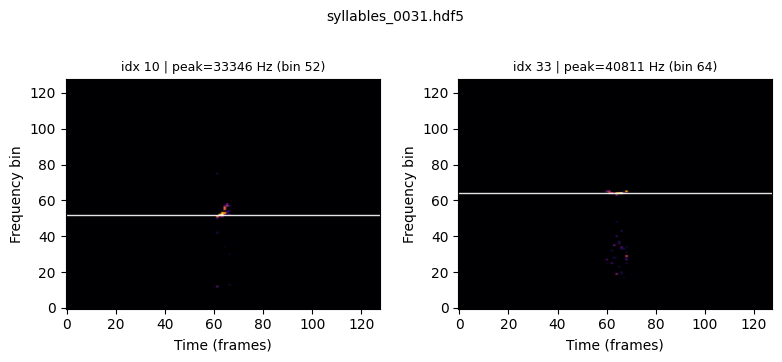

[33/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0032.hdf5
   wrote peak_freq_hz (min=1622.0, max=61960.6)


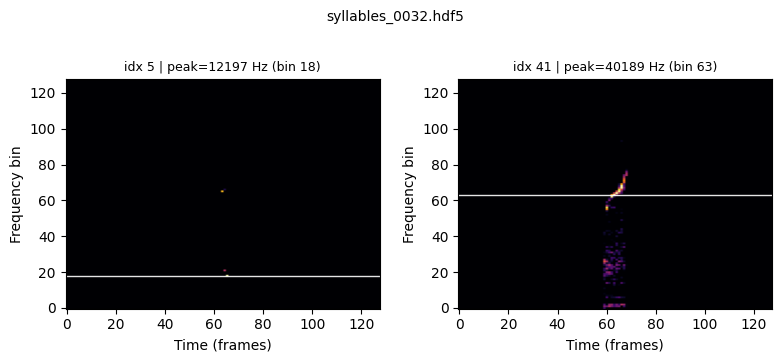

[34/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0033.hdf5
   wrote peak_freq_hz (min=1000.0, max=66937.0)


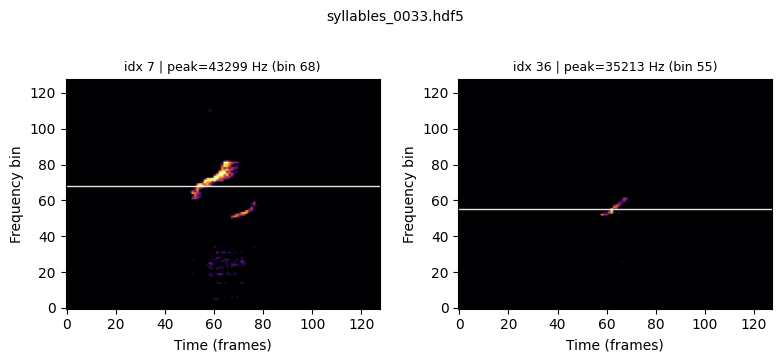

[35/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0034.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


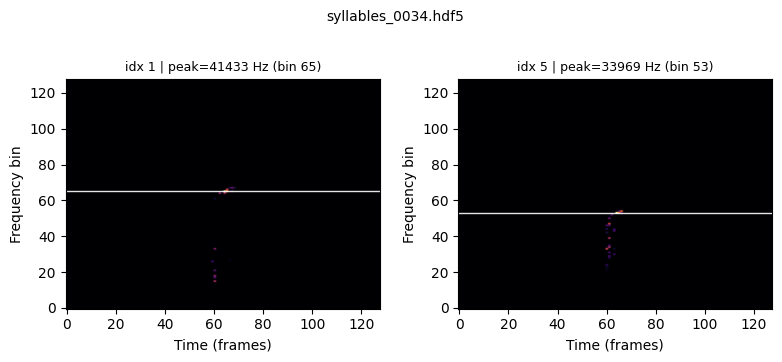

[36/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0035.hdf5
   wrote peak_freq_hz (min=1000.0, max=55740.2)


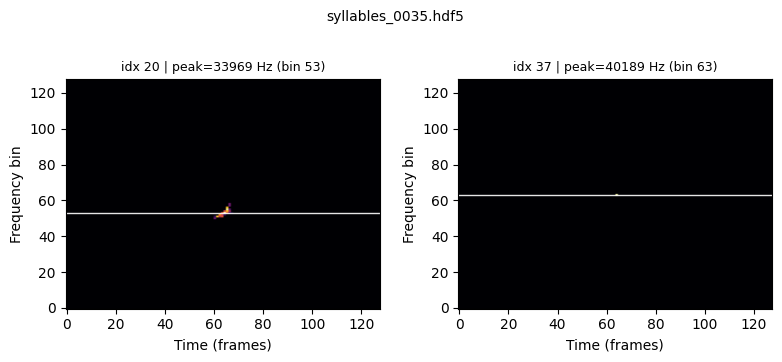

[37/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0036.hdf5
   wrote peak_freq_hz (min=1622.0, max=53874.0)


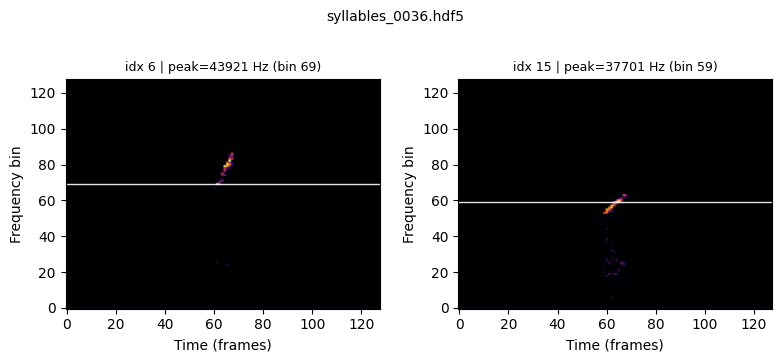

[38/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0037.hdf5
   wrote peak_freq_hz (min=1000.0, max=47031.5)


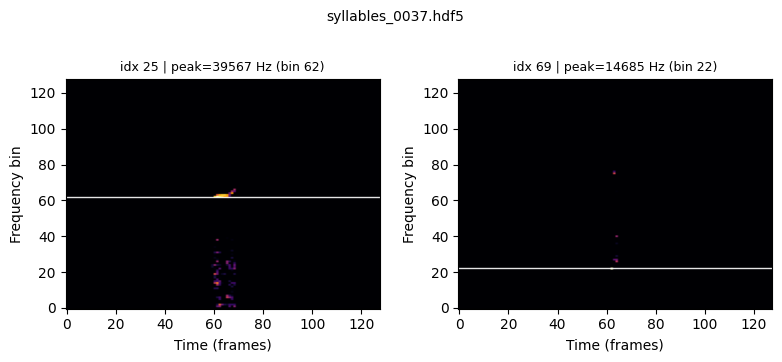

[39/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0038.hdf5
   wrote peak_freq_hz (min=1000.0, max=59472.4)


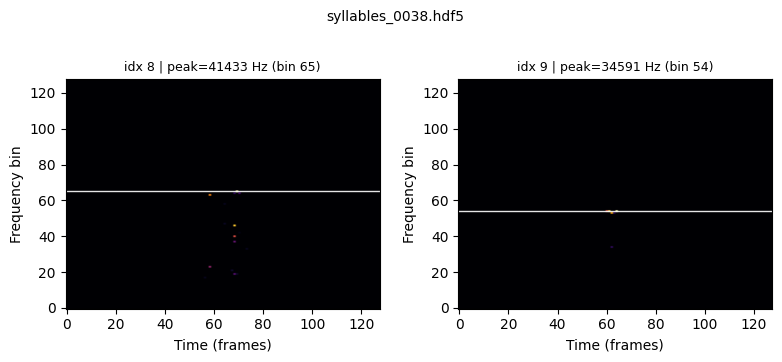

[40/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0039.hdf5
   wrote peak_freq_hz (min=1000.0, max=70047.2)


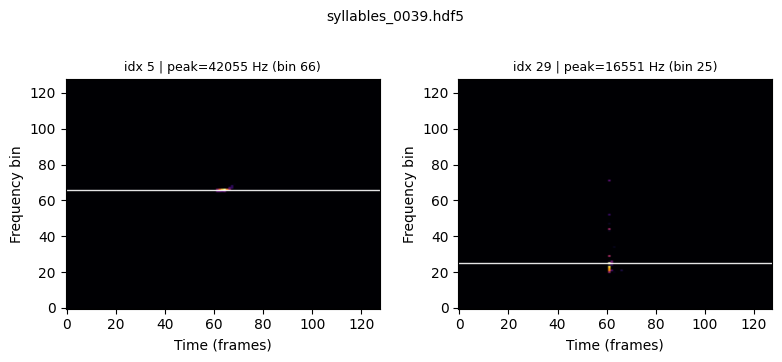

[41/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0040.hdf5
   wrote peak_freq_hz (min=1000.0, max=52007.9)


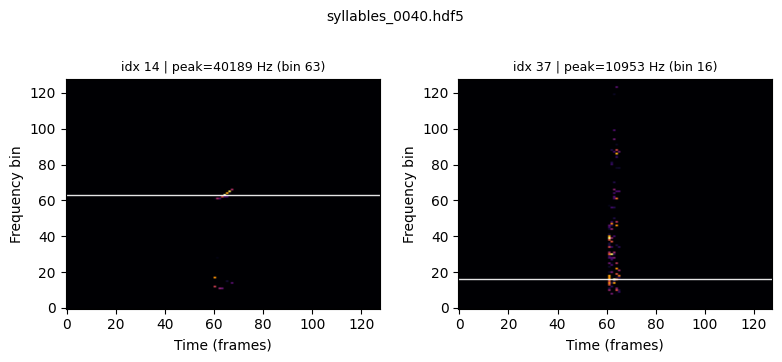

[42/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0041.hdf5
   wrote peak_freq_hz (min=1000.0, max=56362.2)


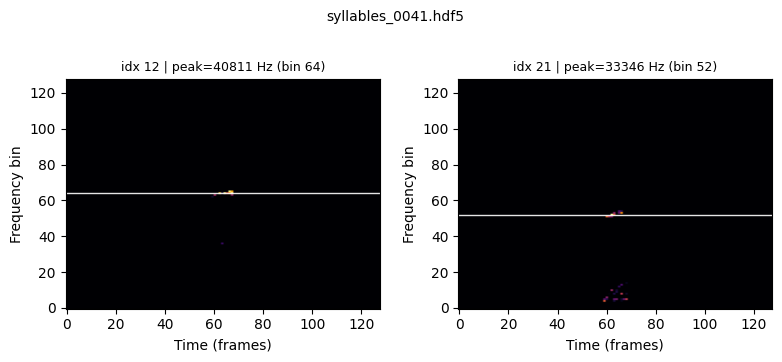

[43/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0042.hdf5
   wrote peak_freq_hz (min=1000.0, max=63826.8)


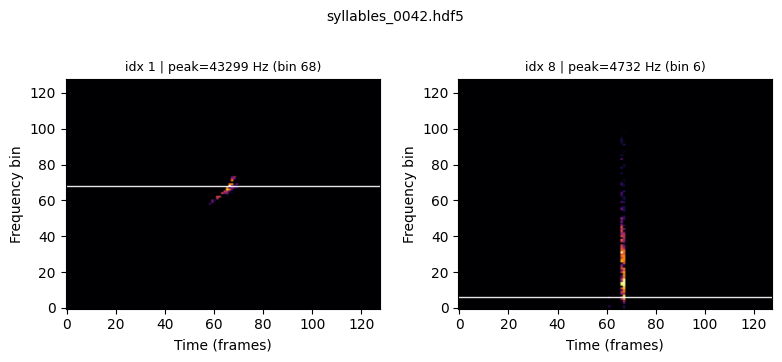

[44/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0043.hdf5
   wrote peak_freq_hz (min=1000.0, max=52007.9)


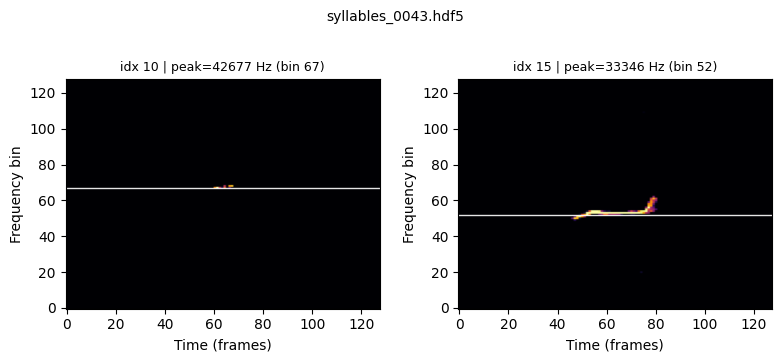

[45/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0044.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


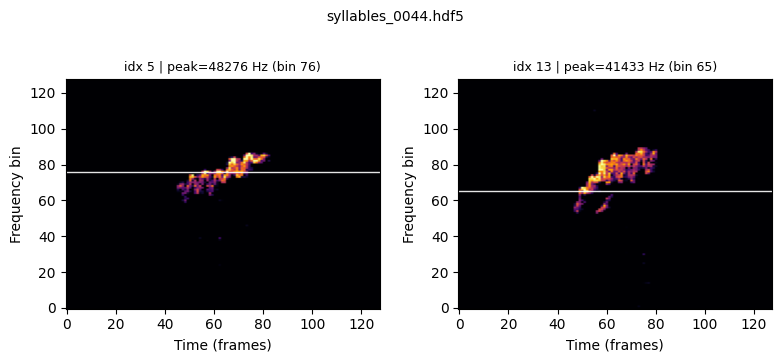

[46/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0045.hdf5
   wrote peak_freq_hz (min=1000.0, max=61960.6)


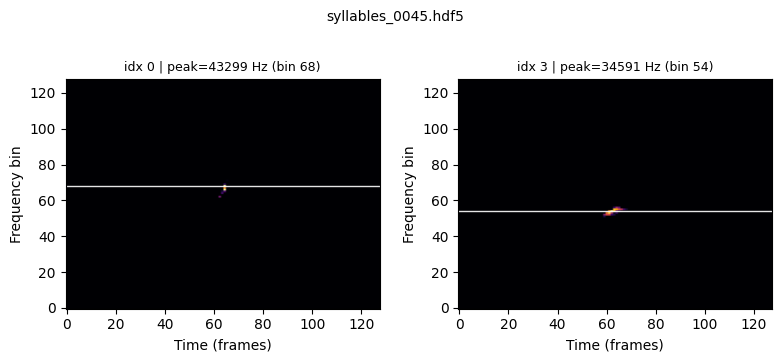

[47/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0046.hdf5
   wrote peak_freq_hz (min=1000.0, max=63204.7)


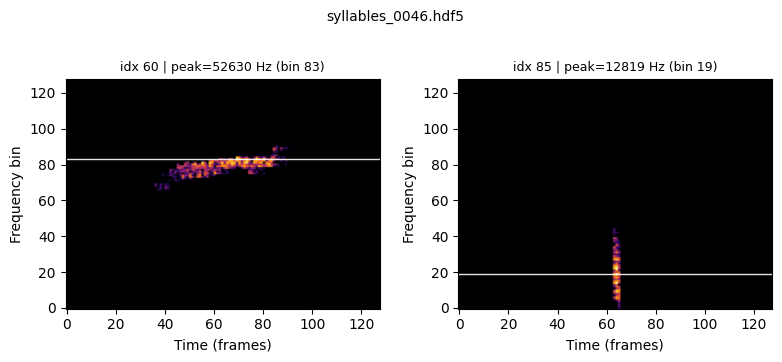

[48/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0047.hdf5
   wrote peak_freq_hz (min=1000.0, max=57606.3)


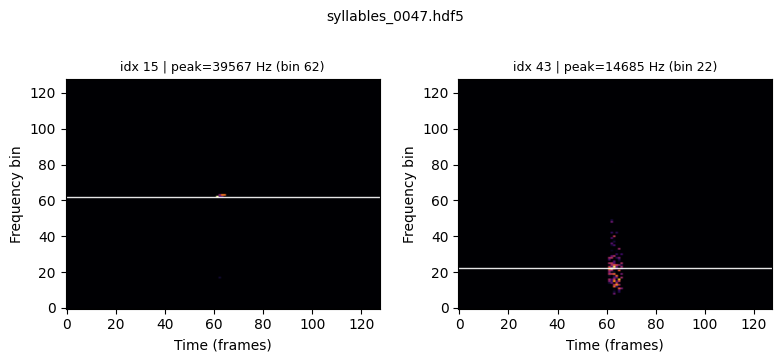

[49/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0048.hdf5
   wrote peak_freq_hz (min=1000.0, max=80000.0)


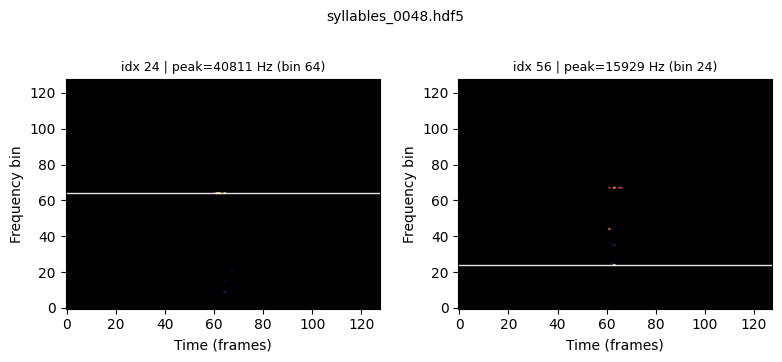

[50/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0049.hdf5
   wrote peak_freq_hz (min=1000.0, max=45165.4)


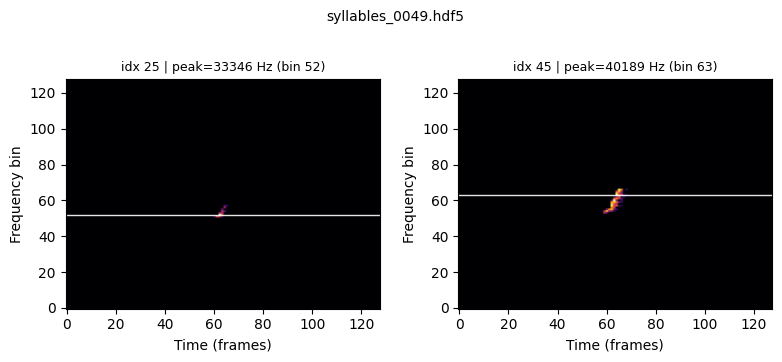

[51/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0050.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


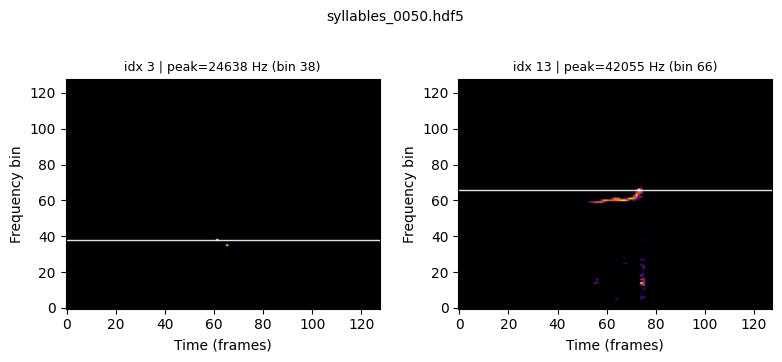

[52/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0051.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


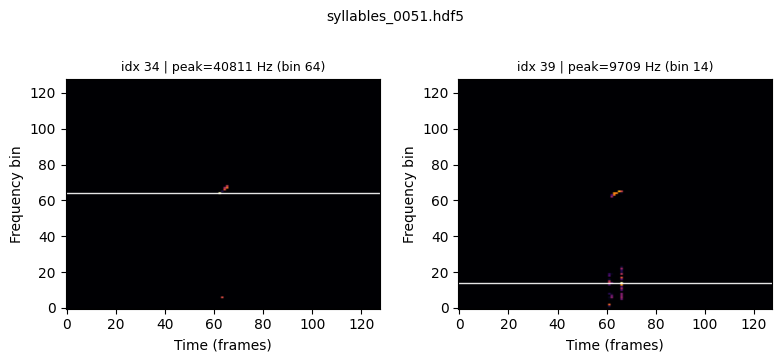

[53/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0052.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


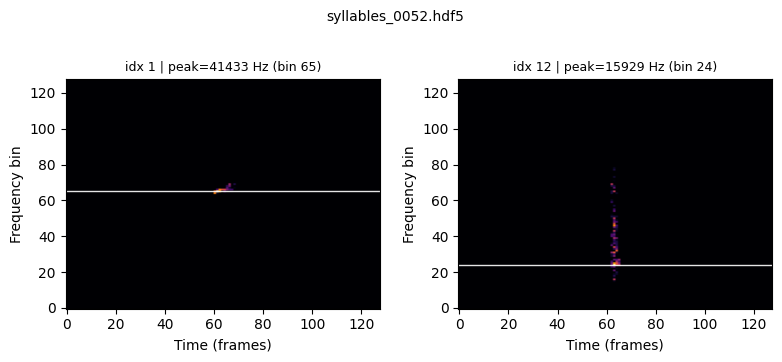

[54/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0053.hdf5
   wrote peak_freq_hz (min=1000.0, max=76267.7)


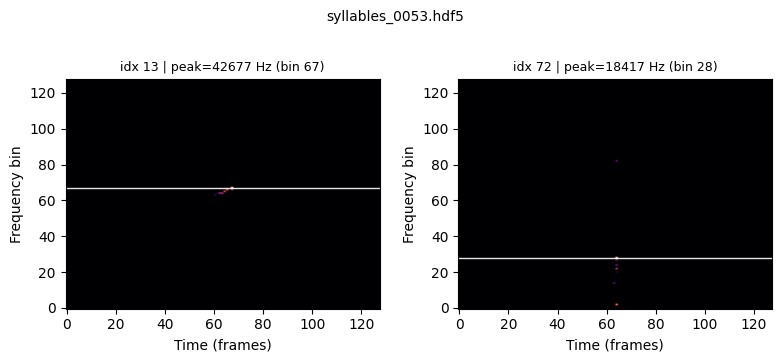

[55/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0054.hdf5
   wrote peak_freq_hz (min=1622.0, max=60716.5)


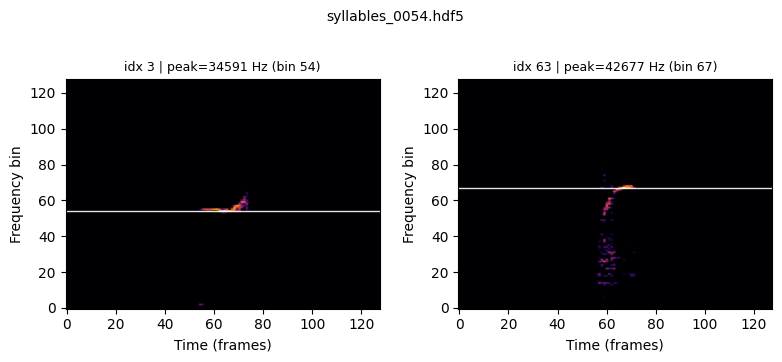

[56/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0055.hdf5
   wrote peak_freq_hz (min=1000.0, max=60716.5)


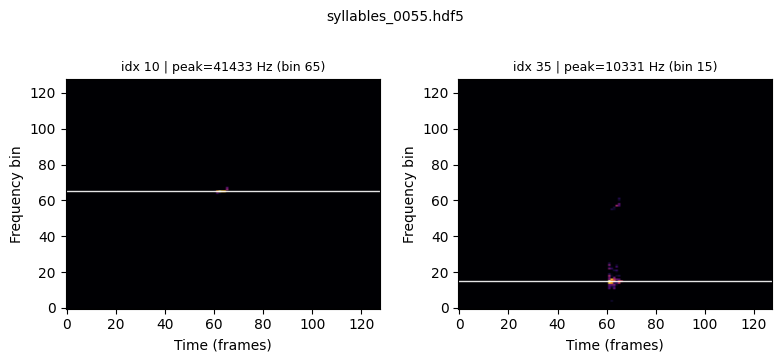

[57/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0056.hdf5
   wrote peak_freq_hz (min=1000.0, max=42677.2)


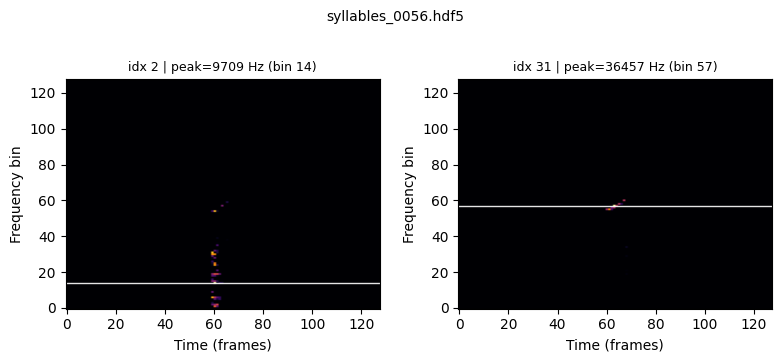

[58/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0057.hdf5
   wrote peak_freq_hz (min=1000.0, max=62582.7)


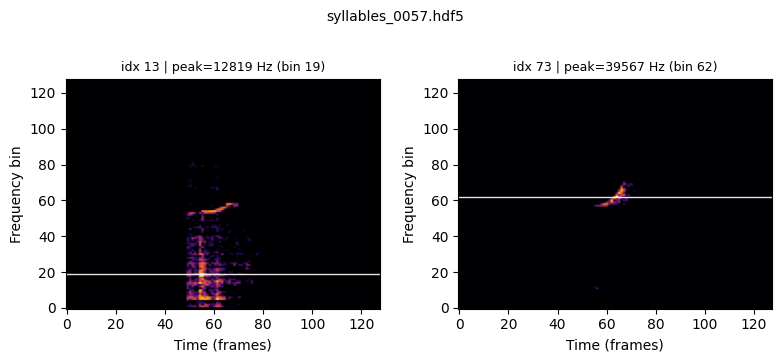

[59/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0058.hdf5
   wrote peak_freq_hz (min=1000.0, max=80000.0)


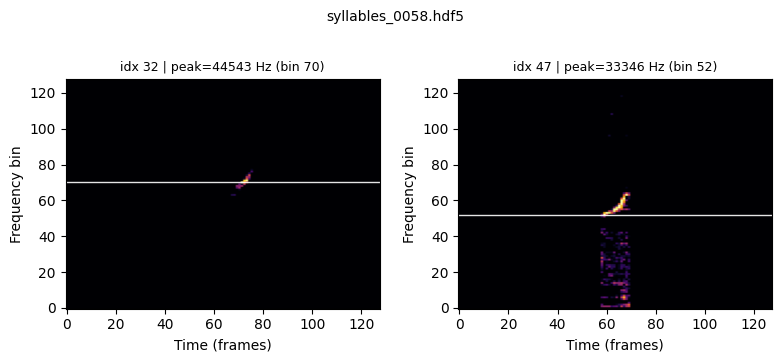

[60/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0059.hdf5
   wrote peak_freq_hz (min=1000.0, max=70669.3)


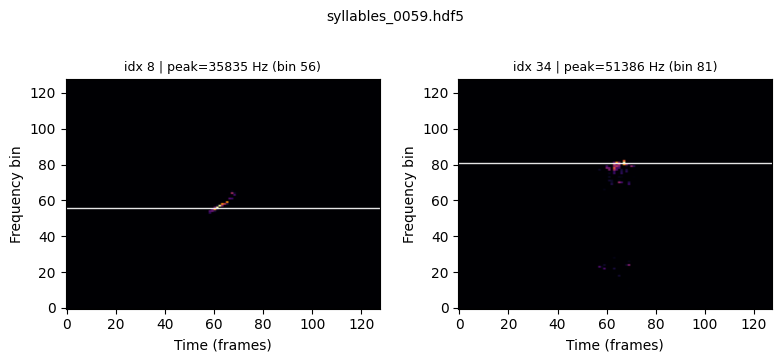

[61/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0060.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


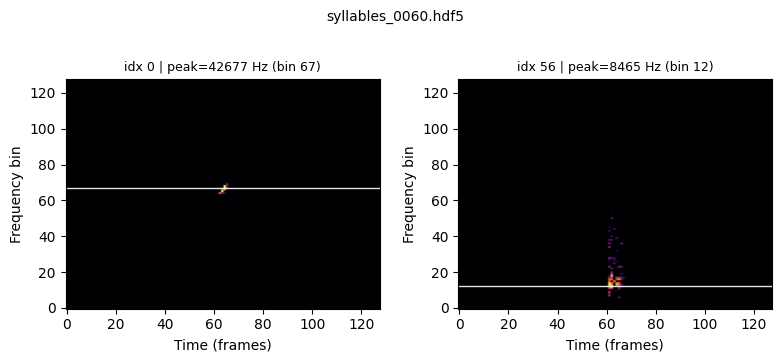

[62/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0061.hdf5
   wrote peak_freq_hz (min=1000.0, max=63826.8)


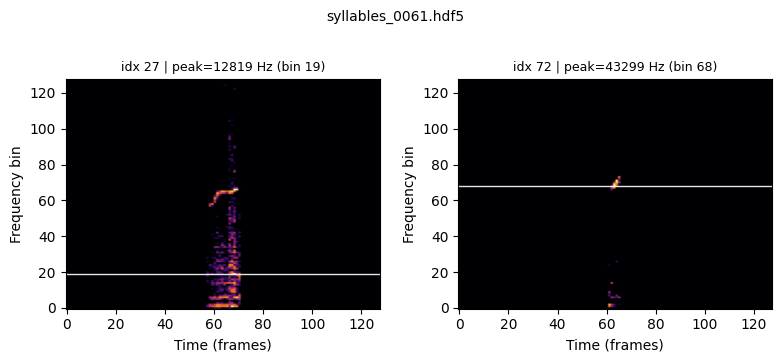

[63/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0062.hdf5
   wrote peak_freq_hz (min=1000.0, max=65692.9)


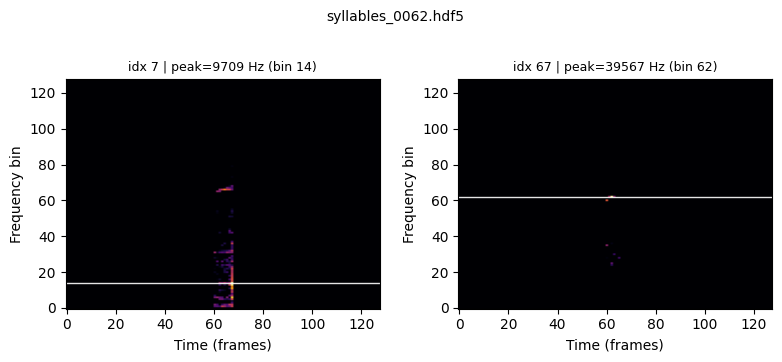

[64/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0063.hdf5
   wrote peak_freq_hz (min=1000.0, max=74401.6)


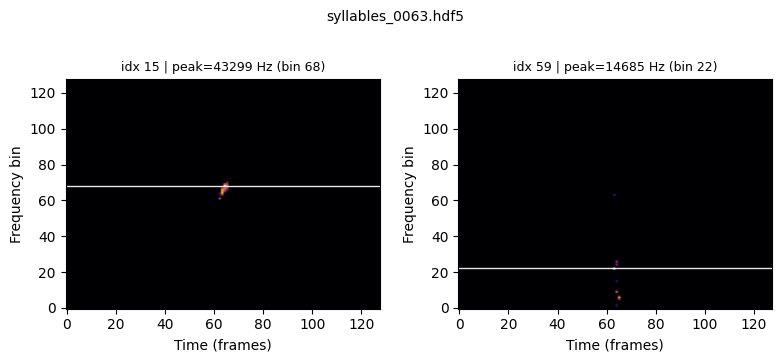

[65/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0064.hdf5
   wrote peak_freq_hz (min=1000.0, max=69425.2)


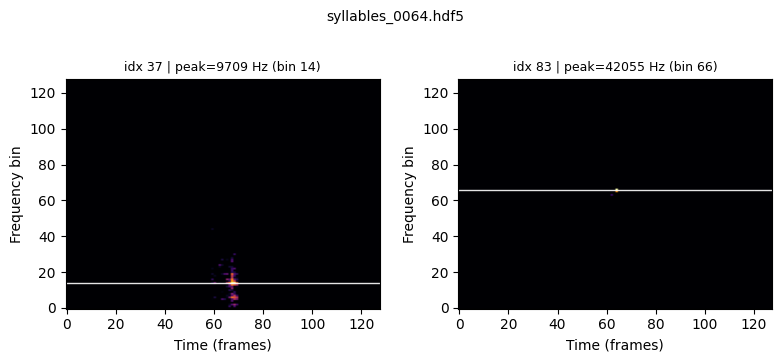

[66/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0065.hdf5
   wrote peak_freq_hz (min=1000.0, max=43921.3)


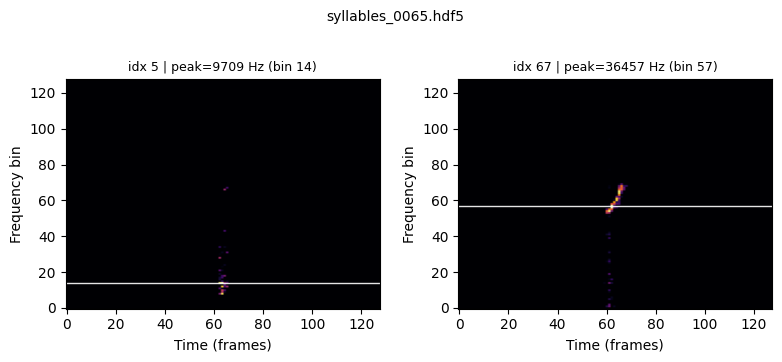

[67/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0066.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


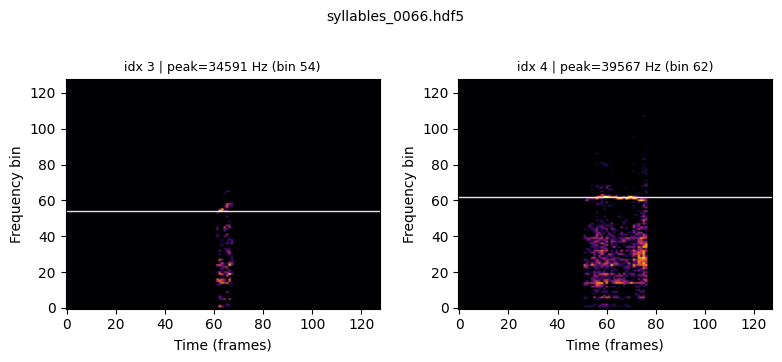

[68/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0067.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


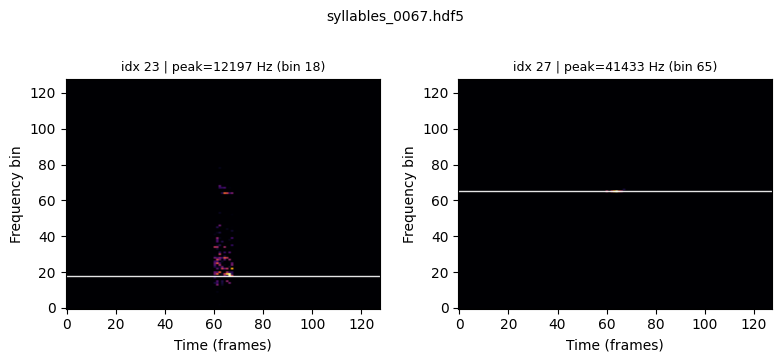

[69/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0068.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


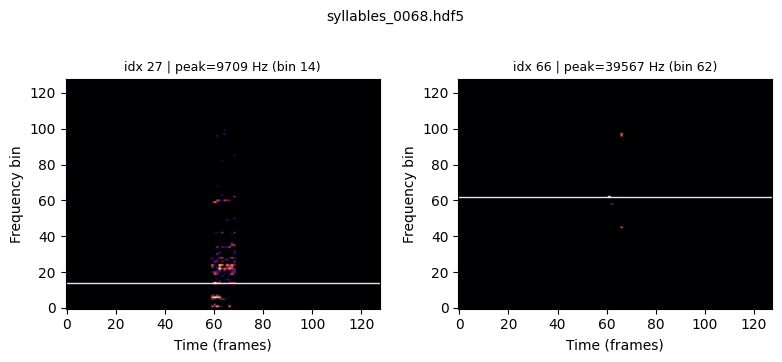

[70/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0069.hdf5
   wrote peak_freq_hz (min=1000.0, max=64448.8)


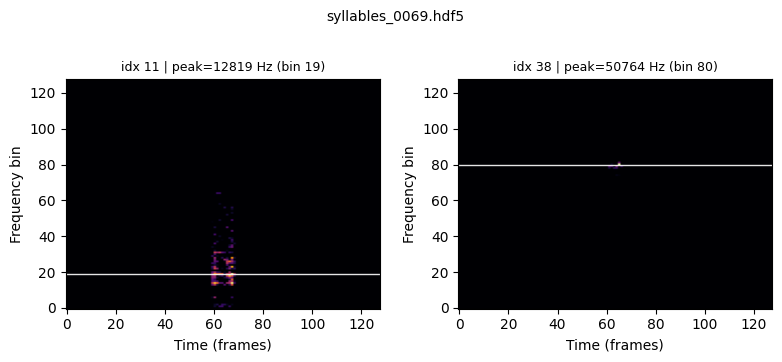

[71/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0070.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


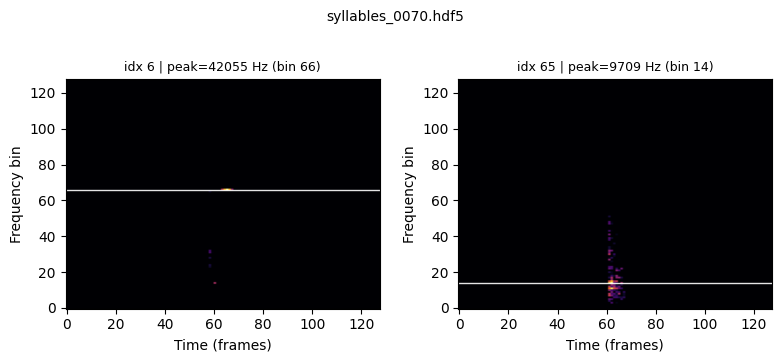

[72/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0071.hdf5
   wrote peak_freq_hz (min=1000.0, max=43921.3)


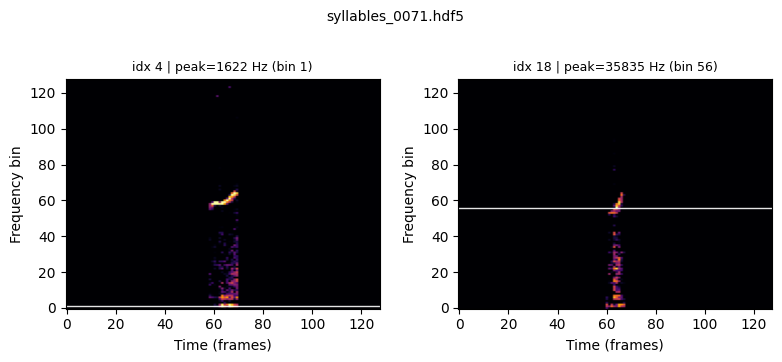

[73/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0072.hdf5
   wrote peak_freq_hz (min=1000.0, max=55740.2)


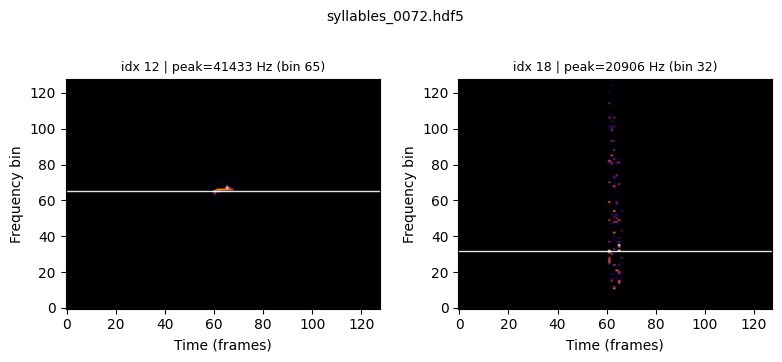

[74/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0073.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


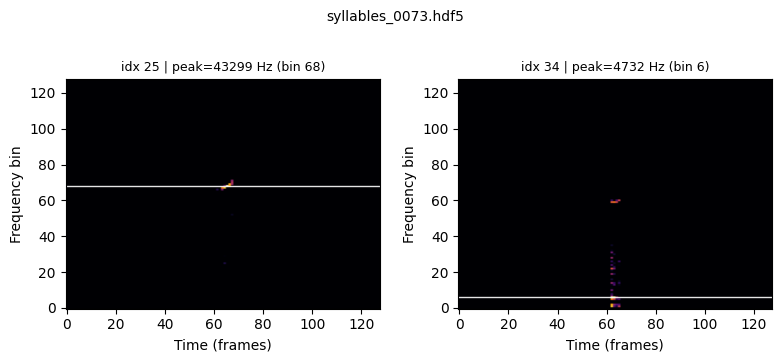

[75/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0074.hdf5
   wrote peak_freq_hz (min=1000.0, max=74401.6)


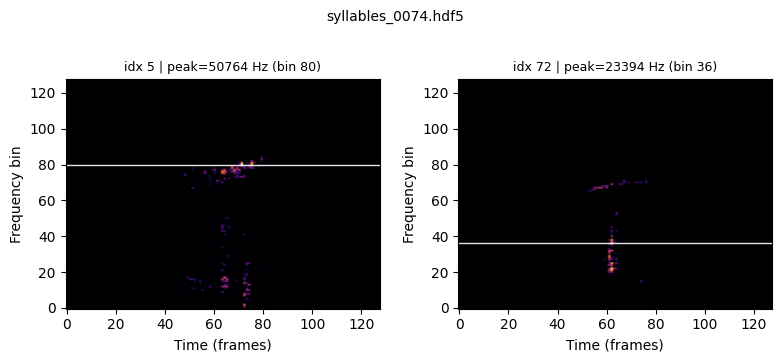

[76/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0075.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


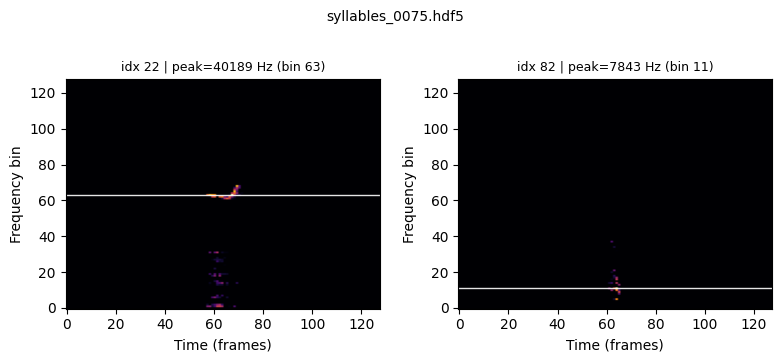

[77/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0076.hdf5
   wrote peak_freq_hz (min=1000.0, max=56362.2)


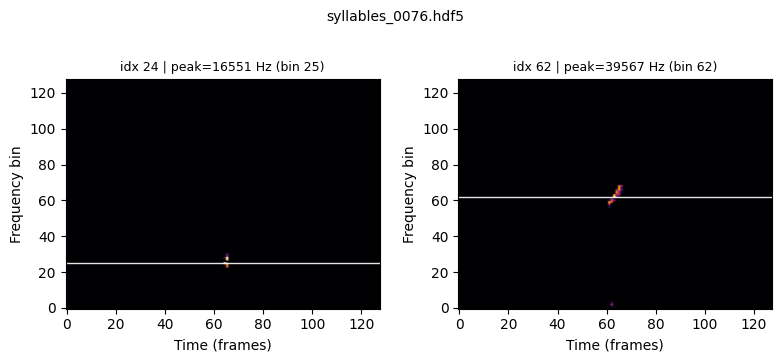

[78/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0077.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


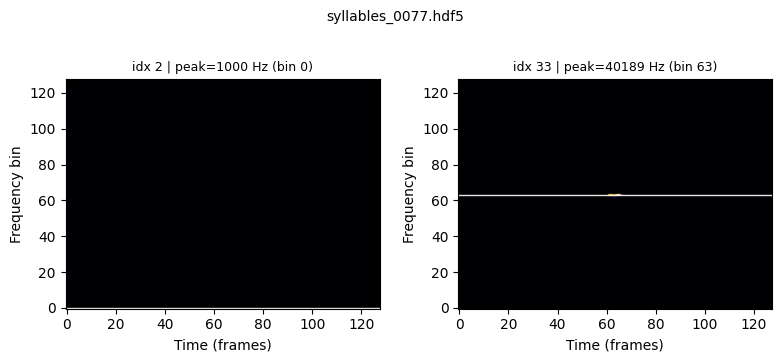

[79/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0078.hdf5
   wrote peak_freq_hz (min=1000.0, max=43921.3)


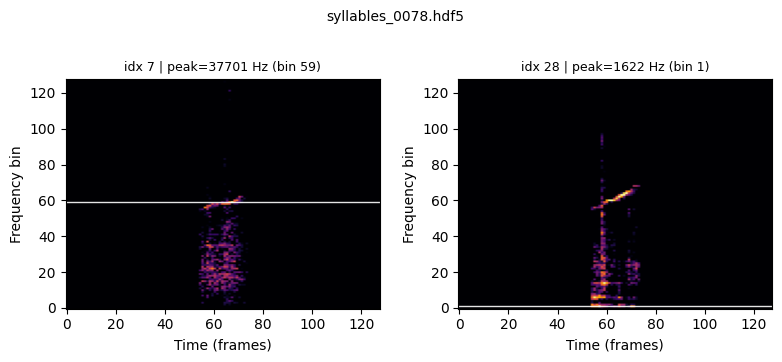

[80/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0079.hdf5
   wrote peak_freq_hz (min=1000.0, max=73779.5)


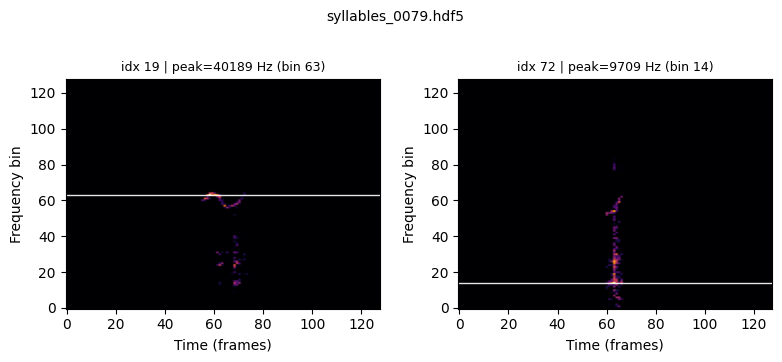

[81/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0080.hdf5
   wrote peak_freq_hz (min=1000.0, max=60716.5)


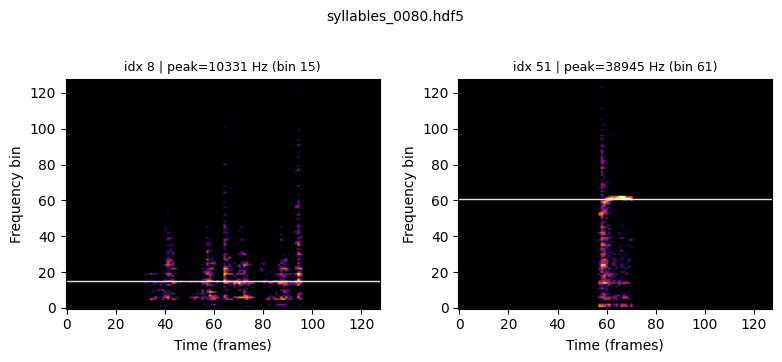

[82/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0081.hdf5
   wrote peak_freq_hz (min=1000.0, max=62582.7)


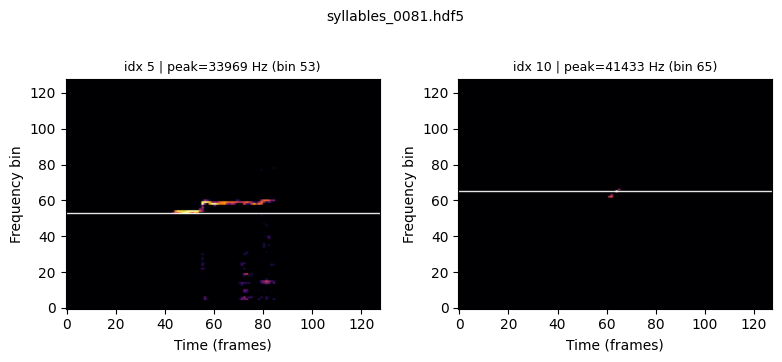

[83/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0082.hdf5
   wrote peak_freq_hz (min=1000.0, max=59472.4)


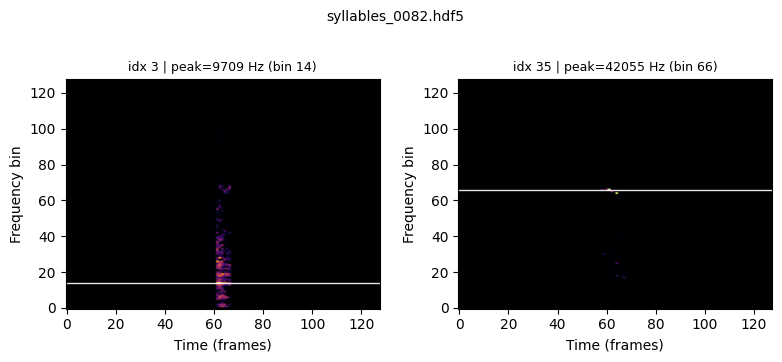

[84/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0083.hdf5
   wrote peak_freq_hz (min=1000.0, max=44543.3)


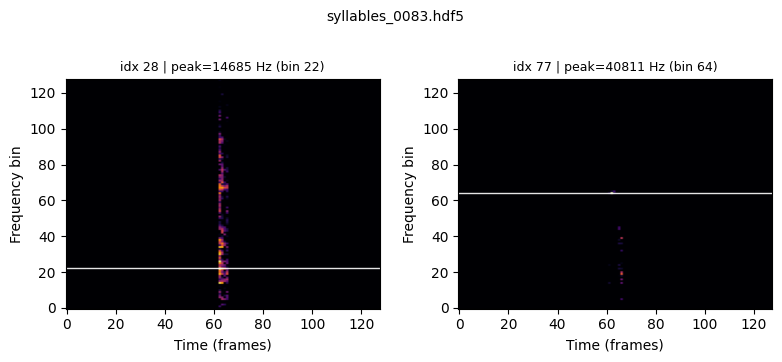

[85/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0084.hdf5
   wrote peak_freq_hz (min=1000.0, max=43299.2)


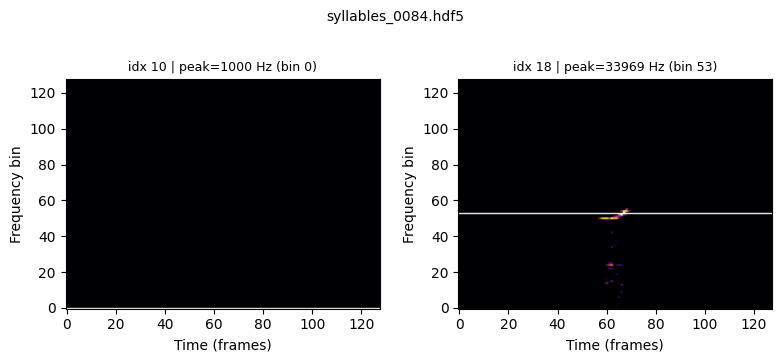

[86/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0085.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


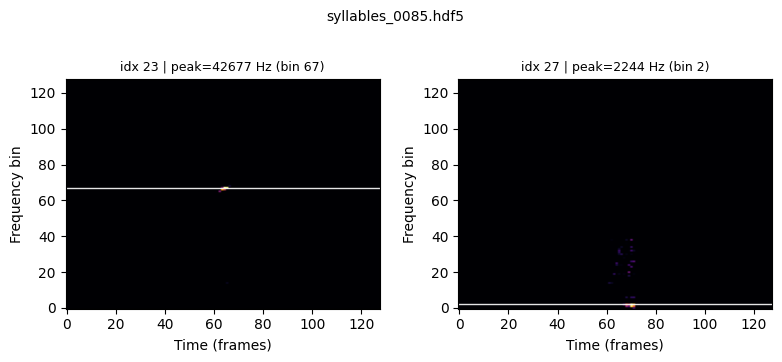

[87/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0086.hdf5
   wrote peak_freq_hz (min=1000.0, max=73157.5)


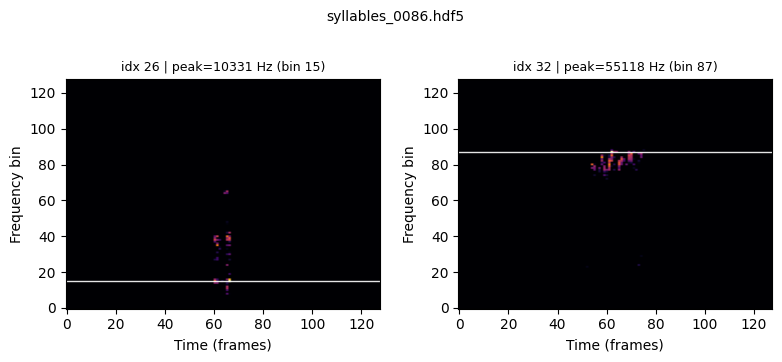

[88/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0087.hdf5
   wrote peak_freq_hz (min=1000.0, max=71913.4)


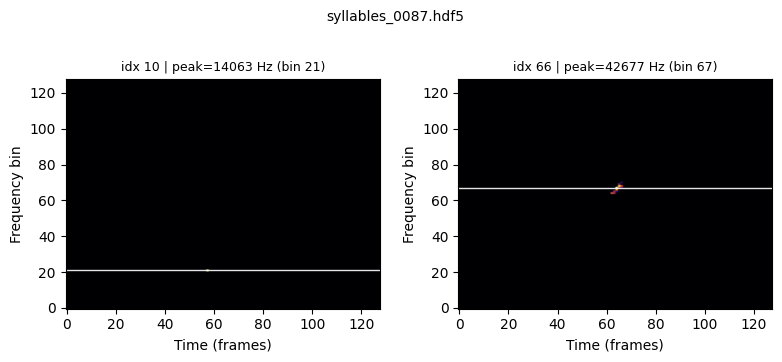

[89/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0088.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


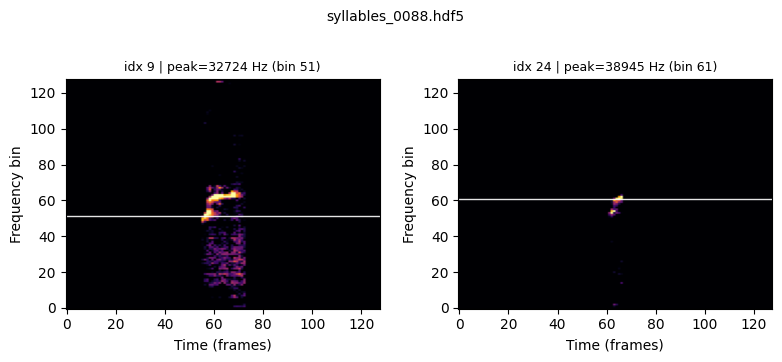

[90/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0089.hdf5
   wrote peak_freq_hz (min=1622.0, max=61338.6)


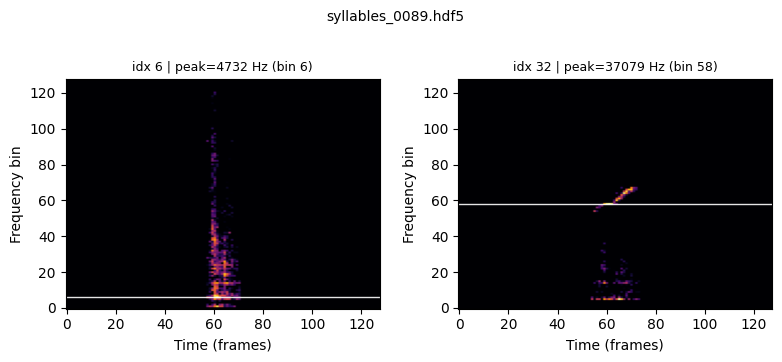

[91/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0090.hdf5
   wrote peak_freq_hz (min=1000.0, max=45787.4)


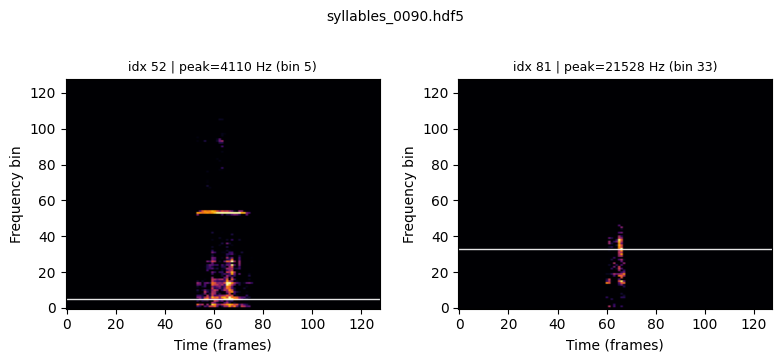

[92/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0091.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


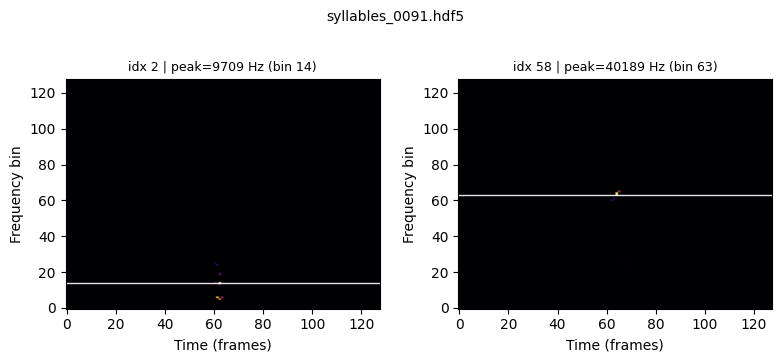

[93/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0092.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


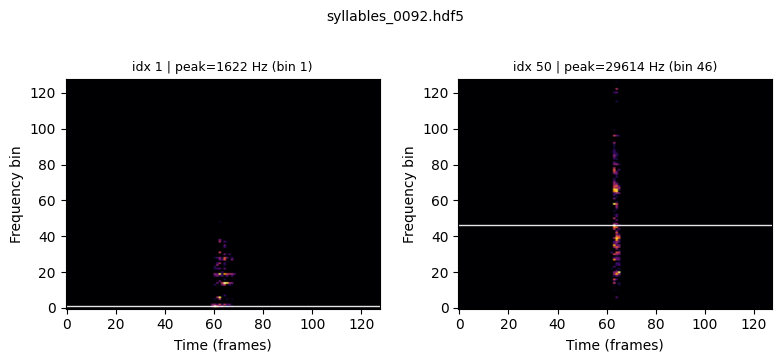

[94/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0093.hdf5
   wrote peak_freq_hz (min=1000.0, max=58228.3)


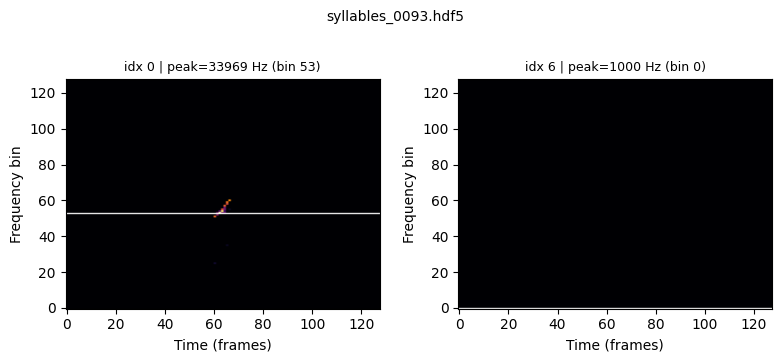

[95/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0094.hdf5
   wrote peak_freq_hz (min=1000.0, max=56362.2)


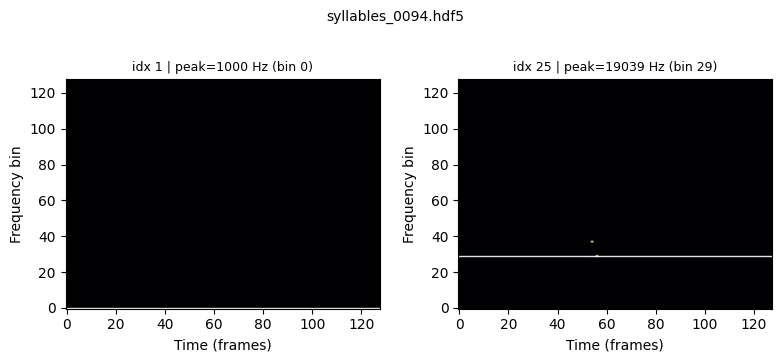

[96/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0095.hdf5
   wrote peak_freq_hz (min=1000.0, max=75023.6)


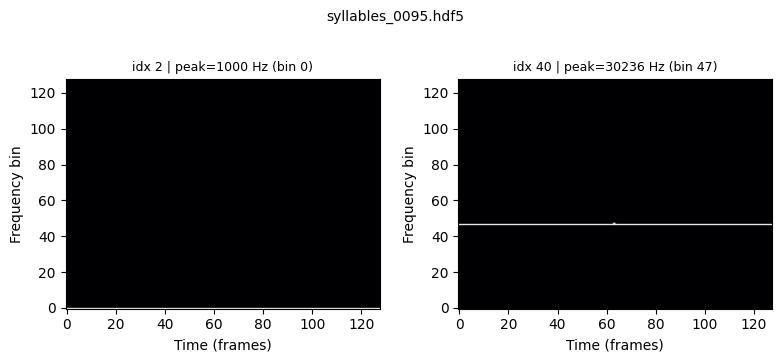

[97/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0096.hdf5
   wrote peak_freq_hz (min=1000.0, max=70669.3)


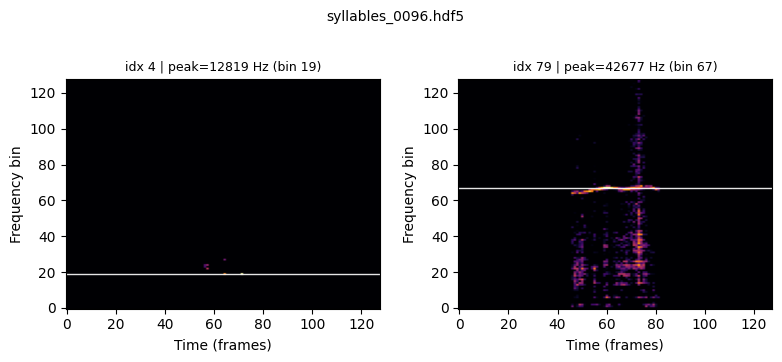

[98/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0097.hdf5
   wrote peak_freq_hz (min=1000.0, max=74401.6)


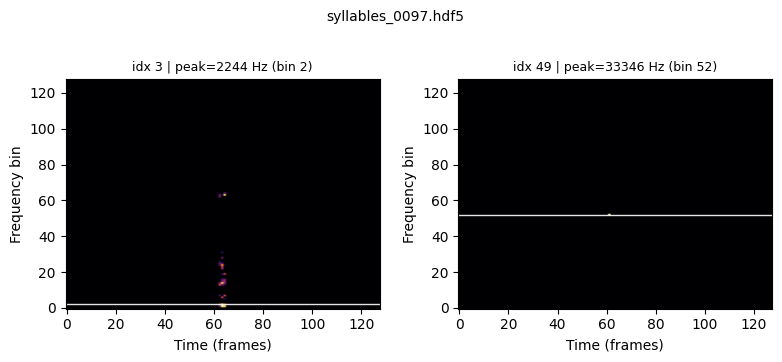

[99/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0098.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


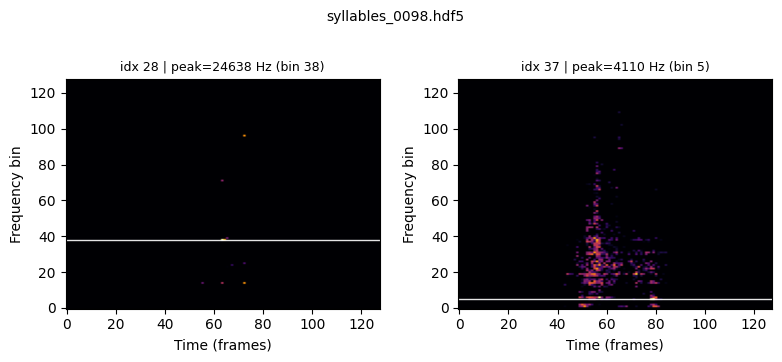

[100/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0099.hdf5
   wrote peak_freq_hz (min=1000.0, max=80000.0)


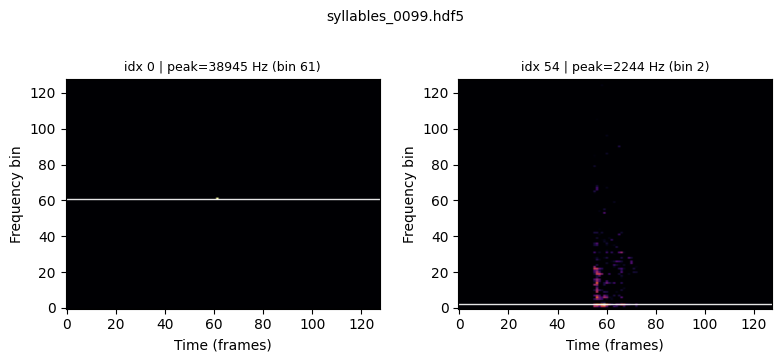

[101/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0100.hdf5
   wrote peak_freq_hz (min=1000.0, max=78755.9)


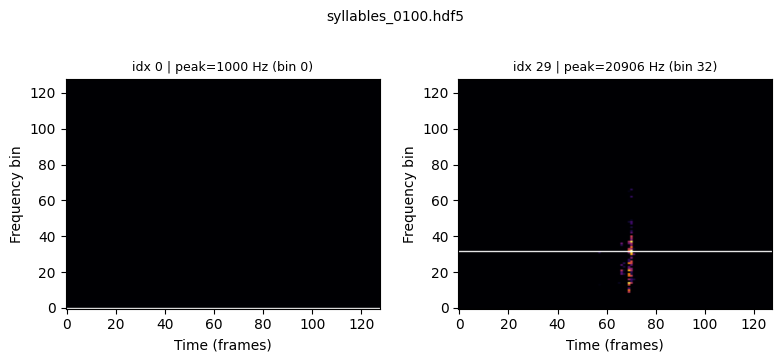

[102/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0101.hdf5
   wrote peak_freq_hz (min=1000.0, max=80000.0)


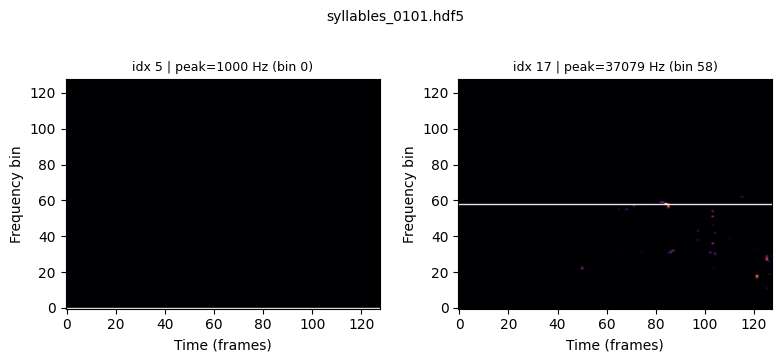

[103/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0102.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


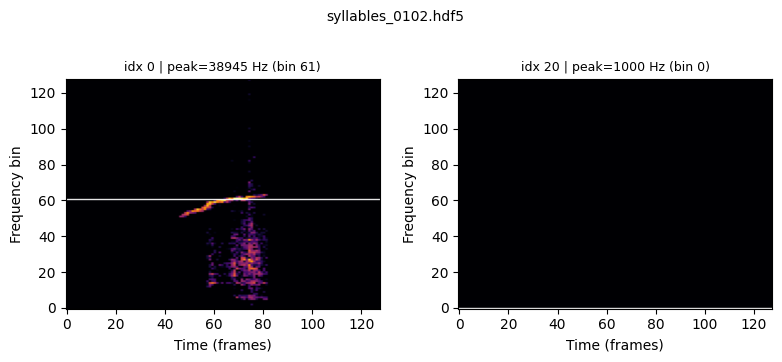

[104/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0103.hdf5
   wrote peak_freq_hz (min=1000.0, max=80000.0)


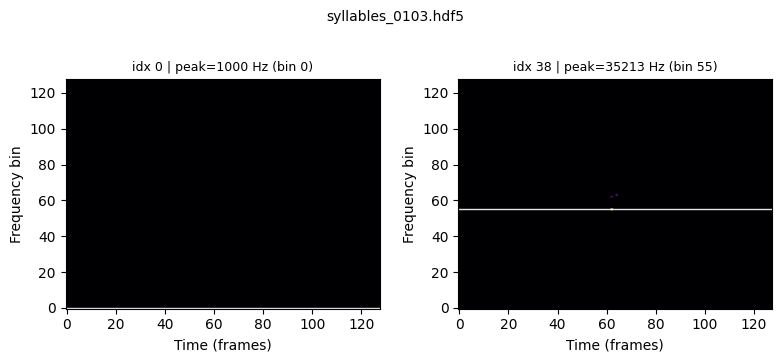

[105/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0104.hdf5
   wrote peak_freq_hz (min=1000.0, max=64448.8)


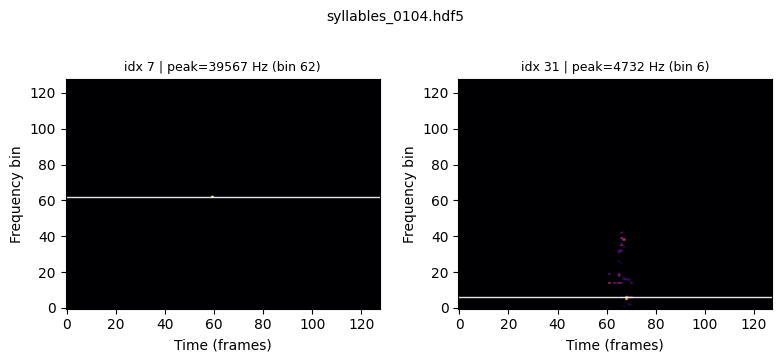

[106/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0105.hdf5
   wrote peak_freq_hz (min=1000.0, max=47653.5)


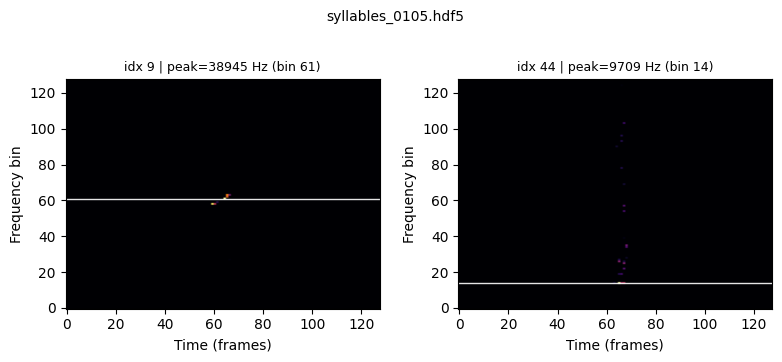

[107/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0106.hdf5
   wrote peak_freq_hz (min=1000.0, max=75023.6)


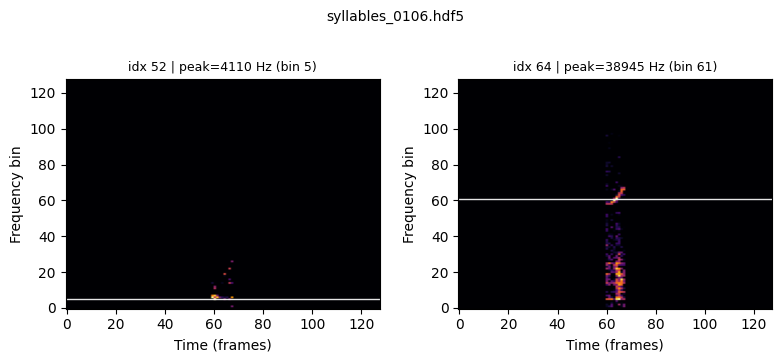

[108/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0107.hdf5
   wrote peak_freq_hz (min=1000.0, max=56362.2)


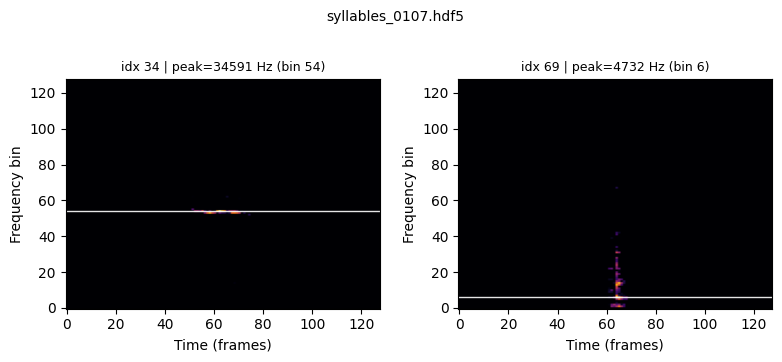

[109/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0108.hdf5
   wrote peak_freq_hz (min=1000.0, max=58228.3)


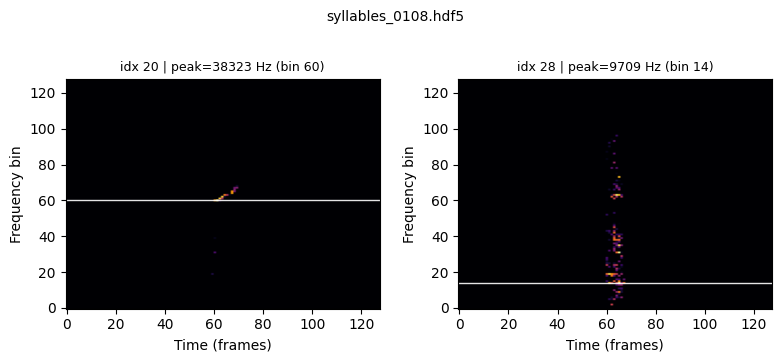

[110/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0109.hdf5
   wrote peak_freq_hz (min=1000.0, max=59472.4)


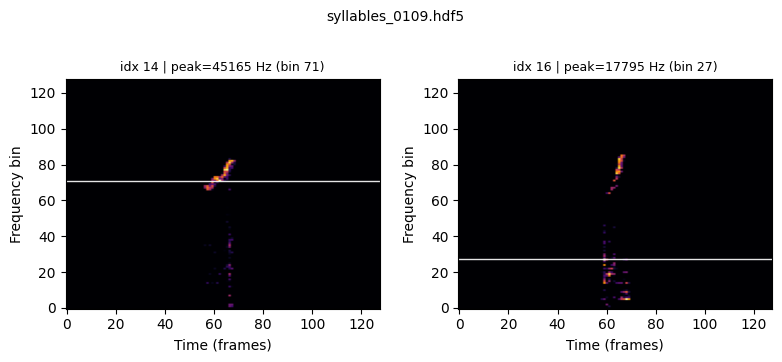

[111/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0110.hdf5
   wrote peak_freq_hz (min=1000.0, max=53874.0)


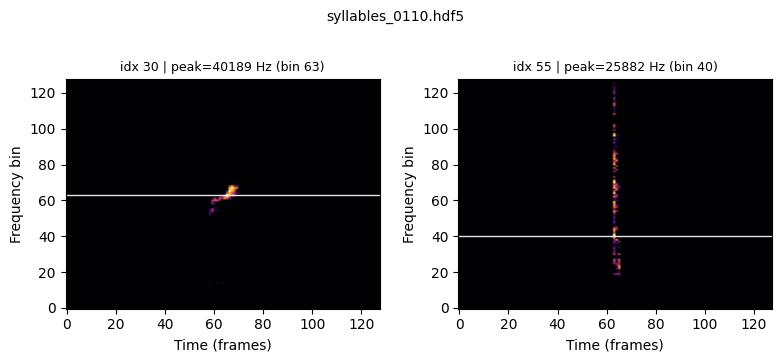

[112/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0111.hdf5
   wrote peak_freq_hz (min=1000.0, max=75023.6)


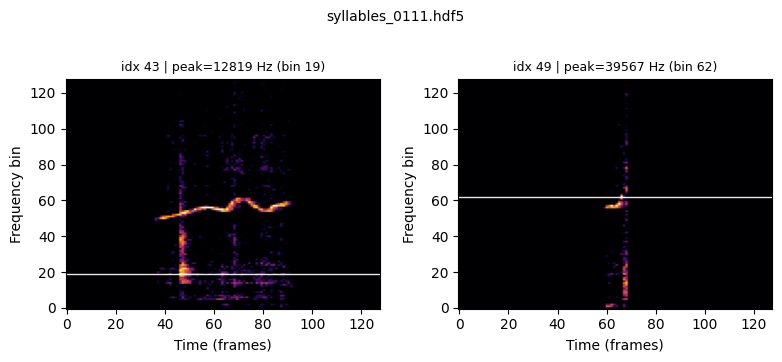

[113/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0112.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


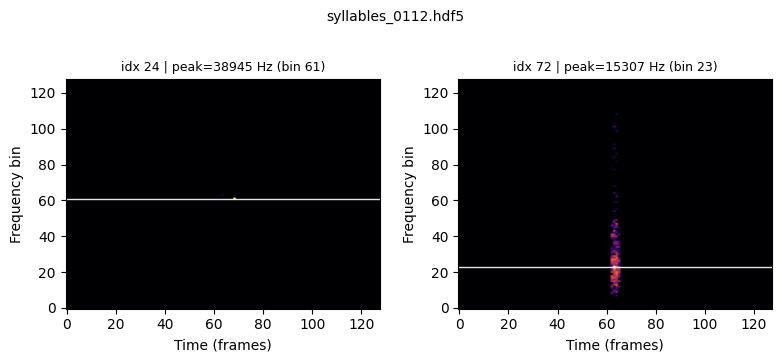

[114/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0113.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


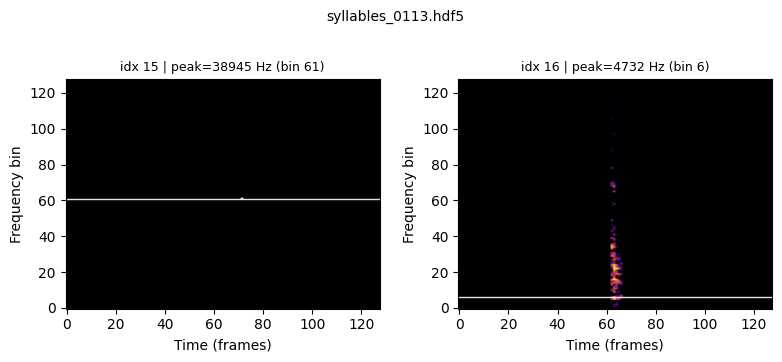

[115/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0114.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


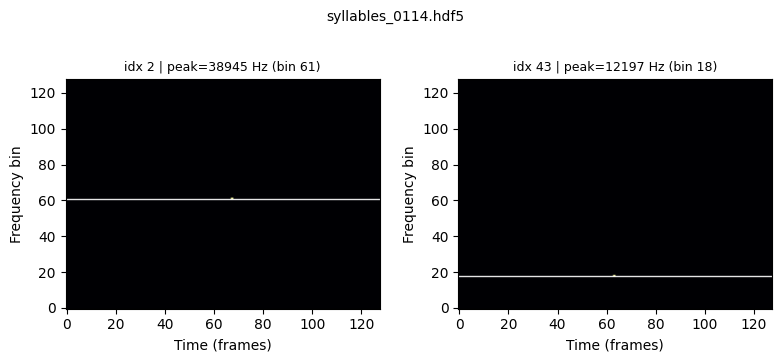

[116/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0115.hdf5
   wrote peak_freq_hz (min=1000.0, max=43299.2)


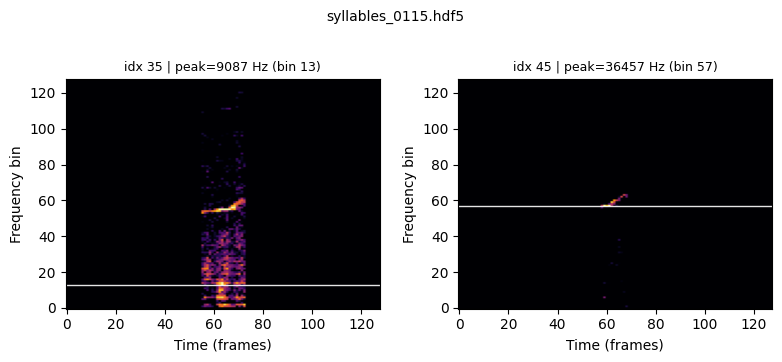

[117/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0116.hdf5
   wrote peak_freq_hz (min=1000.0, max=53252.0)


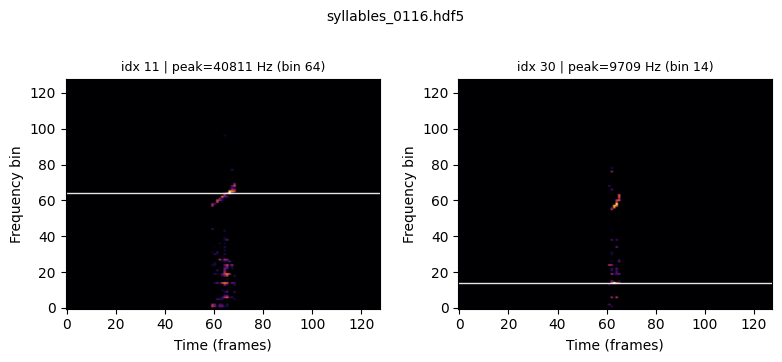

[118/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0117.hdf5
   wrote peak_freq_hz (min=1000.0, max=44543.3)


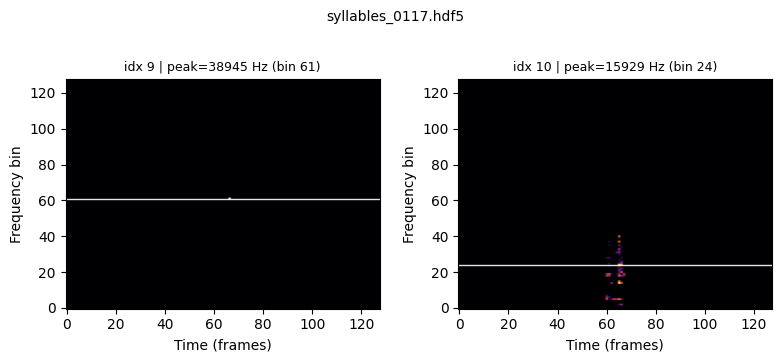

[119/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0118.hdf5
   wrote peak_freq_hz (min=1000.0, max=56984.3)


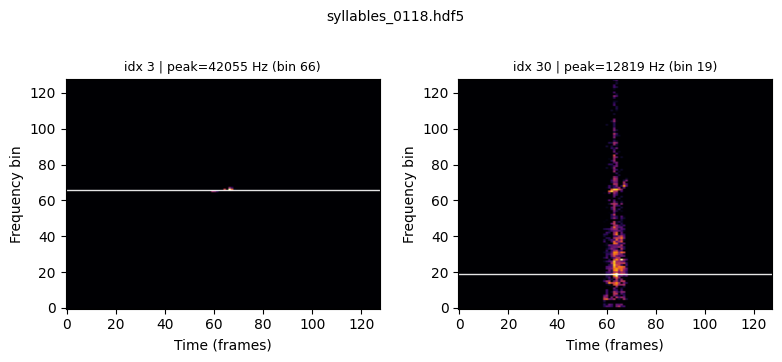

[120/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0119.hdf5
   wrote peak_freq_hz (min=1000.0, max=59472.4)


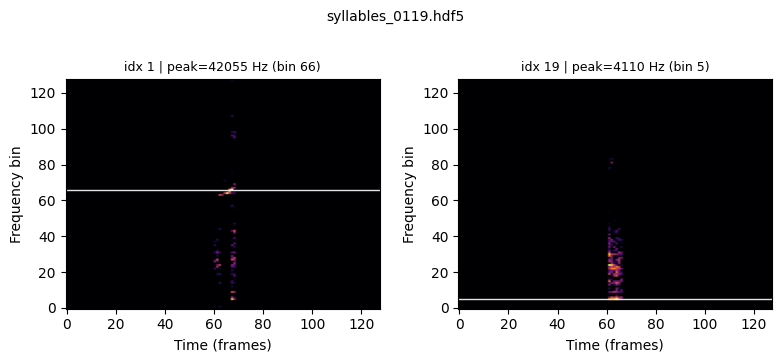

[121/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0120.hdf5
   wrote peak_freq_hz (min=1000.0, max=58228.3)


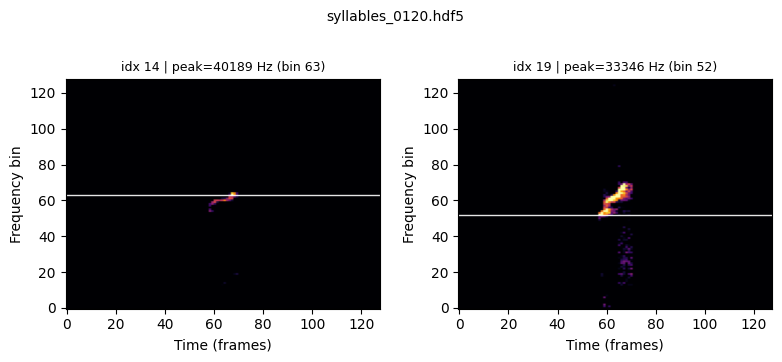

[122/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0121.hdf5
   wrote peak_freq_hz (min=1000.0, max=77511.8)


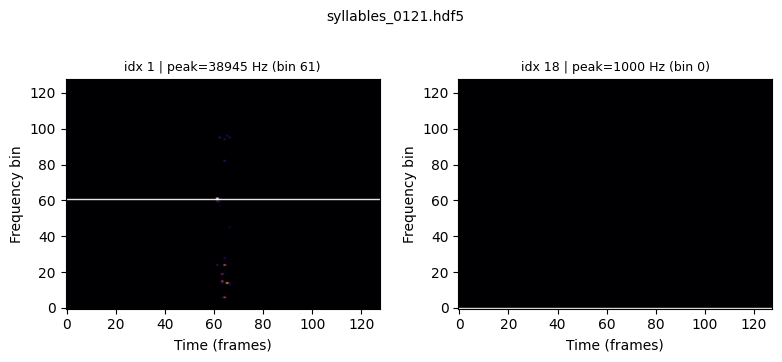

[123/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0122.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


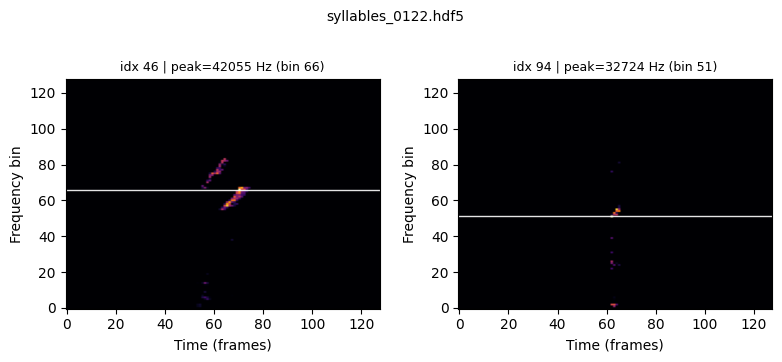

[124/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0123.hdf5
   wrote peak_freq_hz (min=1000.0, max=48897.6)


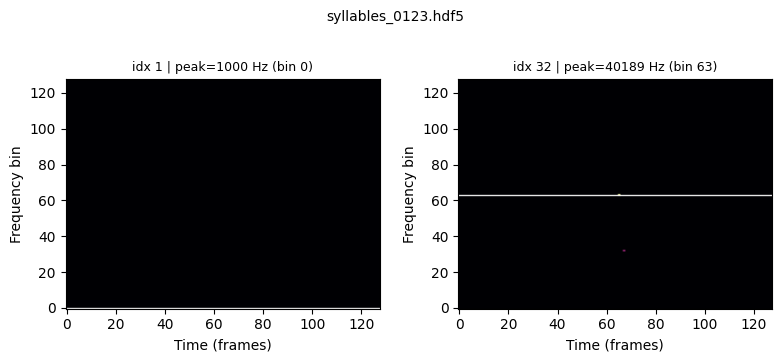

[125/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0124.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


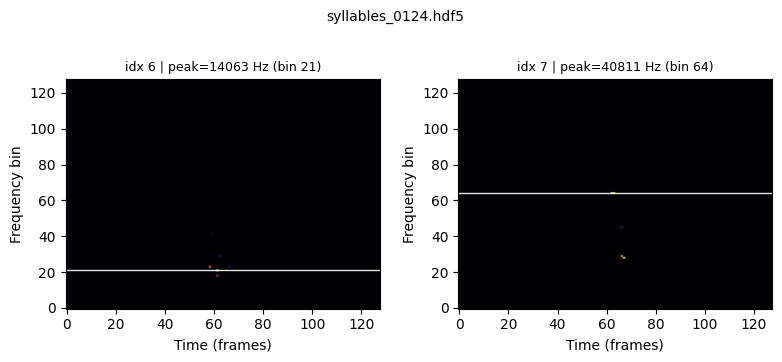

[126/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0125.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


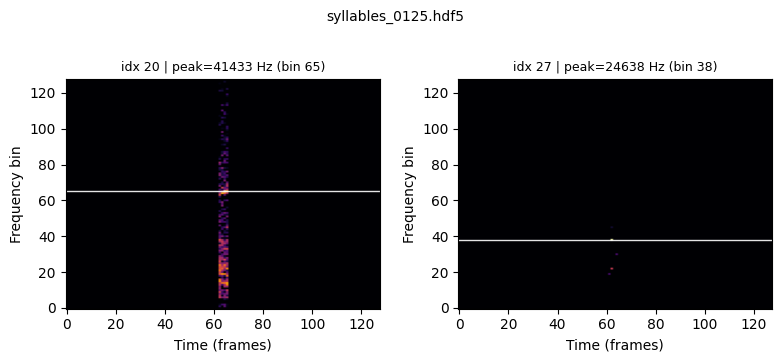

[127/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0126.hdf5
   wrote peak_freq_hz (min=1000.0, max=45165.4)


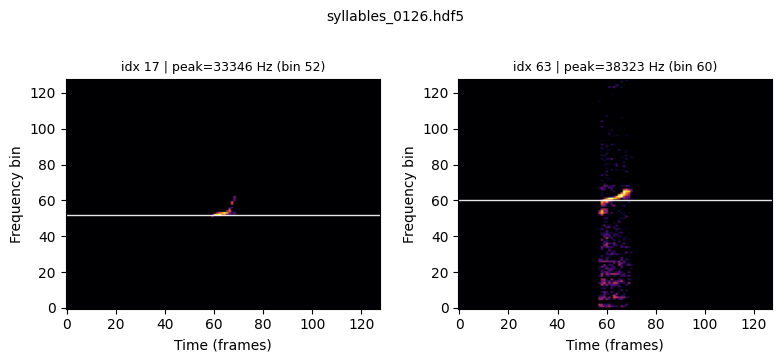

[128/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0127.hdf5
   wrote peak_freq_hz (min=1622.0, max=52629.9)


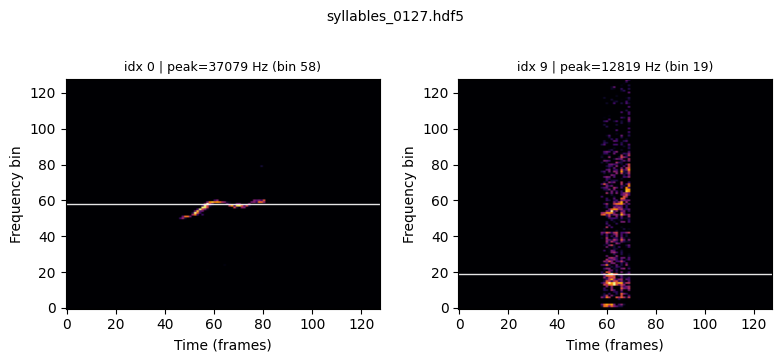

[129/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0128.hdf5
   wrote peak_freq_hz (min=1622.0, max=50141.7)


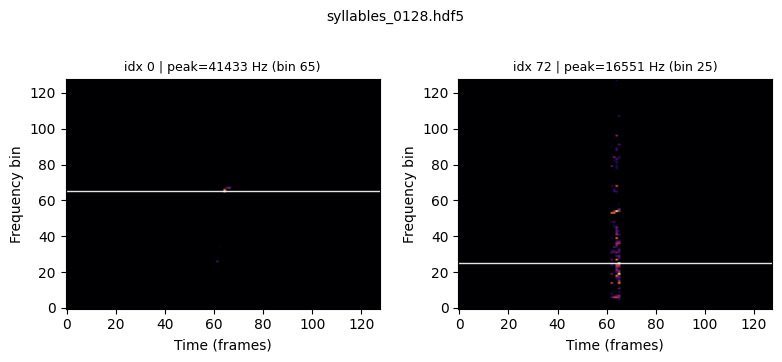

[130/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0129.hdf5
   wrote peak_freq_hz (min=1622.0, max=54496.1)


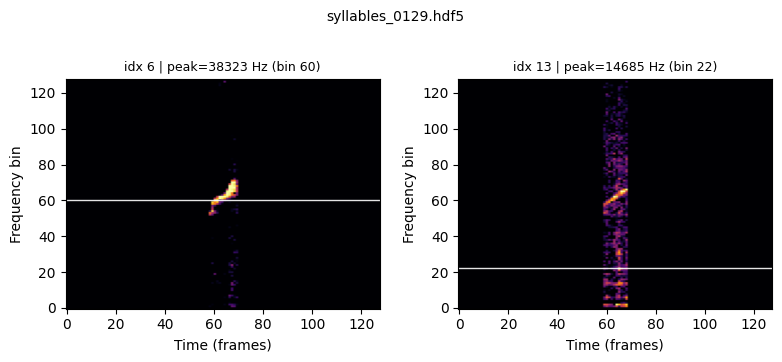

[131/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0130.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


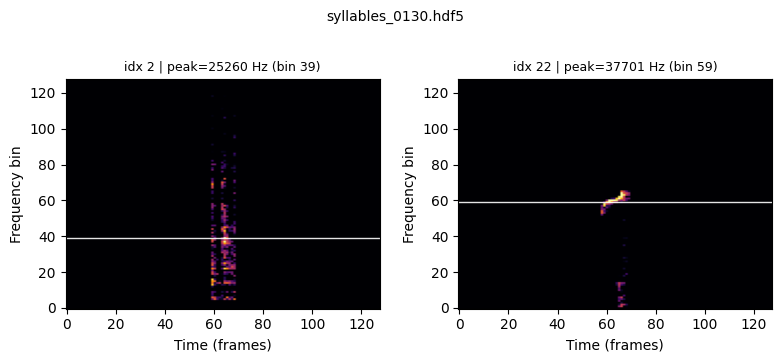

[132/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0131.hdf5
   wrote peak_freq_hz (min=1000.0, max=45165.4)


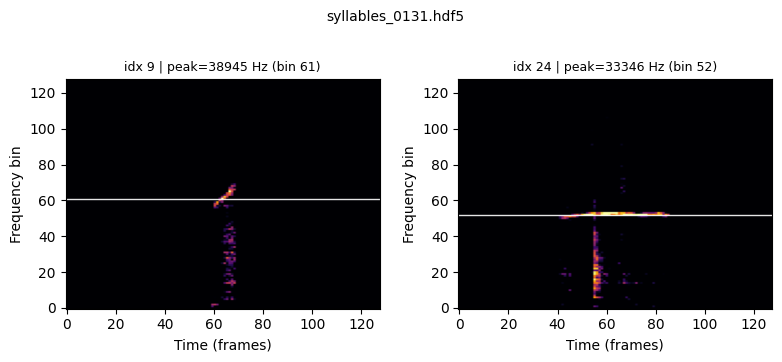

[133/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0132.hdf5
   wrote peak_freq_hz (min=1000.0, max=61960.6)


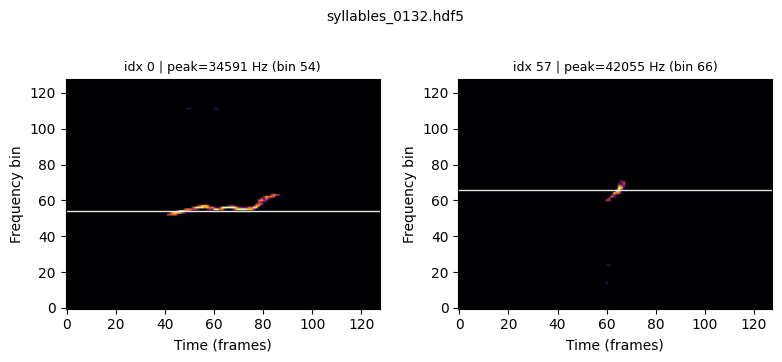

[134/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0133.hdf5
   wrote peak_freq_hz (min=1000.0, max=55740.2)


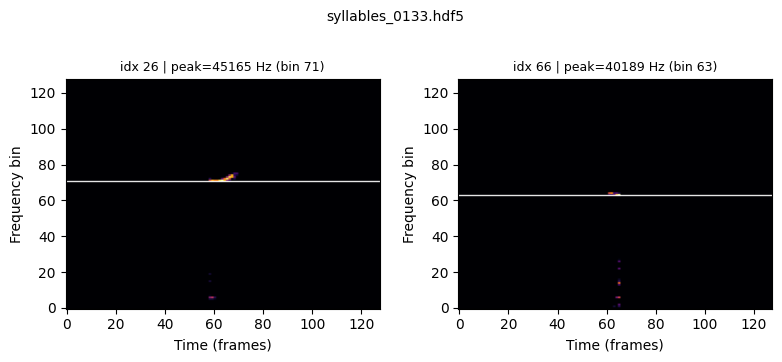

[135/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0134.hdf5
   wrote peak_freq_hz (min=1000.0, max=57606.3)


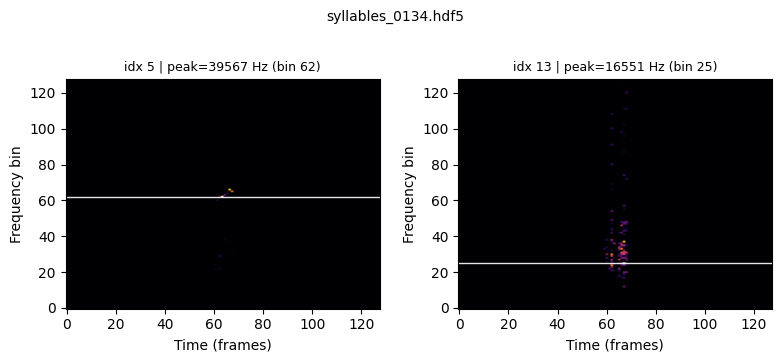

[136/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0135.hdf5
   wrote peak_freq_hz (min=1622.0, max=44543.3)


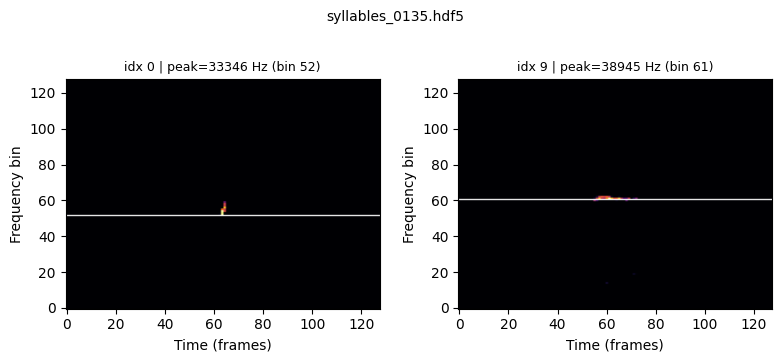

[137/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0136.hdf5
   wrote peak_freq_hz (min=1000.0, max=65692.9)


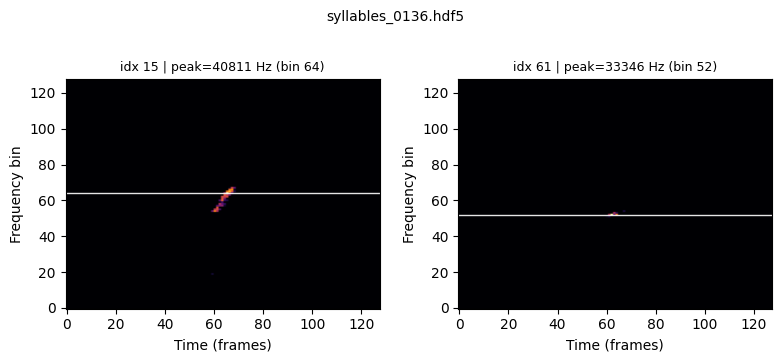

[138/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0137.hdf5
   wrote peak_freq_hz (min=1622.0, max=66937.0)


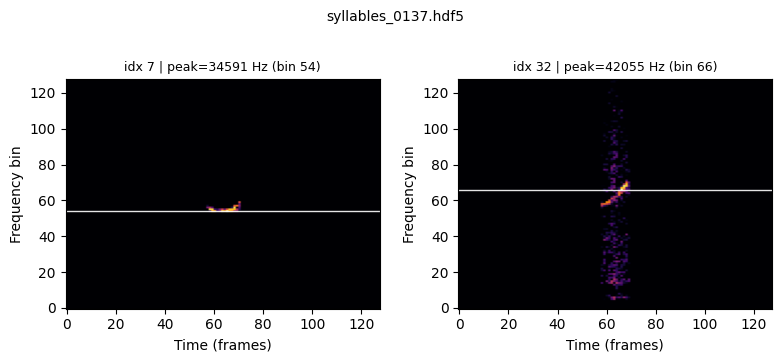

[139/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0138.hdf5
   wrote peak_freq_hz (min=1000.0, max=53252.0)


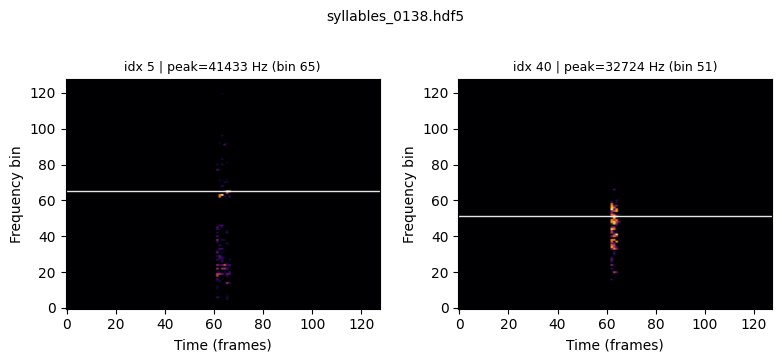

[140/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0139.hdf5
   wrote peak_freq_hz (min=1000.0, max=63826.8)


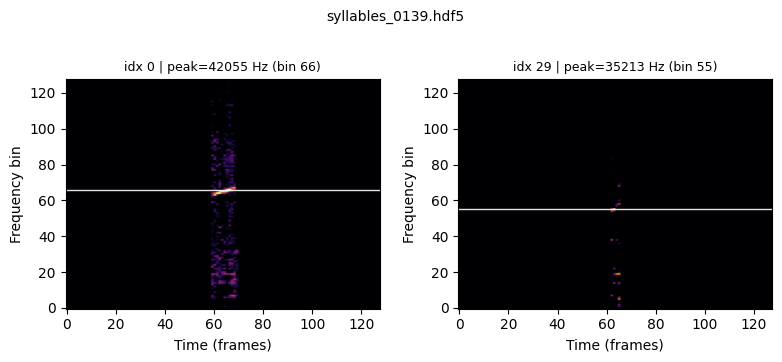

[141/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0140.hdf5
   wrote peak_freq_hz (min=1000.0, max=42677.2)


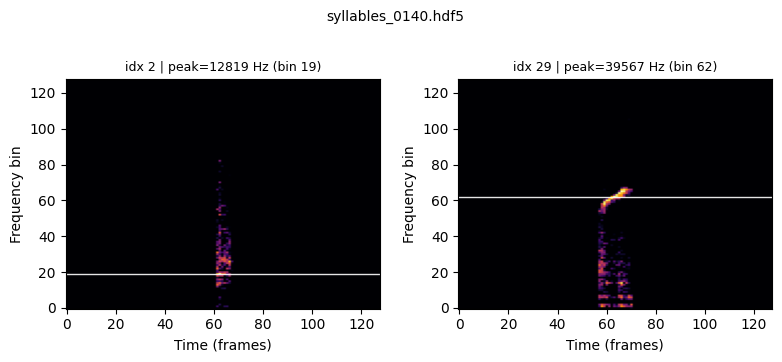

[142/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0141.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


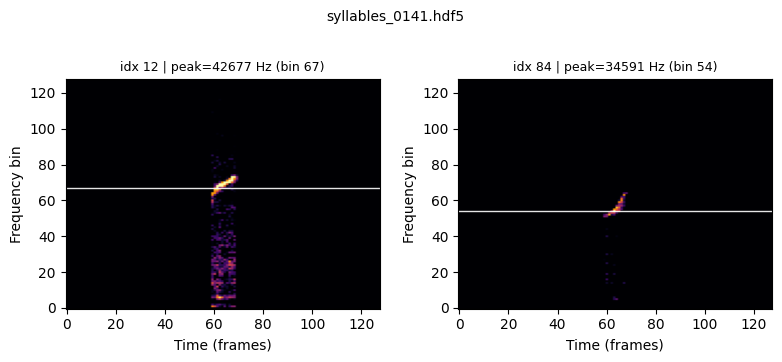

[143/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0142.hdf5
   wrote peak_freq_hz (min=1622.0, max=60094.5)


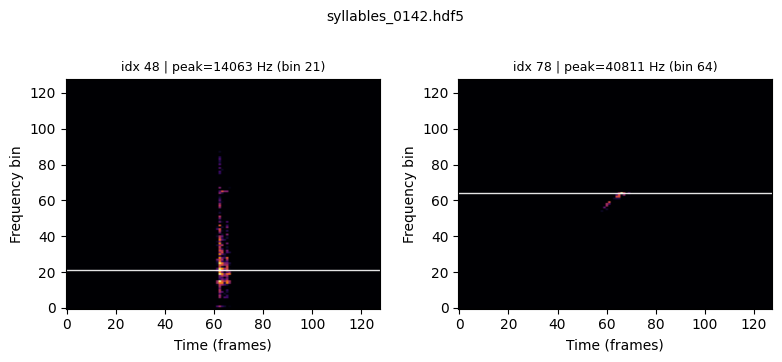

[144/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0143.hdf5
   wrote peak_freq_hz (min=1622.0, max=61960.6)


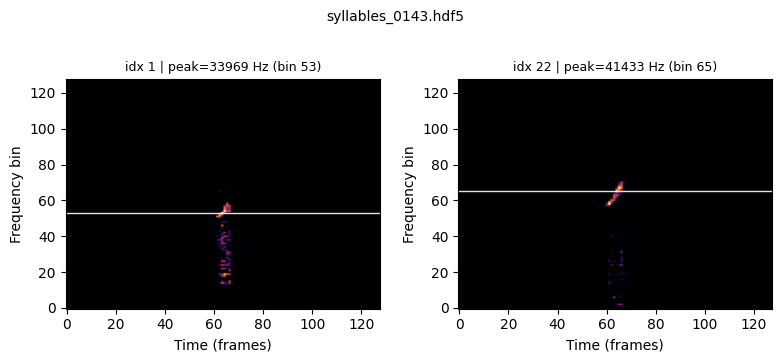

[145/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0144.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


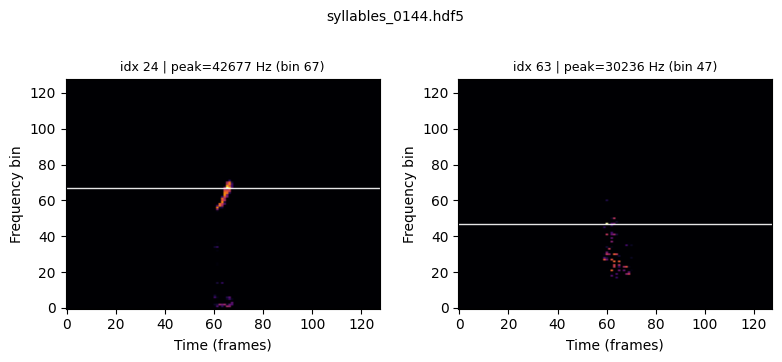

[146/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0145.hdf5
   wrote peak_freq_hz (min=1622.0, max=46409.4)


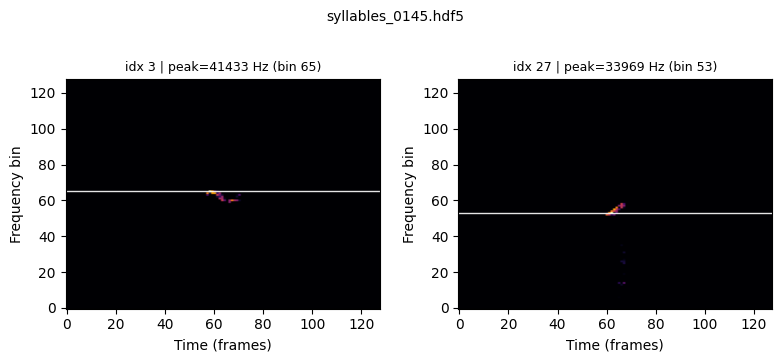

[147/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0146.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


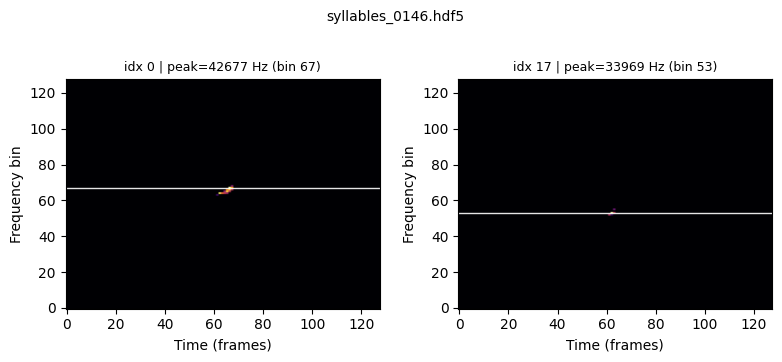

[148/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0147.hdf5
   wrote peak_freq_hz (min=1000.0, max=64448.8)


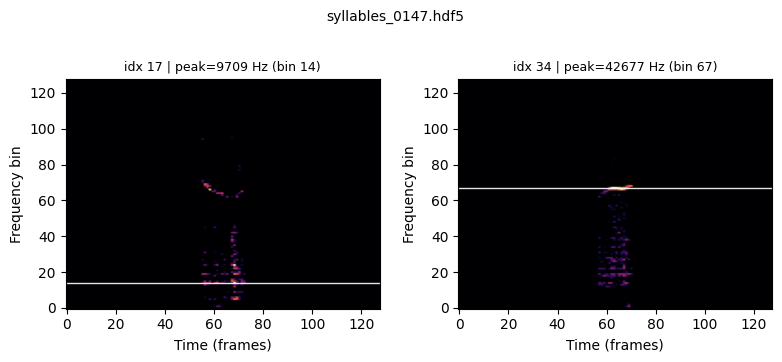

[149/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0148.hdf5
   wrote peak_freq_hz (min=1622.0, max=50141.7)


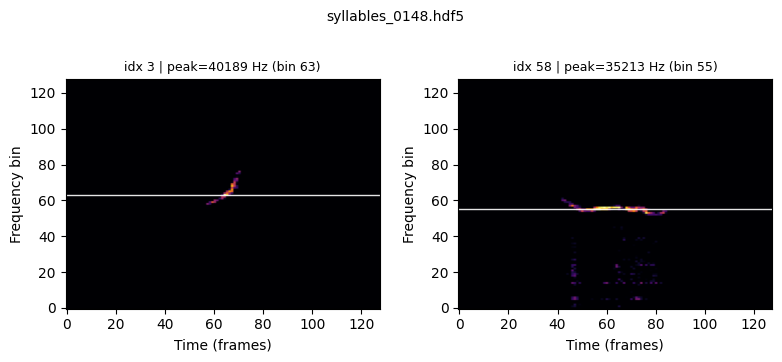

[150/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0149.hdf5
   wrote peak_freq_hz (min=1622.0, max=49519.7)


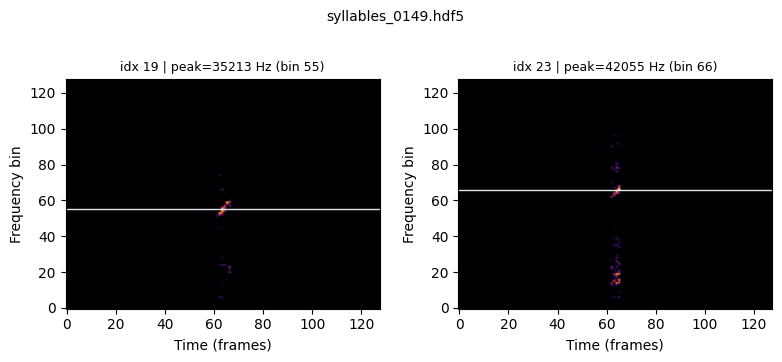

[151/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0150.hdf5
   wrote peak_freq_hz (min=1000.0, max=56984.3)


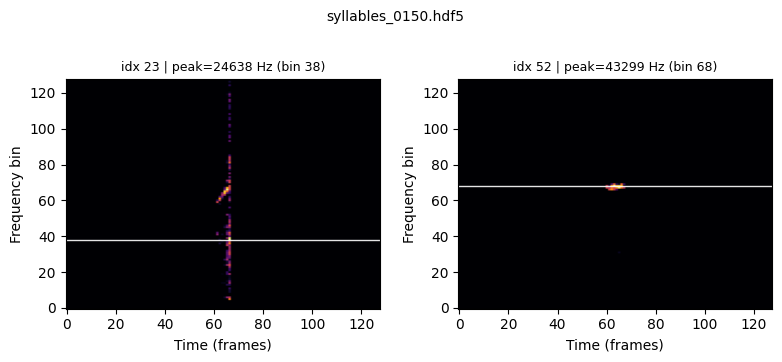

[152/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0151.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


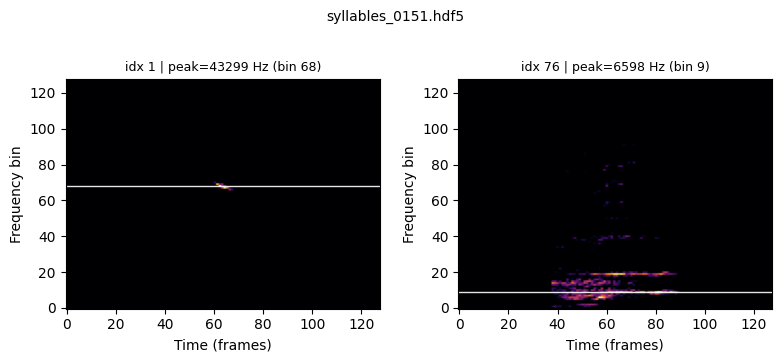

[153/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0152.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


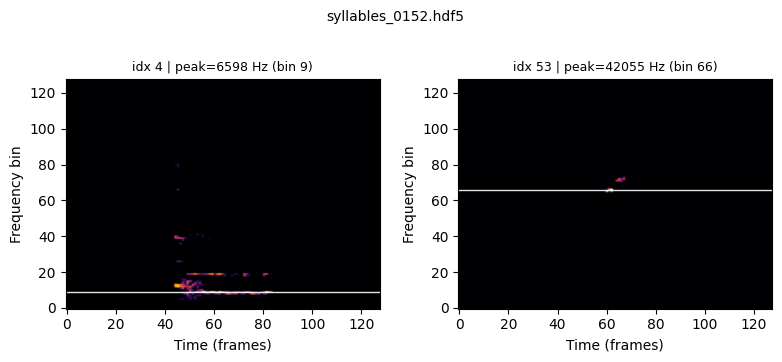

[154/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0153.hdf5
   wrote peak_freq_hz (min=4110.2, max=54496.1)


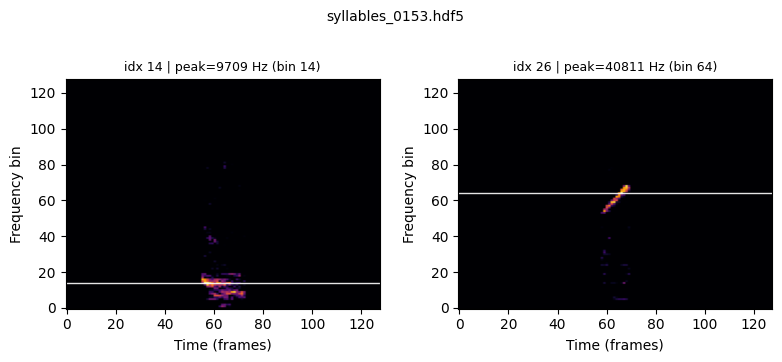

[155/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0154.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


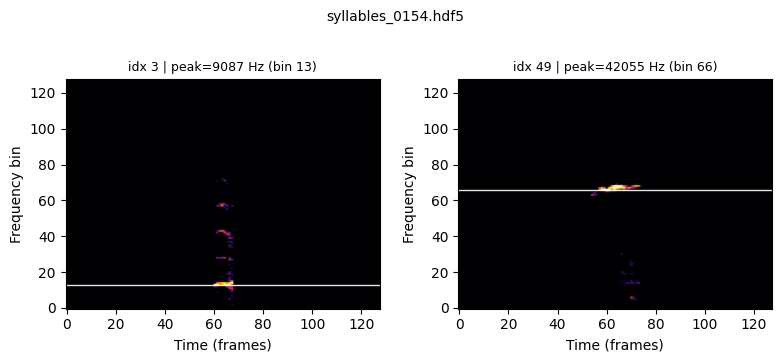

[156/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0155.hdf5
   wrote peak_freq_hz (min=2244.1, max=51385.8)


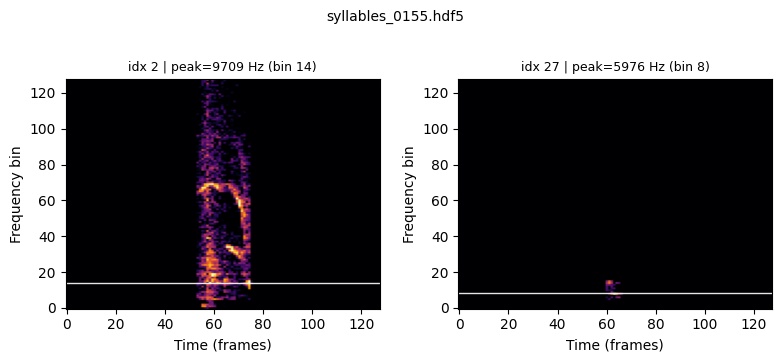

[157/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0156.hdf5
   wrote peak_freq_hz (min=1622.0, max=60716.5)


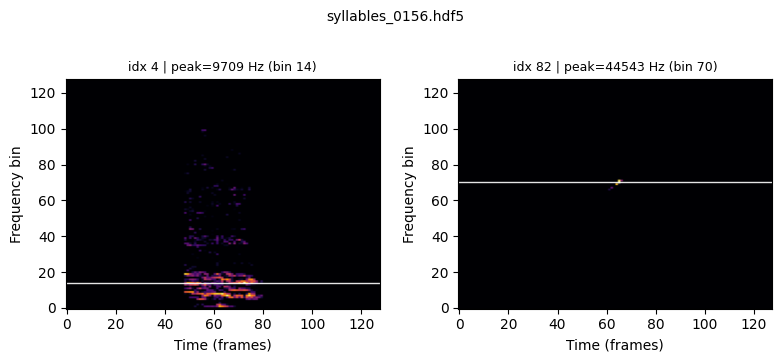

[158/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0157.hdf5
   wrote peak_freq_hz (min=1622.0, max=56362.2)


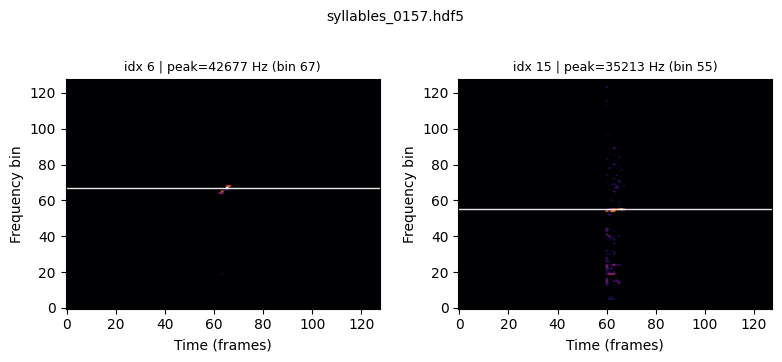

[159/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0158.hdf5
   wrote peak_freq_hz (min=1000.0, max=48275.6)


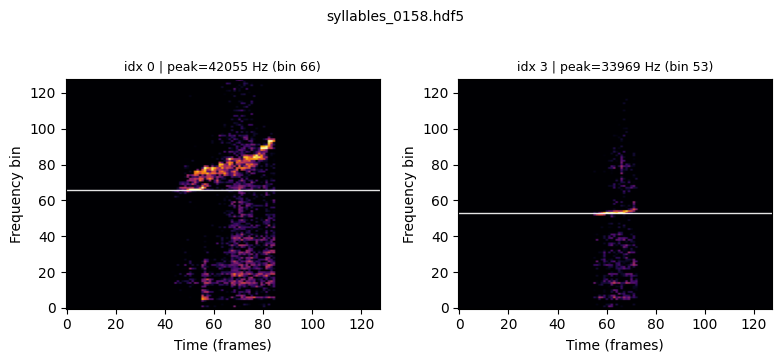

[160/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0159.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


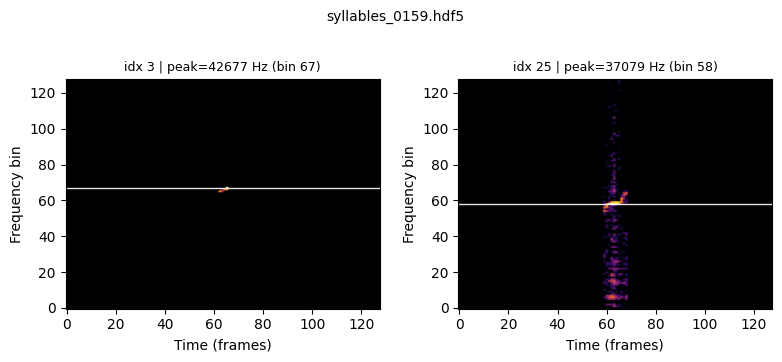

[161/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0160.hdf5
   wrote peak_freq_hz (min=1000.0, max=53252.0)


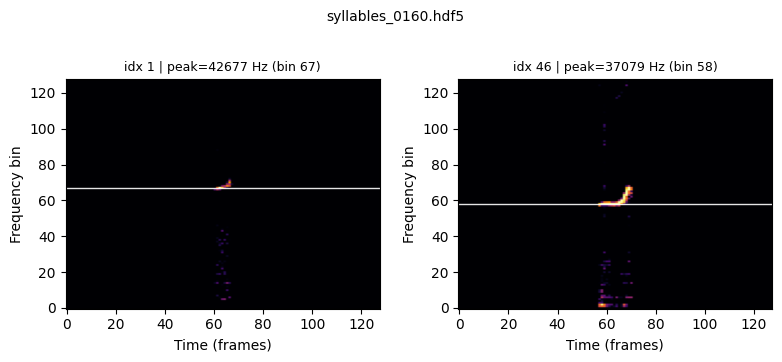

[162/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0161.hdf5
   wrote peak_freq_hz (min=1000.0, max=43921.3)


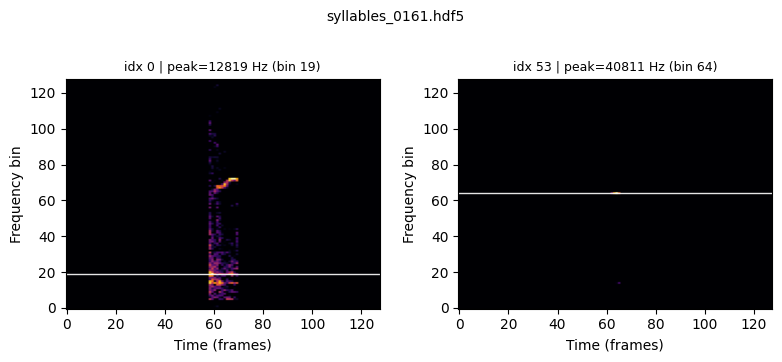

[163/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0162.hdf5
   wrote peak_freq_hz (min=1622.0, max=50141.7)


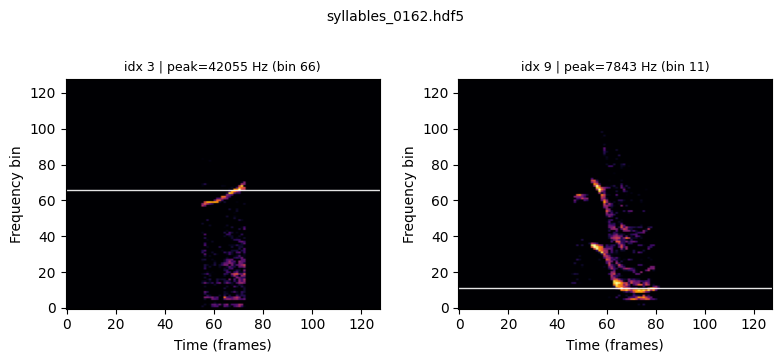

[164/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0163.hdf5
   wrote peak_freq_hz (min=1000.0, max=60716.5)


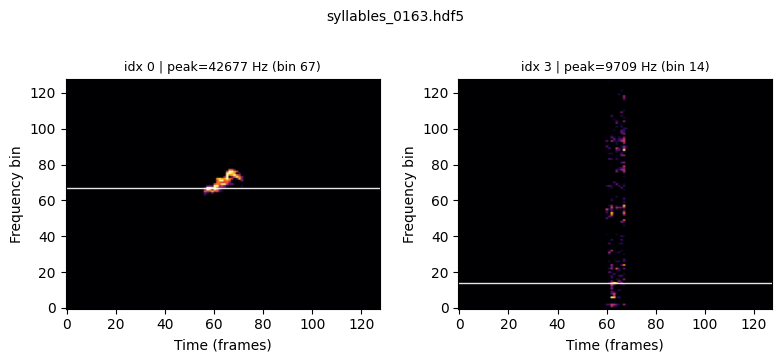

[165/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0164.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


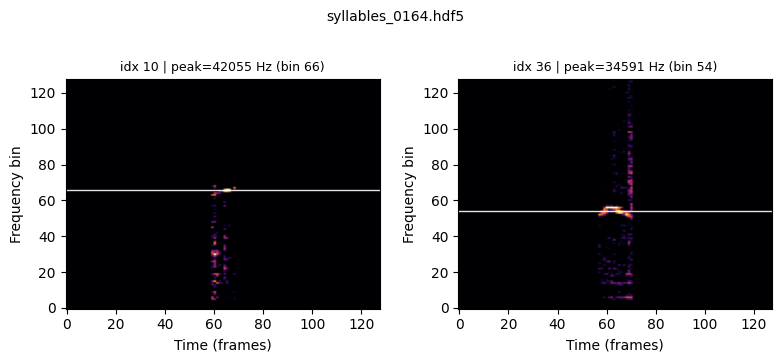

[166/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0165.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


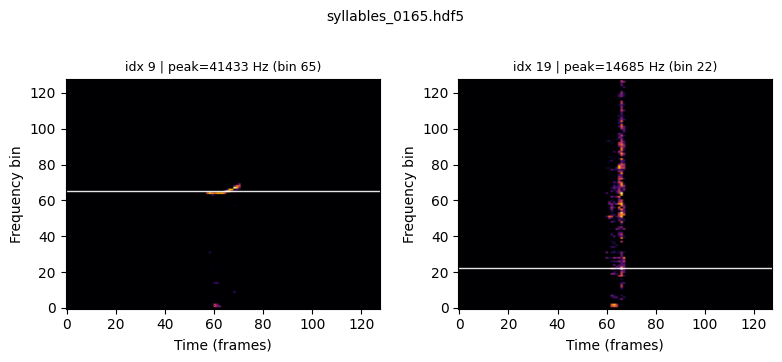

[167/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0166.hdf5
   wrote peak_freq_hz (min=1000.0, max=53874.0)


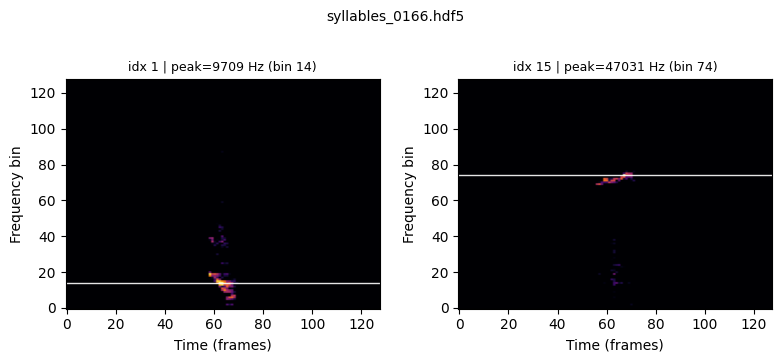

[168/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0167.hdf5
   wrote peak_freq_hz (min=1000.0, max=48275.6)


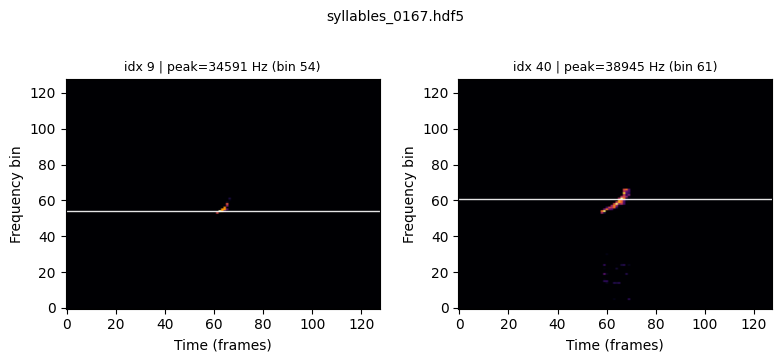

[169/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0168.hdf5
   wrote peak_freq_hz (min=1000.0, max=54496.1)


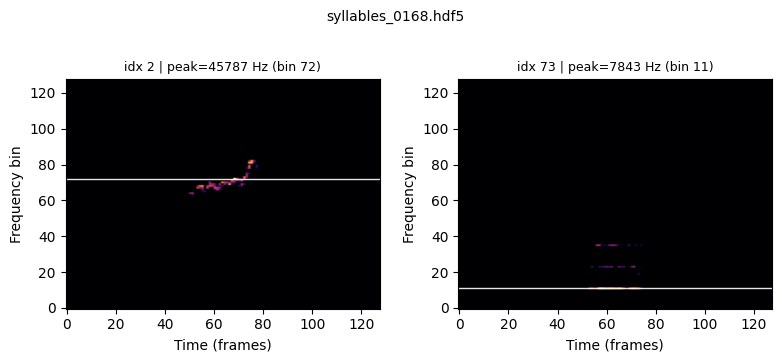

[170/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0169.hdf5
   wrote peak_freq_hz (min=1000.0, max=53874.0)


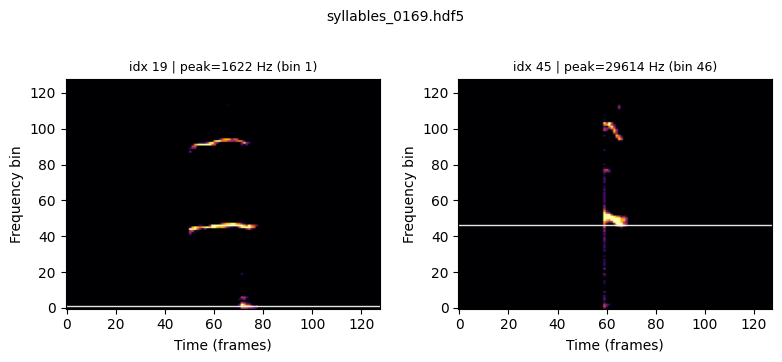

[171/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0170.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


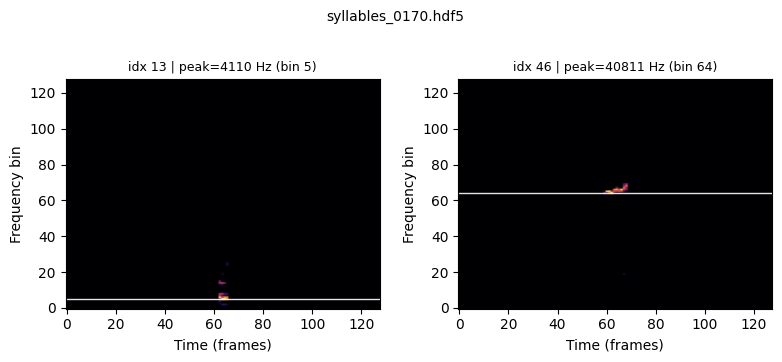

[172/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0171.hdf5
   wrote peak_freq_hz (min=1000.0, max=53252.0)


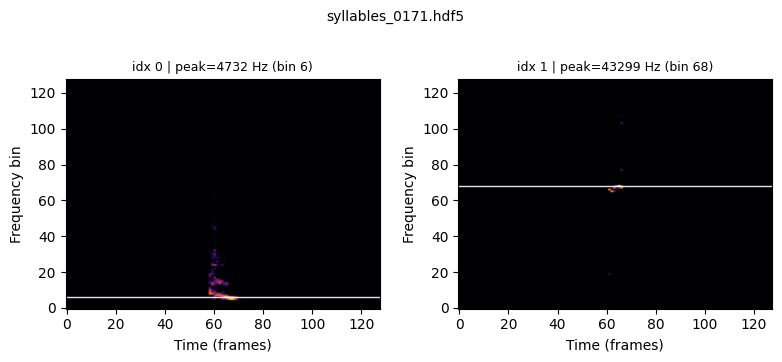

[173/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0172.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


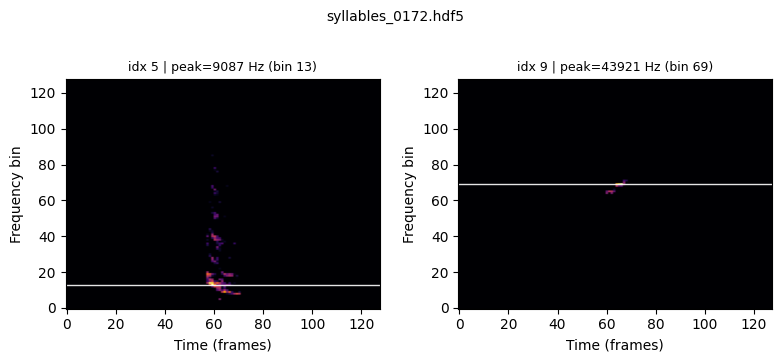

[174/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0173.hdf5
   wrote peak_freq_hz (min=1000.0, max=65070.9)


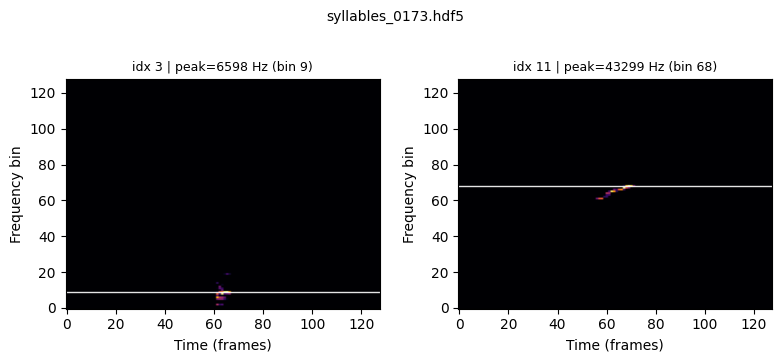

[175/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0174.hdf5
   wrote peak_freq_hz (min=1000.0, max=52007.9)


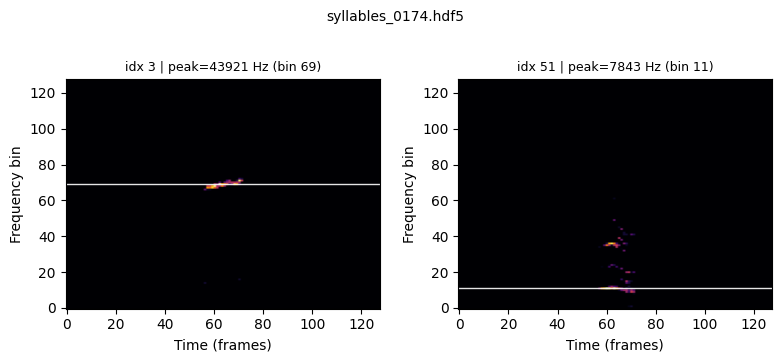

[176/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0175.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


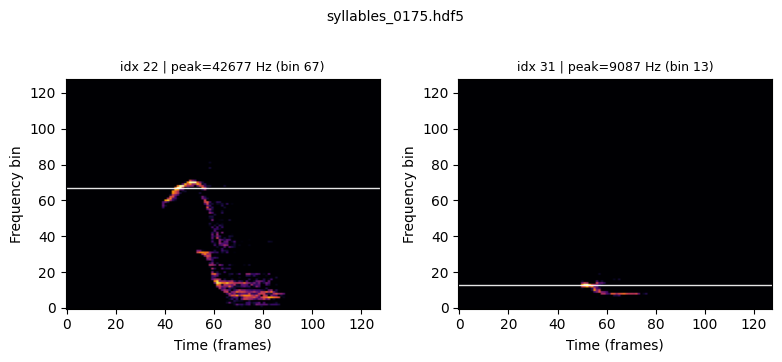

[177/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0176.hdf5
   wrote peak_freq_hz (min=1000.0, max=56984.3)


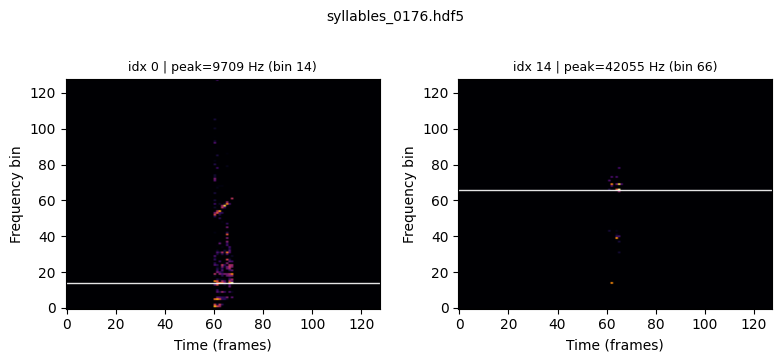

[178/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0177.hdf5
   wrote peak_freq_hz (min=1622.0, max=55740.2)


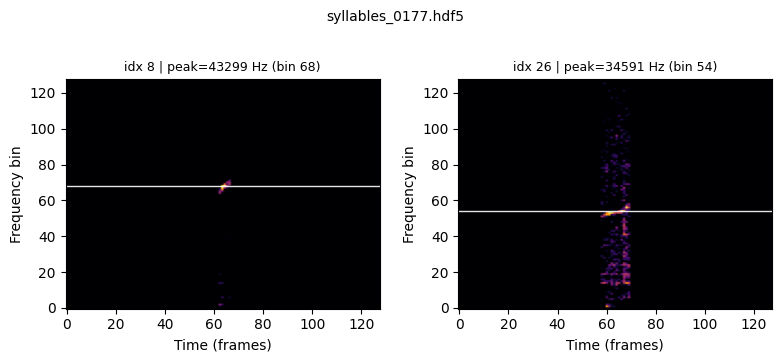

[179/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0178.hdf5
   wrote peak_freq_hz (min=1000.0, max=55740.2)


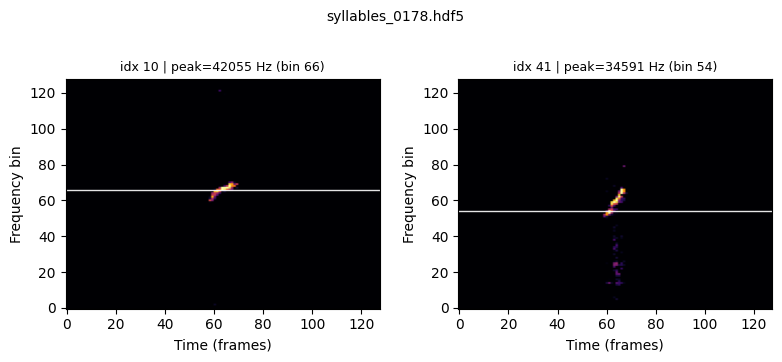

[180/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0179.hdf5
   wrote peak_freq_hz (min=1622.0, max=45787.4)


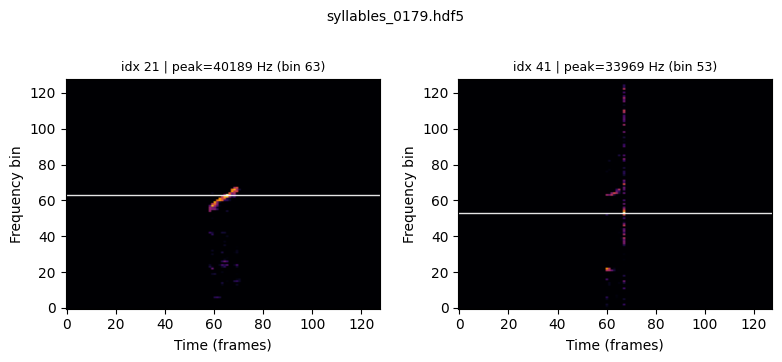

[181/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0180.hdf5
   wrote peak_freq_hz (min=1622.0, max=52007.9)


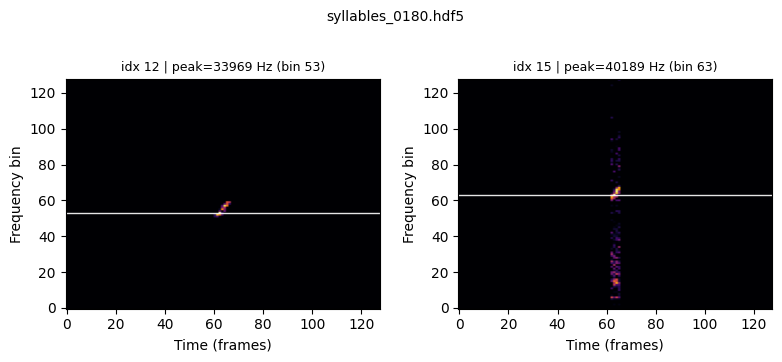

[182/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0181.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


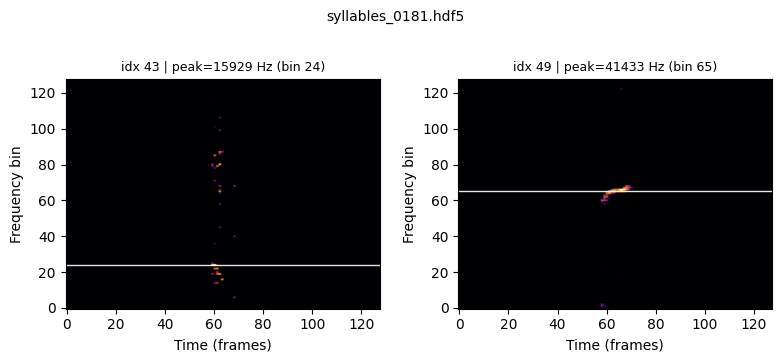

[183/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0182.hdf5
   wrote peak_freq_hz (min=1000.0, max=59472.4)


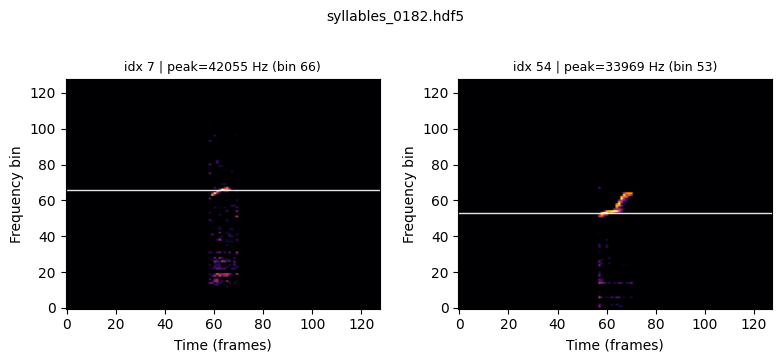

[184/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0183.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


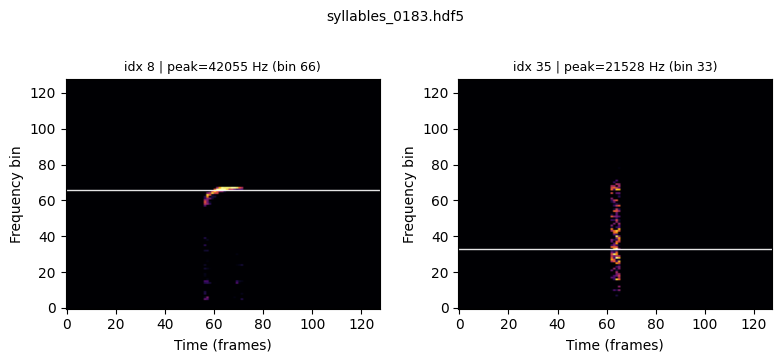

[185/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0184.hdf5
   wrote peak_freq_hz (min=1000.0, max=46409.4)


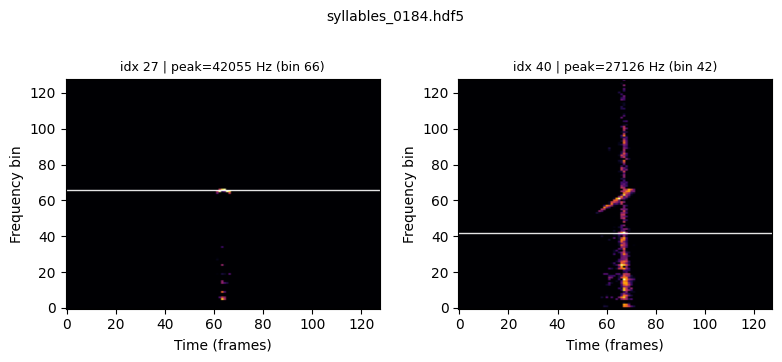

[186/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0185.hdf5
   wrote peak_freq_hz (min=4110.2, max=52629.9)


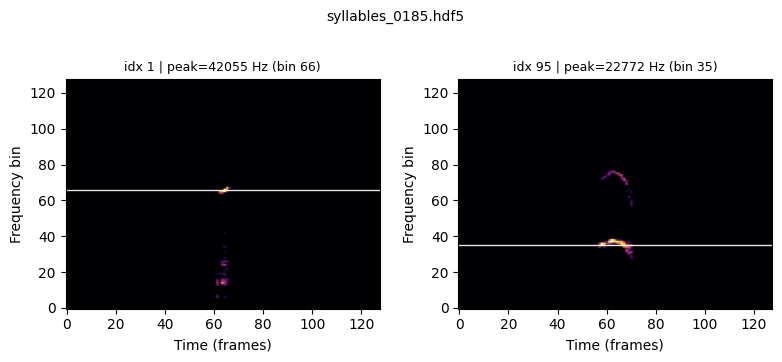

[187/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0186.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


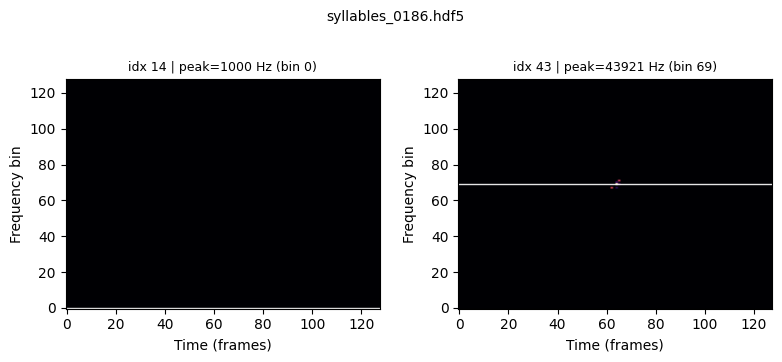

[188/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0187.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


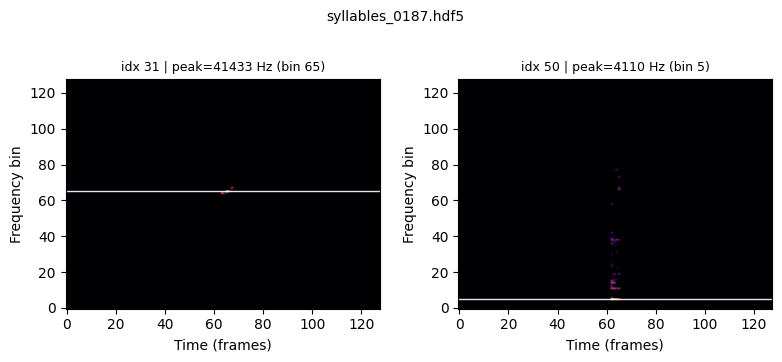

[189/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0188.hdf5
   wrote peak_freq_hz (min=1000.0, max=66315.0)


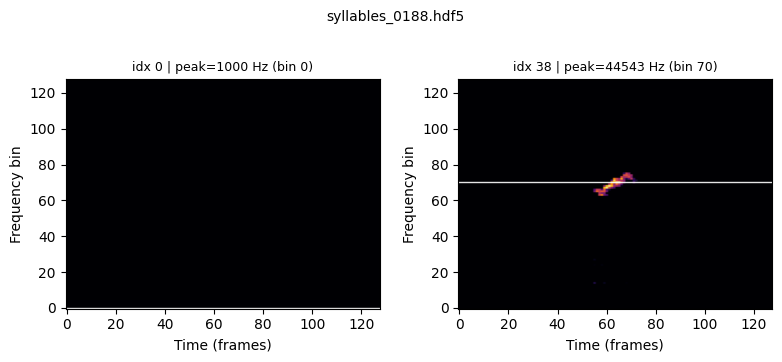

[190/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0189.hdf5
   wrote peak_freq_hz (min=1000.0, max=57606.3)


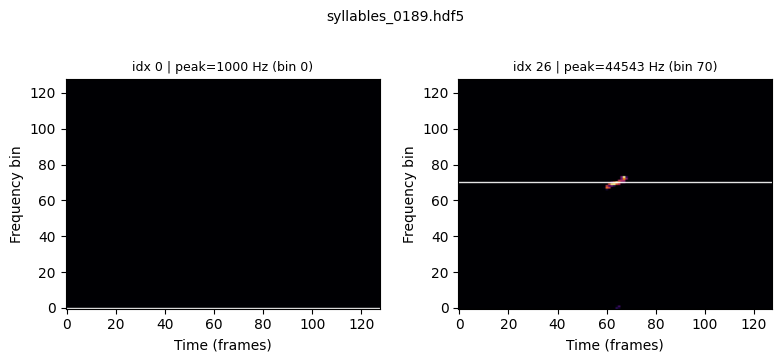

[191/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0190.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


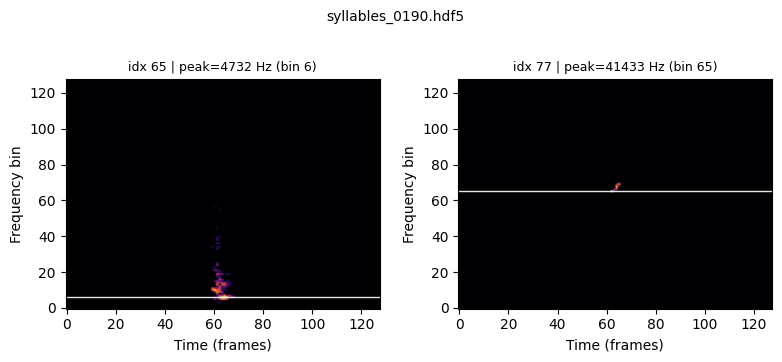

[192/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0191.hdf5
   wrote peak_freq_hz (min=1000.0, max=51385.8)


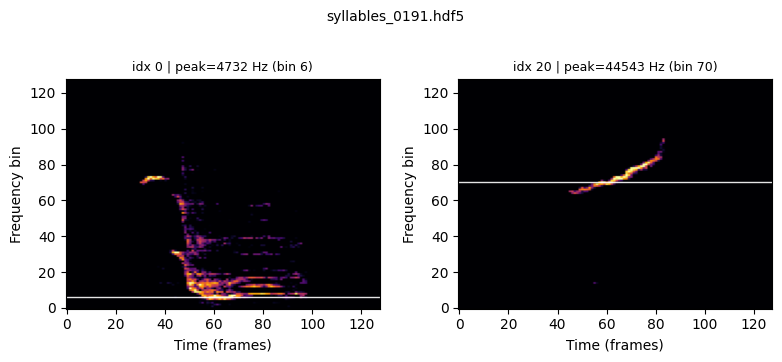

[193/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0192.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


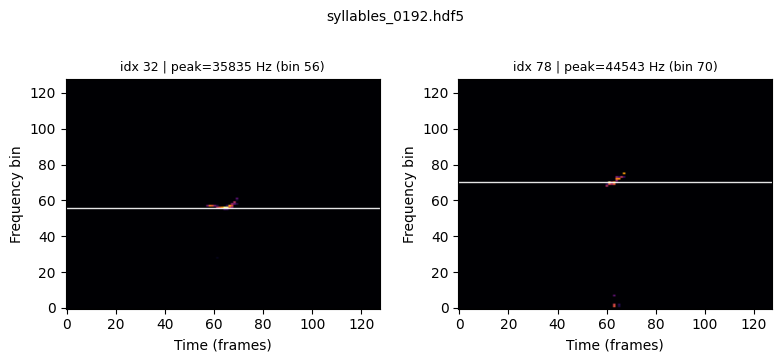

[194/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0193.hdf5
   wrote peak_freq_hz (min=1000.0, max=53252.0)


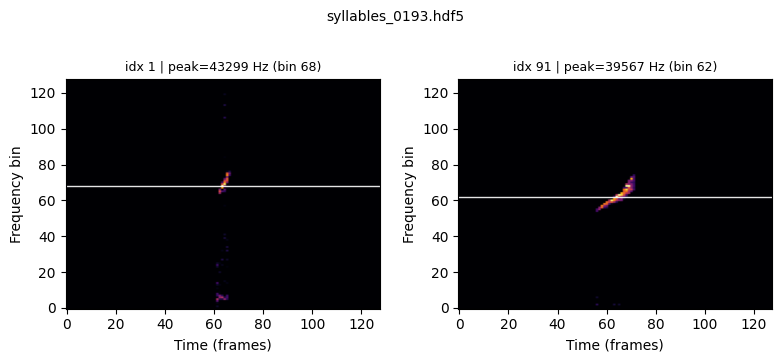

[195/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0194.hdf5
   wrote peak_freq_hz (min=1622.0, max=56362.2)


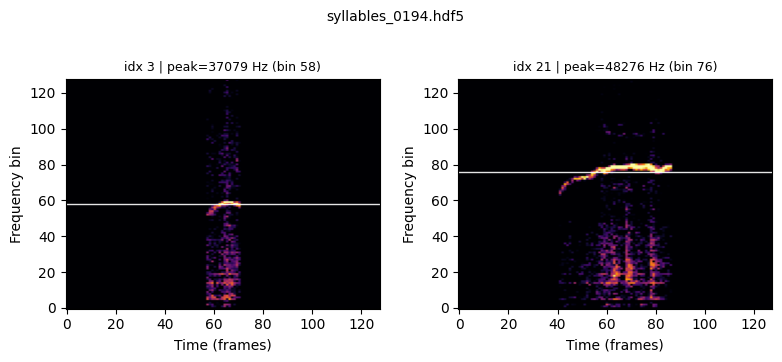

[196/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0195.hdf5
   wrote peak_freq_hz (min=1622.0, max=52007.9)


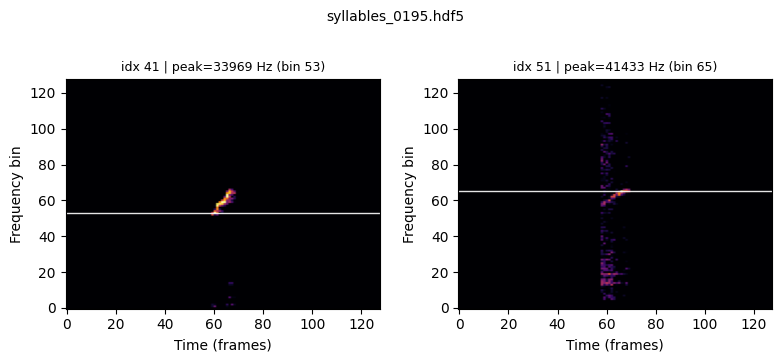

[197/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0196.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


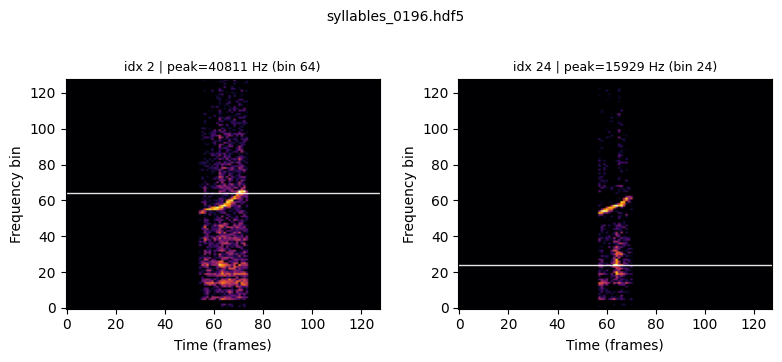

[198/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0197.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


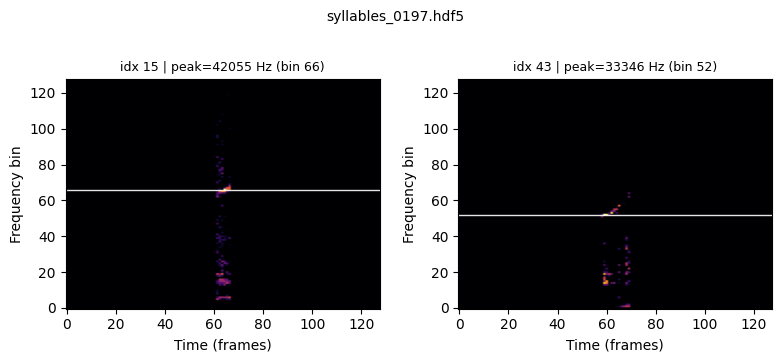

[199/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0198.hdf5
   wrote peak_freq_hz (min=1000.0, max=59472.4)


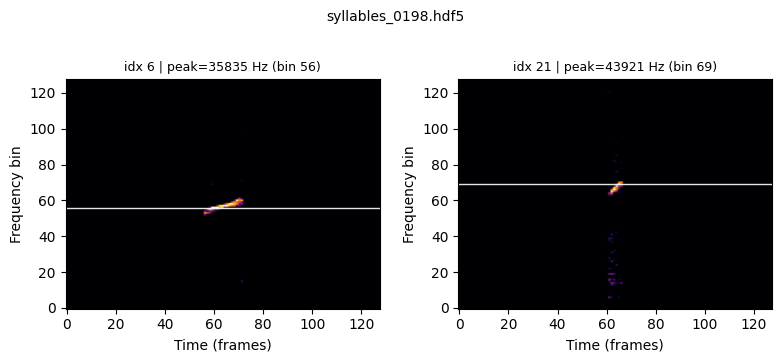

[200/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0199.hdf5
   wrote peak_freq_hz (min=1000.0, max=44543.3)


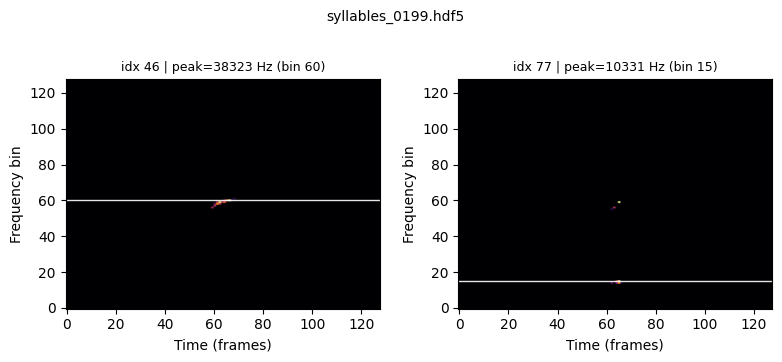

[201/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0200.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


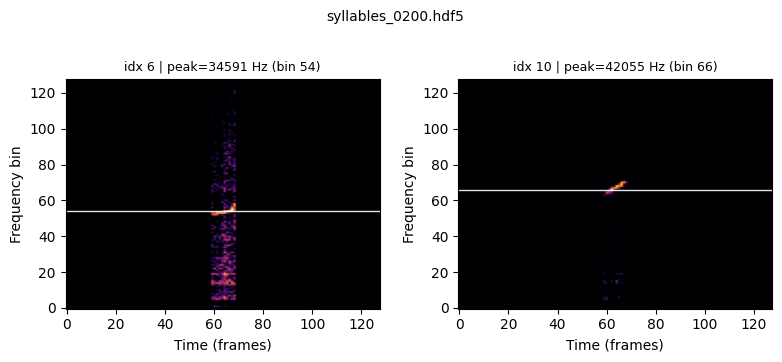

[202/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0201.hdf5
   wrote peak_freq_hz (min=1000.0, max=48897.6)


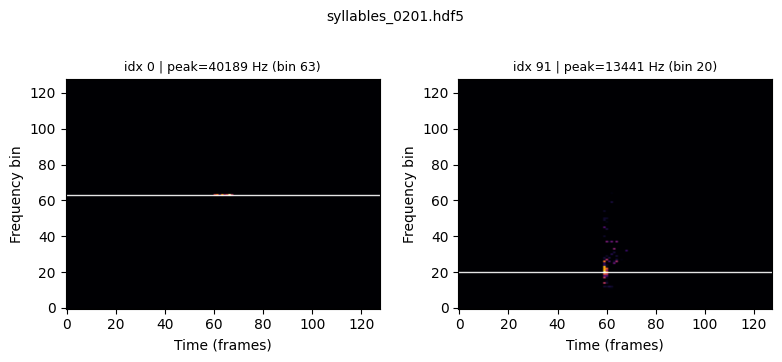

[203/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0202.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


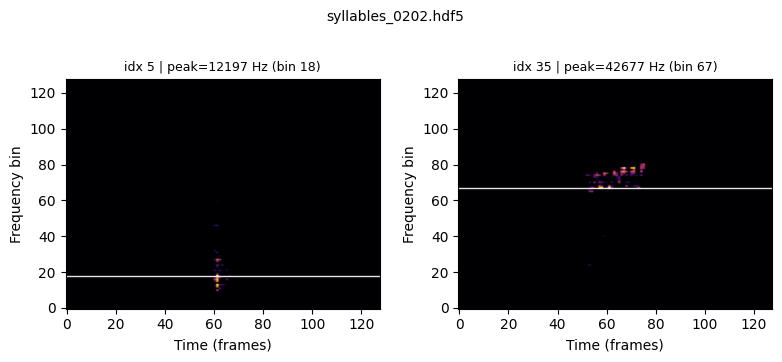

[204/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0203.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


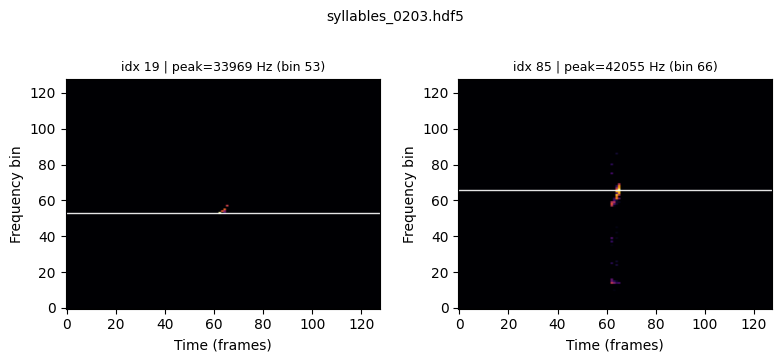

[205/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0204.hdf5
   wrote peak_freq_hz (min=1000.0, max=48275.6)


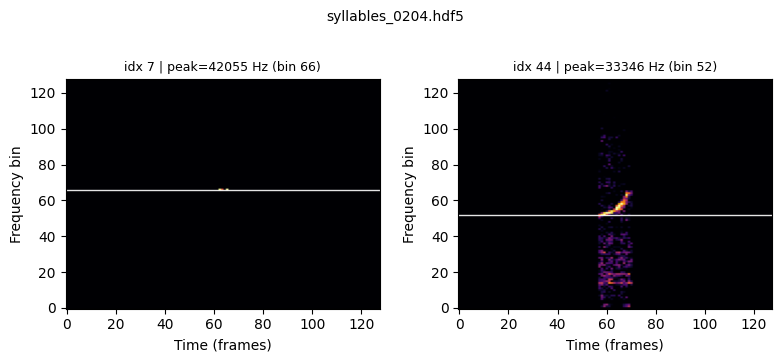

[206/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0205.hdf5
   wrote peak_freq_hz (min=1000.0, max=51385.8)


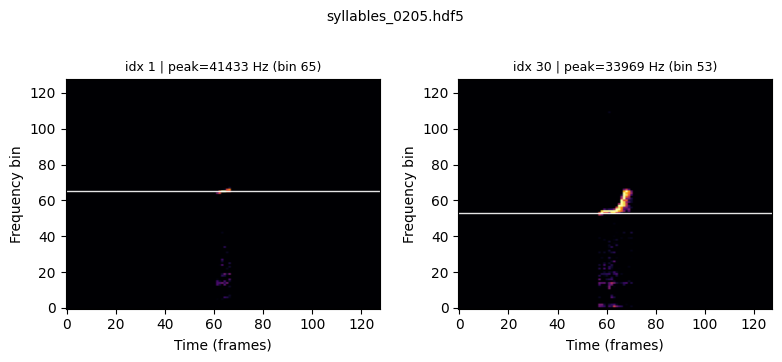

[207/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0206.hdf5
   wrote peak_freq_hz (min=1622.0, max=54496.1)


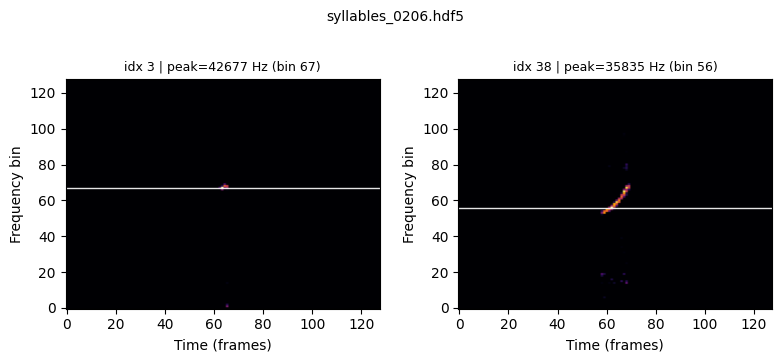

[208/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0207.hdf5
   wrote peak_freq_hz (min=1000.0, max=71913.4)


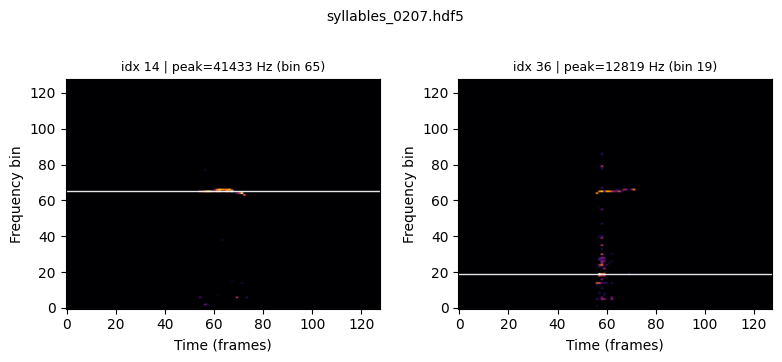

[209/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0208.hdf5
   wrote peak_freq_hz (min=1000.0, max=61960.6)


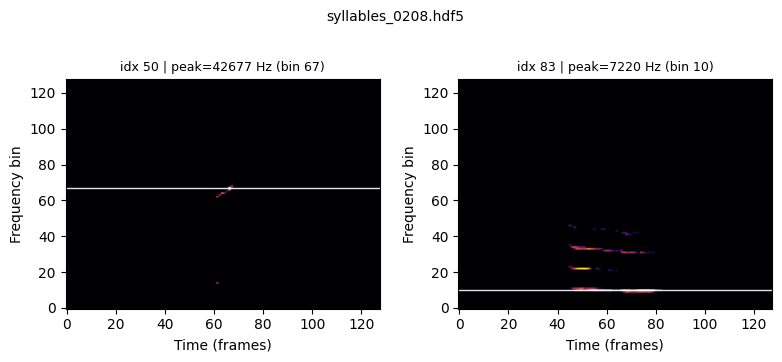

[210/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0209.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


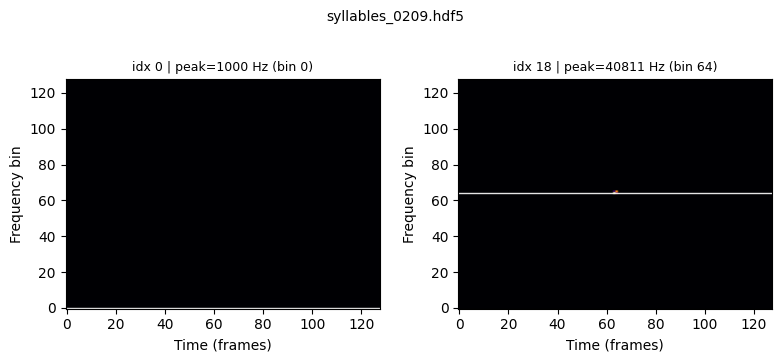

[211/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0210.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


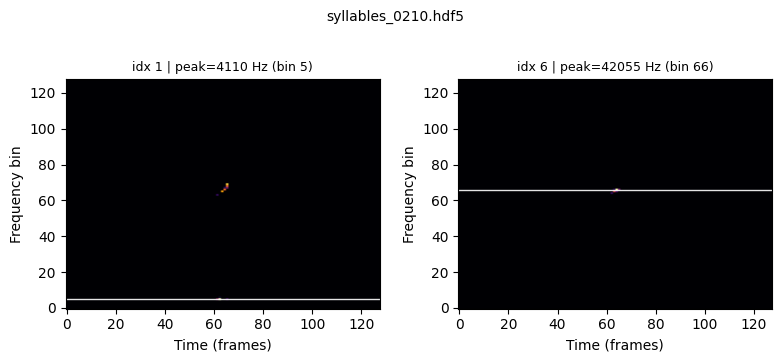

[212/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0211.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


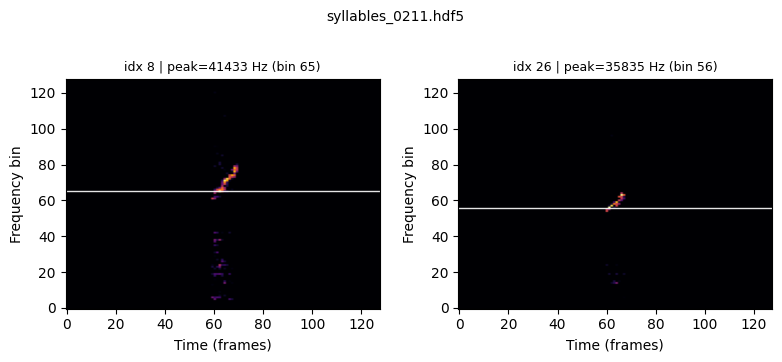

[213/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0212.hdf5
   wrote peak_freq_hz (min=1000.0, max=57606.3)


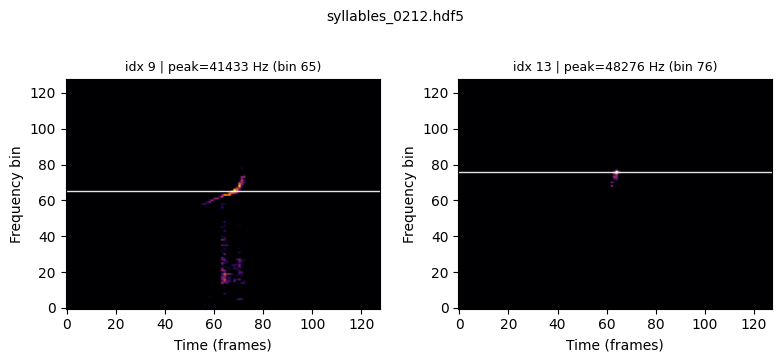

[214/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0213.hdf5
   wrote peak_freq_hz (min=1000.0, max=48897.6)


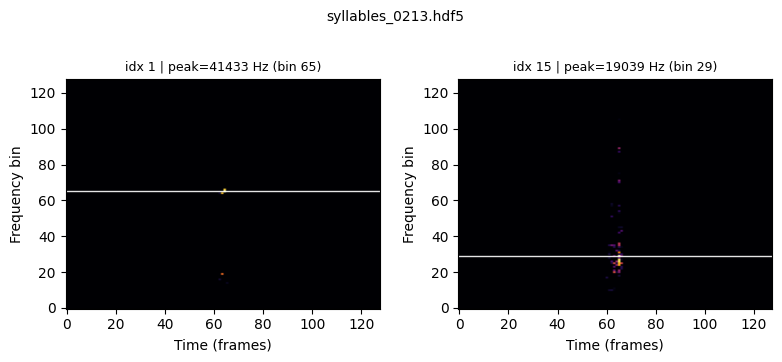

[215/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0214.hdf5
   wrote peak_freq_hz (min=1000.0, max=43921.3)


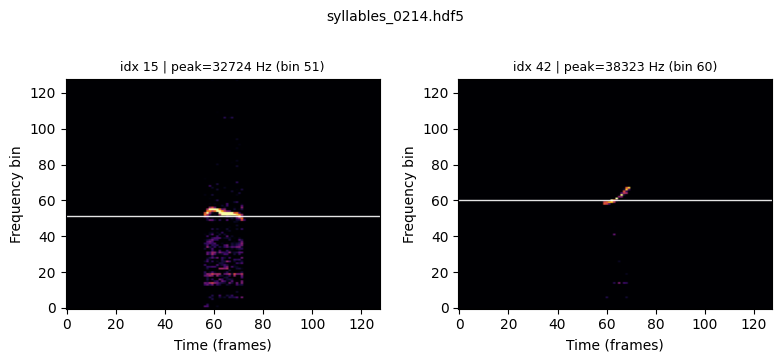

[216/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0215.hdf5
   wrote peak_freq_hz (min=1000.0, max=61960.6)


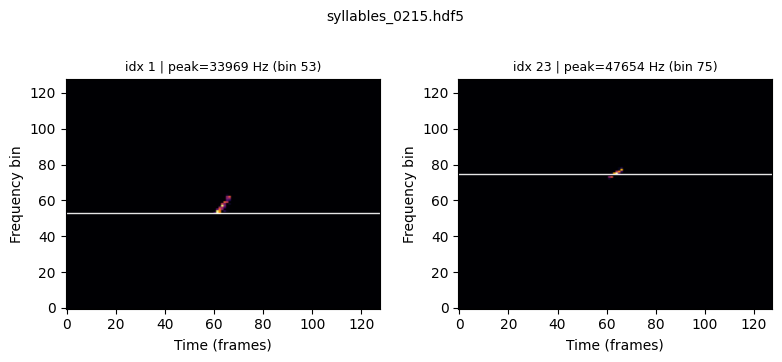

[217/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0216.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


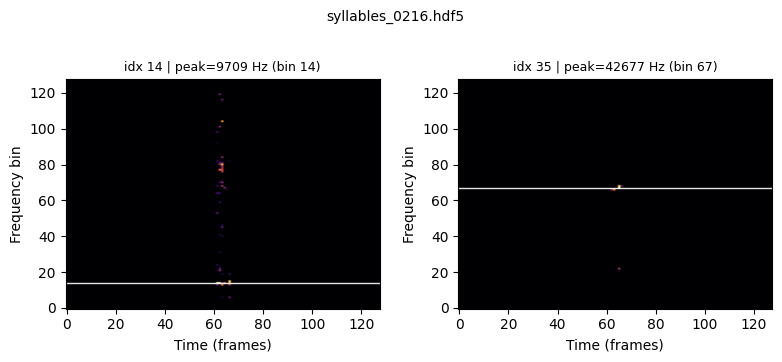

[218/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0217.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


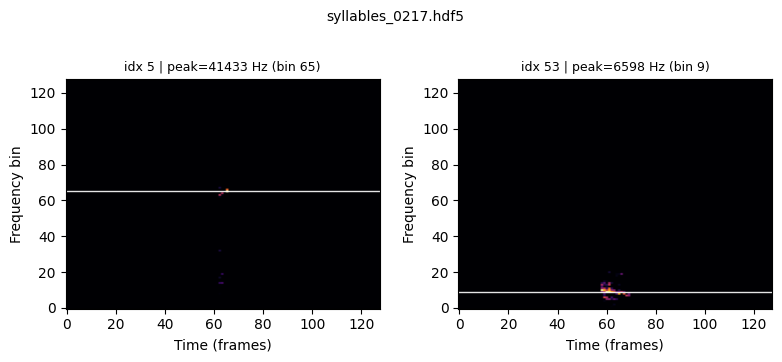

[219/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0218.hdf5
   wrote peak_freq_hz (min=1000.0, max=48897.6)


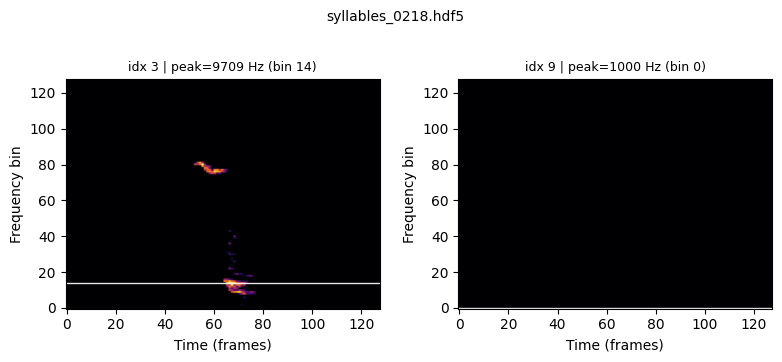

[220/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0219.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


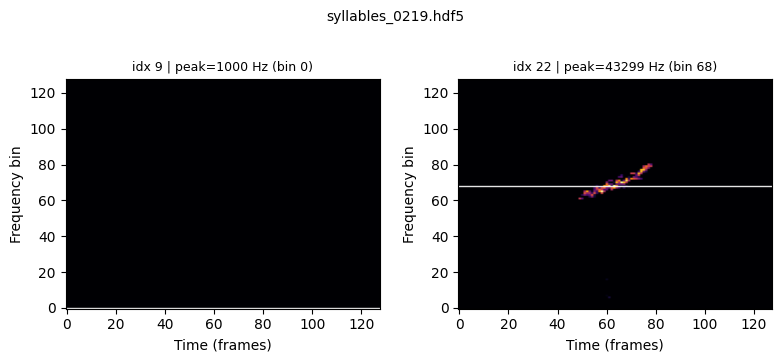

[221/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0220.hdf5
   wrote peak_freq_hz (min=1000.0, max=52007.9)


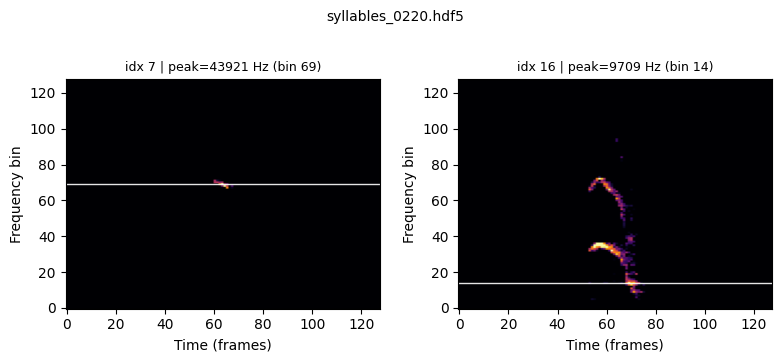

[222/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0221.hdf5
   wrote peak_freq_hz (min=1000.0, max=71913.4)


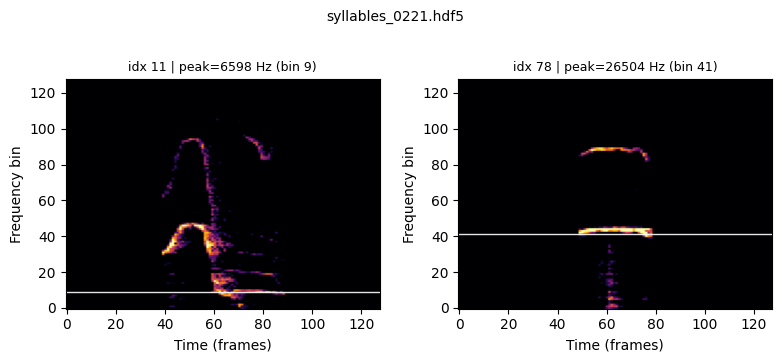

[223/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0222.hdf5
   wrote peak_freq_hz (min=1000.0, max=46409.4)


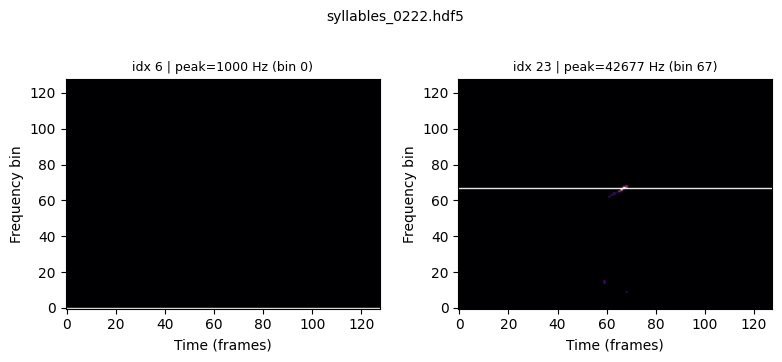

[224/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0223.hdf5
   wrote peak_freq_hz (min=1000.0, max=47653.5)


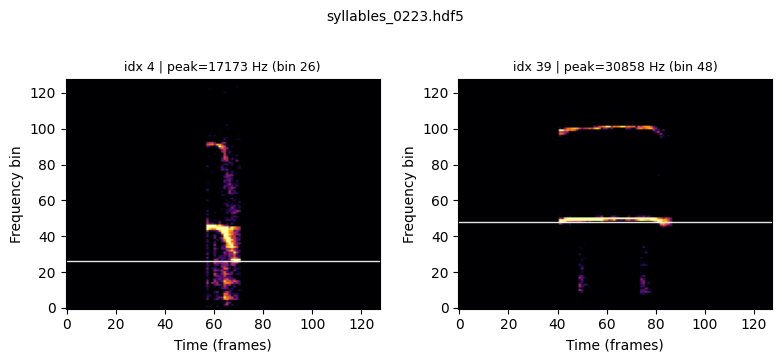

[225/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0224.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


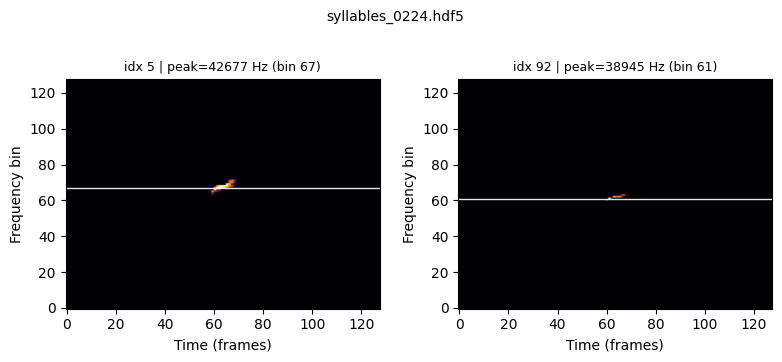

[226/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0225.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


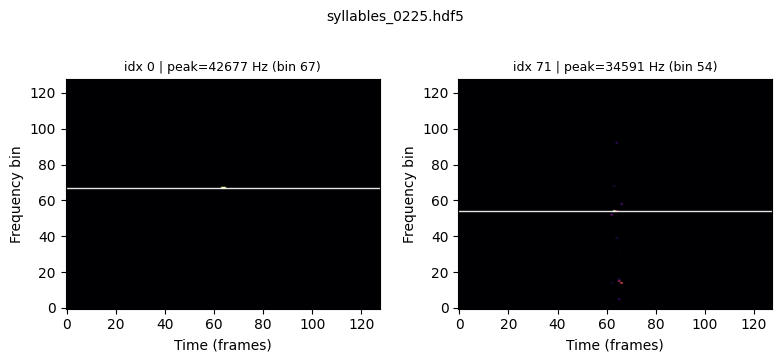

[227/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0226.hdf5
   wrote peak_freq_hz (min=1000.0, max=51385.8)


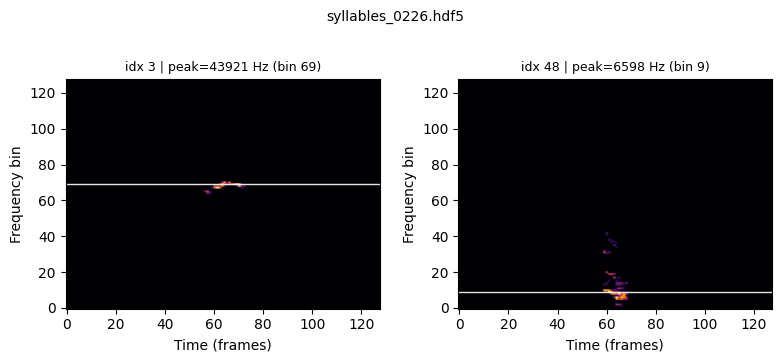

[228/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0227.hdf5
   wrote peak_freq_hz (min=1000.0, max=57606.3)


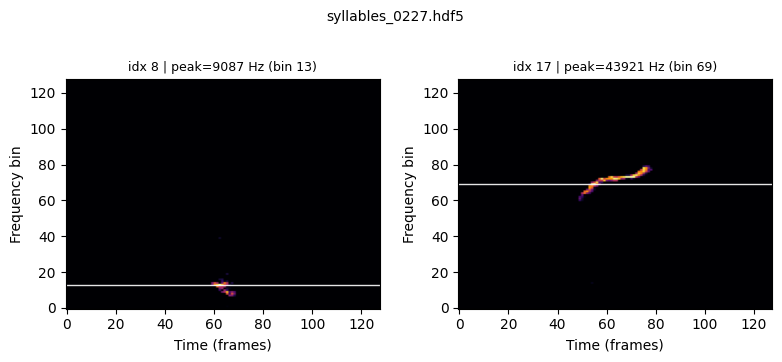

[229/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0228.hdf5
   wrote peak_freq_hz (min=1000.0, max=52007.9)


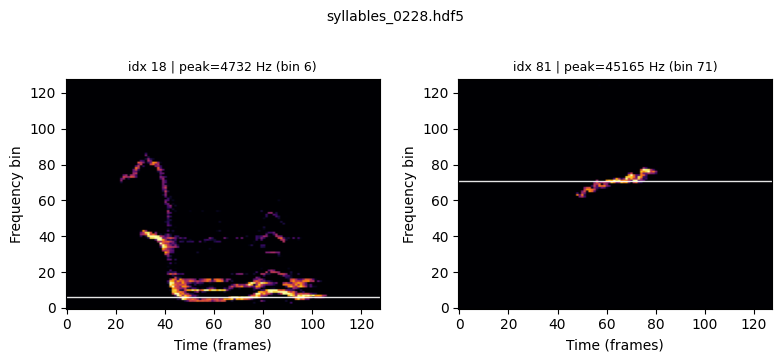

[230/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0229.hdf5
   wrote peak_freq_hz (min=1000.0, max=52007.9)


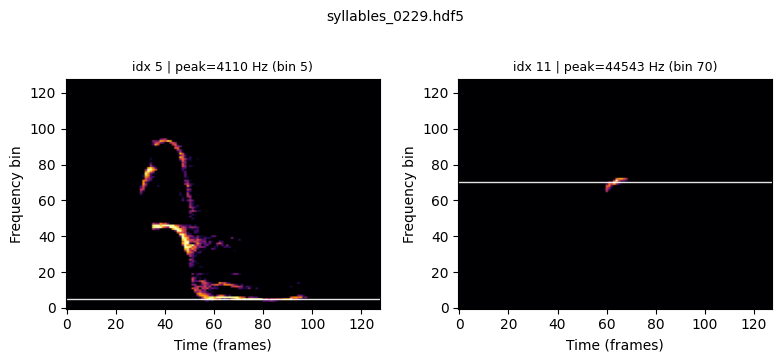

[231/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0230.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


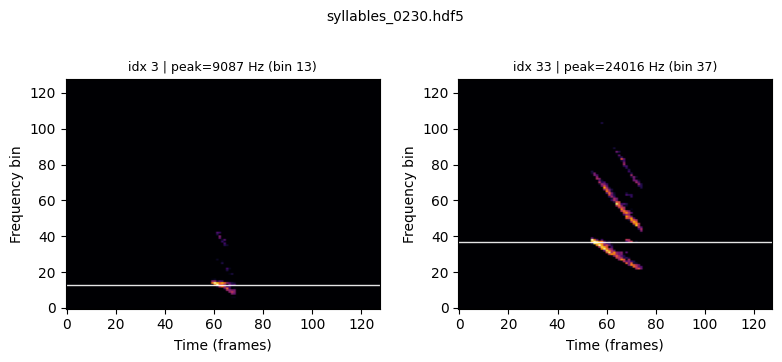

[232/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0231.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


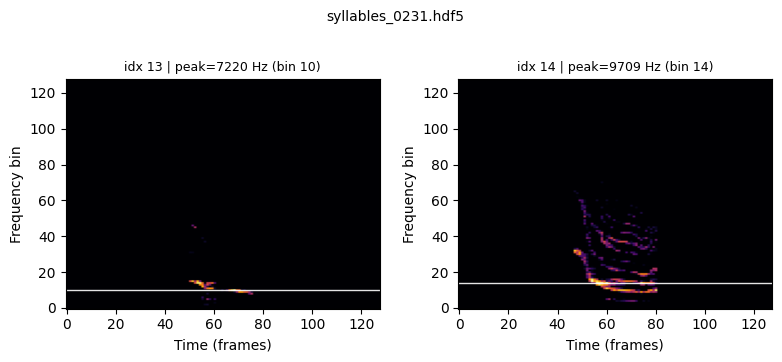

[233/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0232.hdf5
   wrote peak_freq_hz (min=4110.2, max=53252.0)


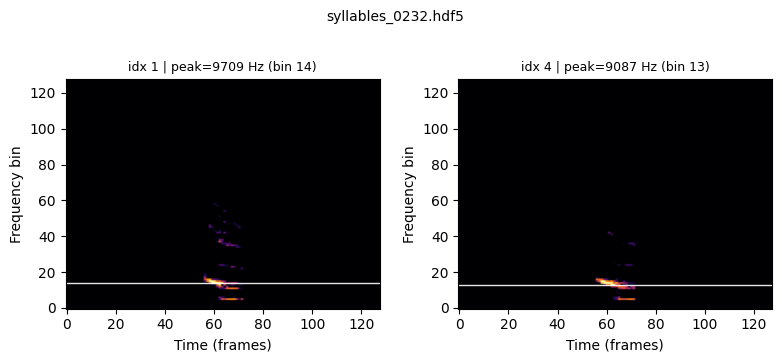

[234/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0233.hdf5
   wrote peak_freq_hz (min=1000.0, max=48897.6)


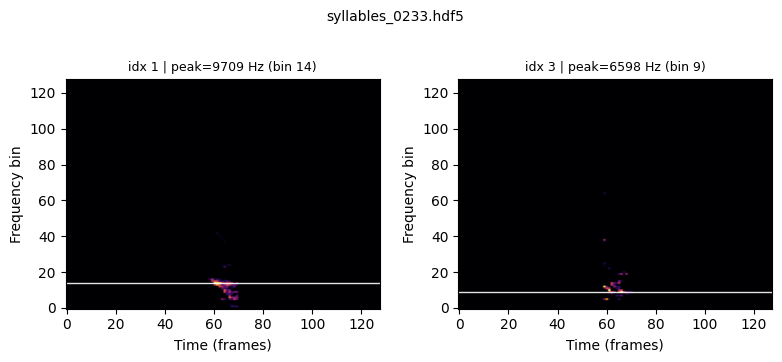

[235/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0234.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


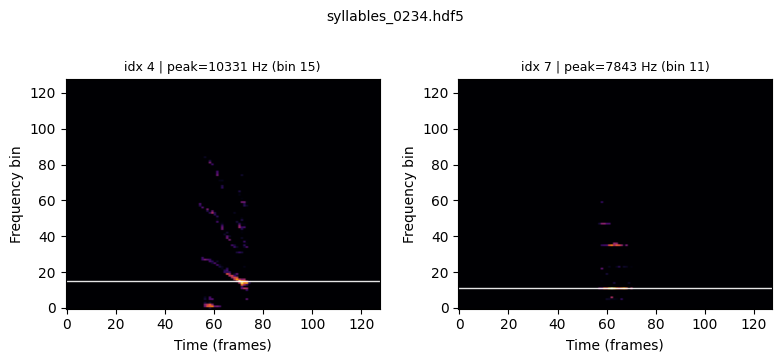

[236/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0235.hdf5
   wrote peak_freq_hz (min=1000.0, max=48275.6)


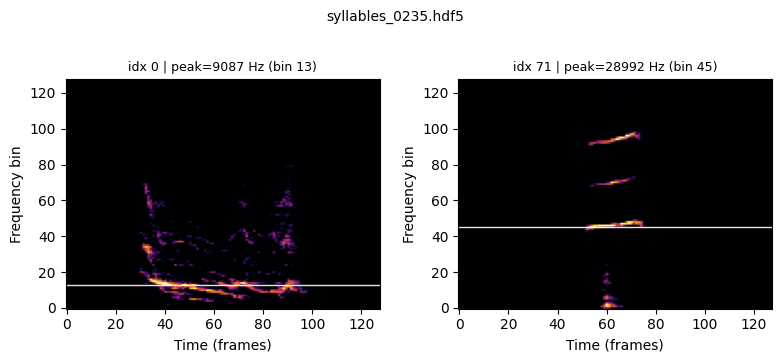

[237/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0236.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


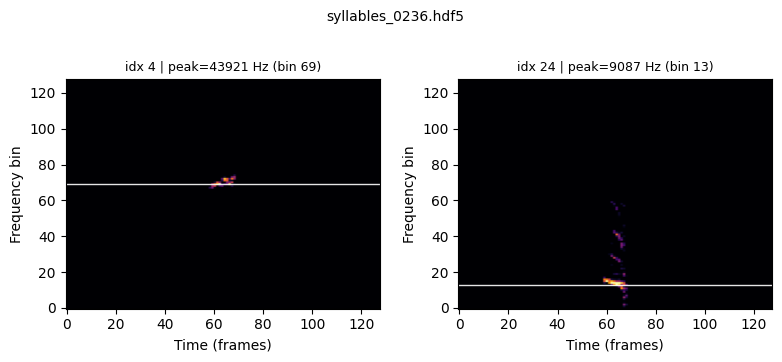

[238/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0237.hdf5
   wrote peak_freq_hz (min=1000.0, max=46409.4)


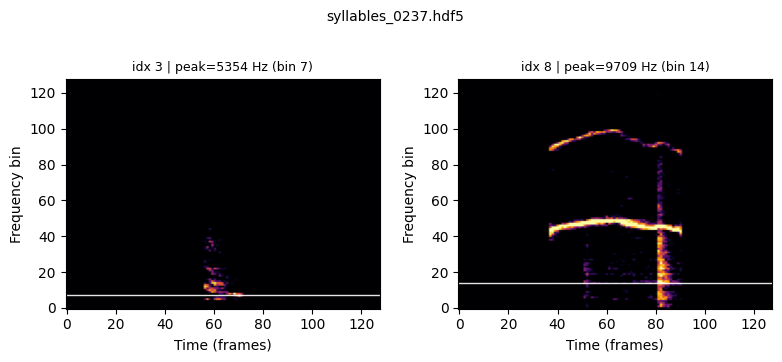

[239/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0238.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


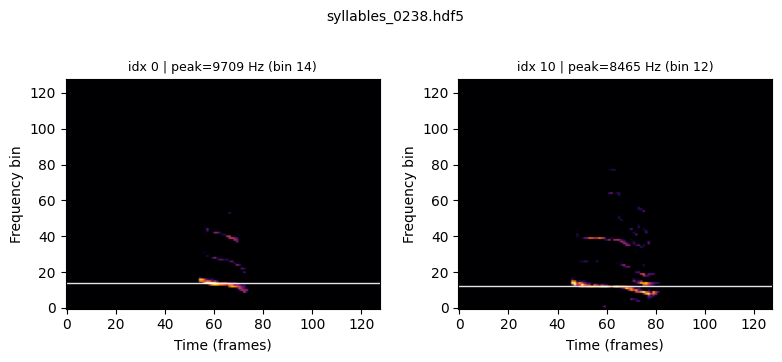

[240/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0239.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


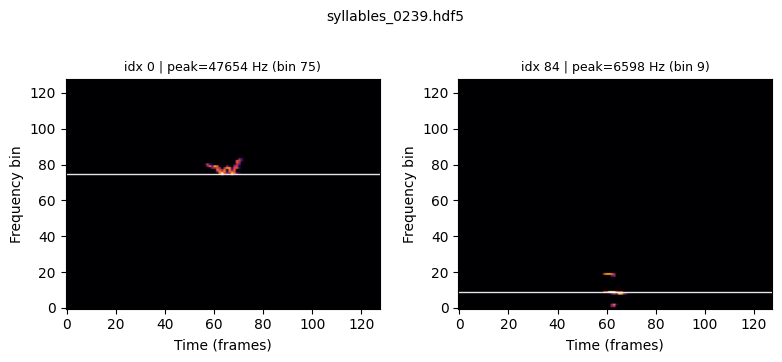

[241/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0240.hdf5
   wrote peak_freq_hz (min=1000.0, max=51385.8)


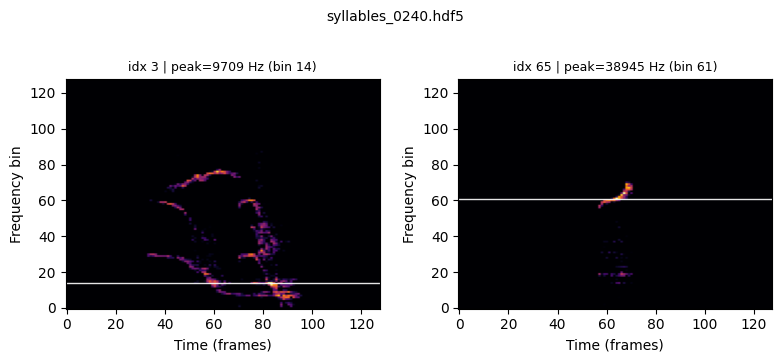

[242/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0241.hdf5
   wrote peak_freq_hz (min=1000.0, max=47031.5)


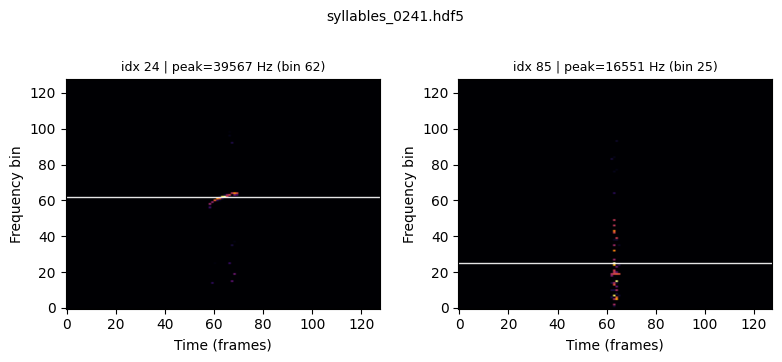

[243/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0242.hdf5
   wrote peak_freq_hz (min=1000.0, max=46409.4)


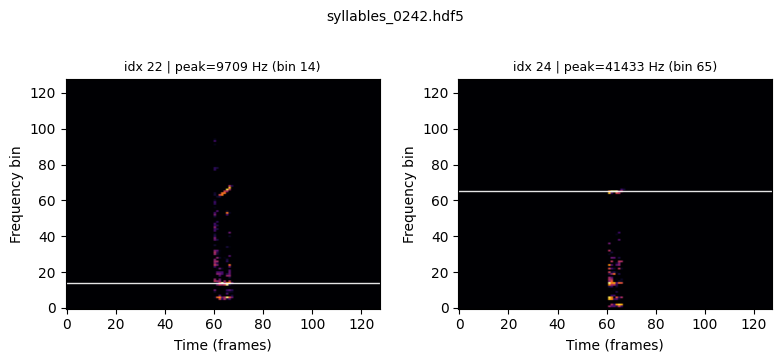

[244/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0243.hdf5
   wrote peak_freq_hz (min=1000.0, max=46409.4)


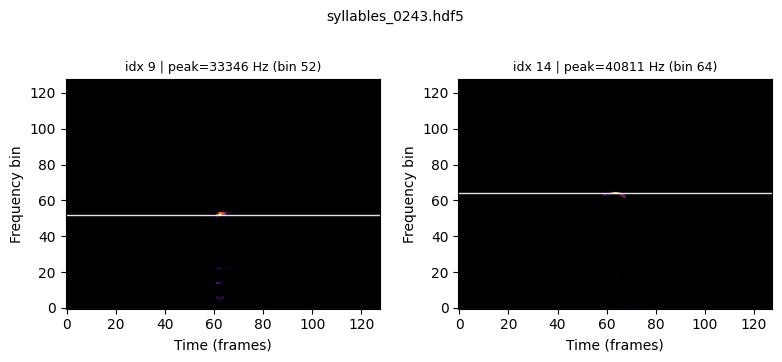

[245/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0244.hdf5
   wrote peak_freq_hz (min=1622.0, max=52629.9)


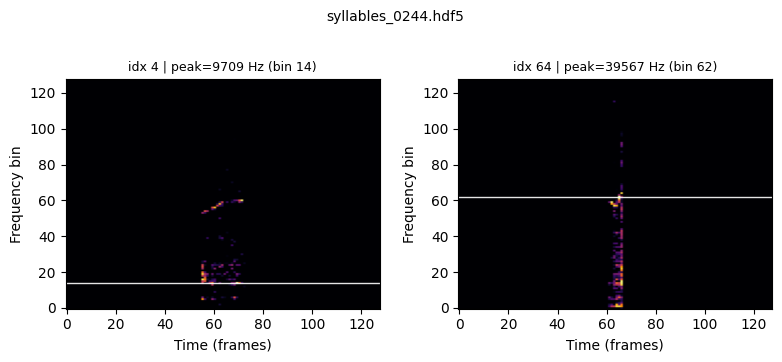

[246/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0245.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


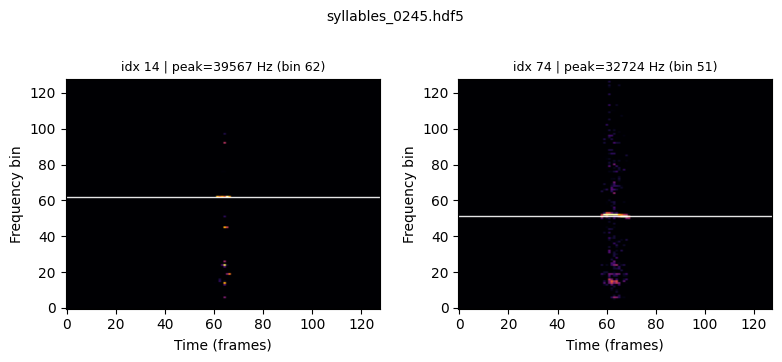

[247/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0246.hdf5
   wrote peak_freq_hz (min=1000.0, max=43299.2)


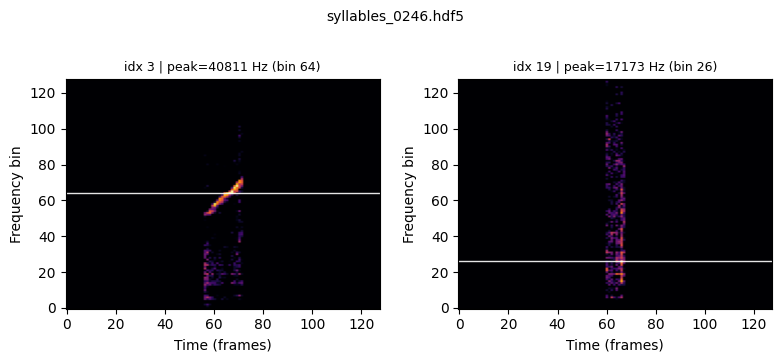

[248/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0247.hdf5
   wrote peak_freq_hz (min=1622.0, max=44543.3)


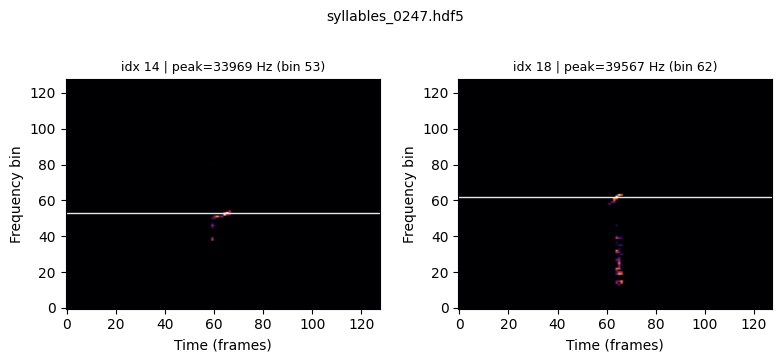

[249/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0248.hdf5
   wrote peak_freq_hz (min=1000.0, max=53874.0)


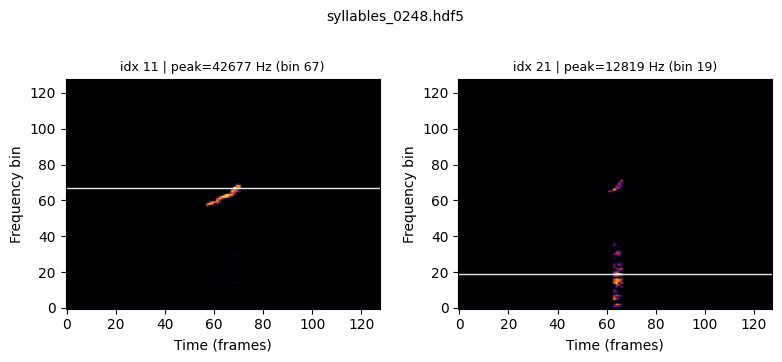

[250/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0249.hdf5
   wrote peak_freq_hz (min=1622.0, max=43921.3)


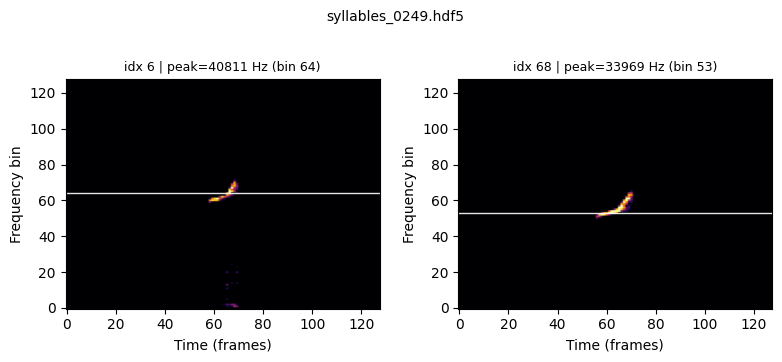

[251/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0250.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


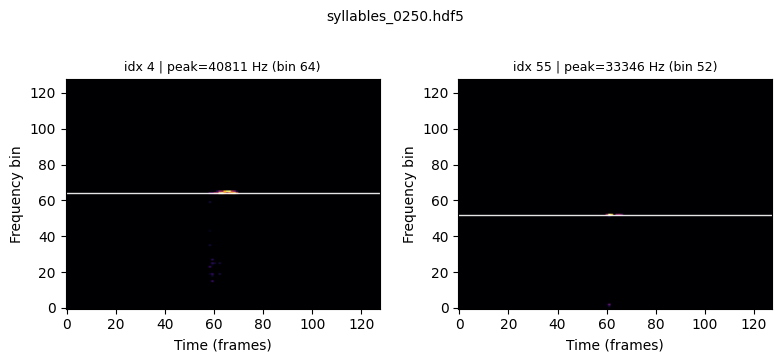

[252/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0251.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


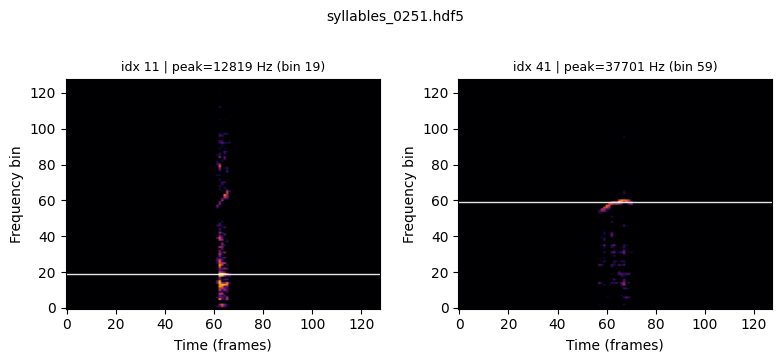

[253/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0252.hdf5
   wrote peak_freq_hz (min=1000.0, max=54496.1)


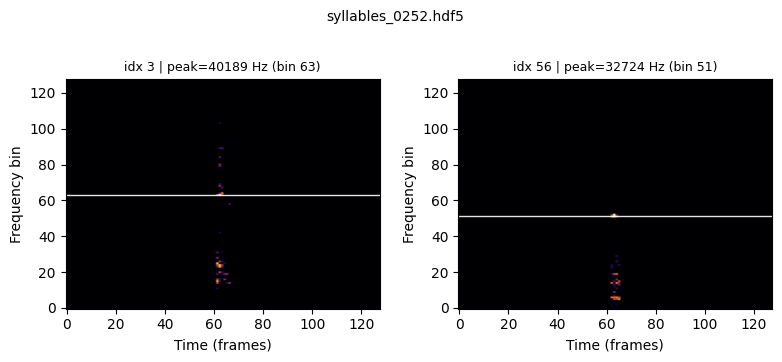

[254/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0253.hdf5
   wrote peak_freq_hz (min=1622.0, max=43921.3)


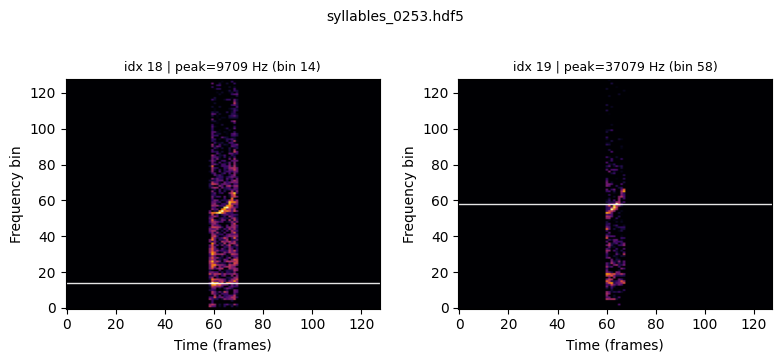

[255/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0254.hdf5
   wrote peak_freq_hz (min=1622.0, max=51385.8)


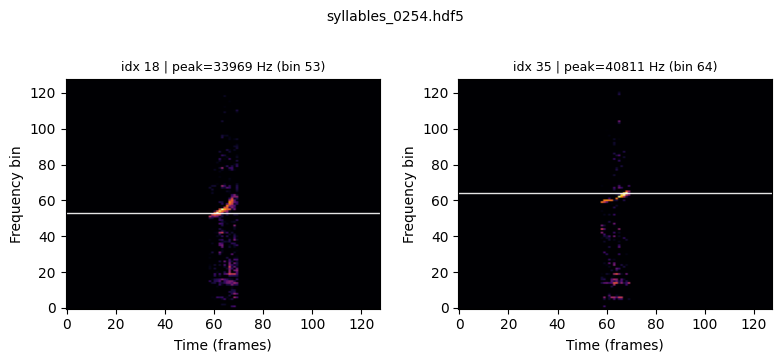

[256/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0255.hdf5
   wrote peak_freq_hz (min=1000.0, max=59472.4)


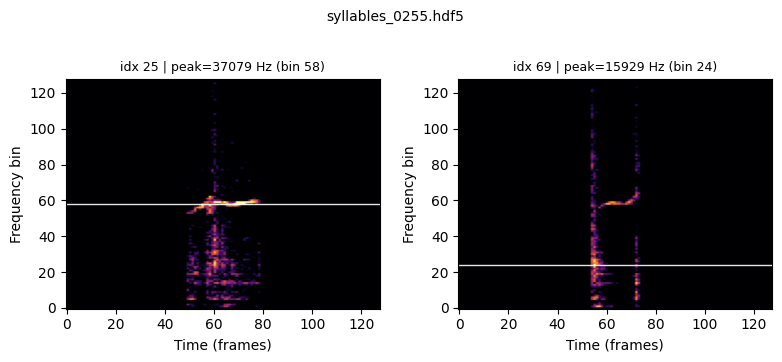

[257/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0256.hdf5
   wrote peak_freq_hz (min=1622.0, max=43921.3)


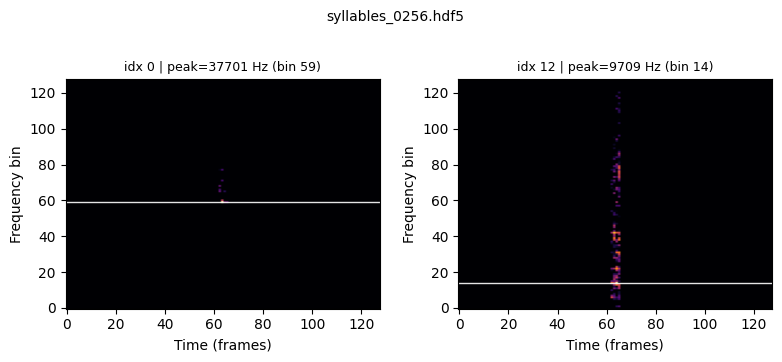

[258/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0257.hdf5
   wrote peak_freq_hz (min=2244.1, max=53874.0)


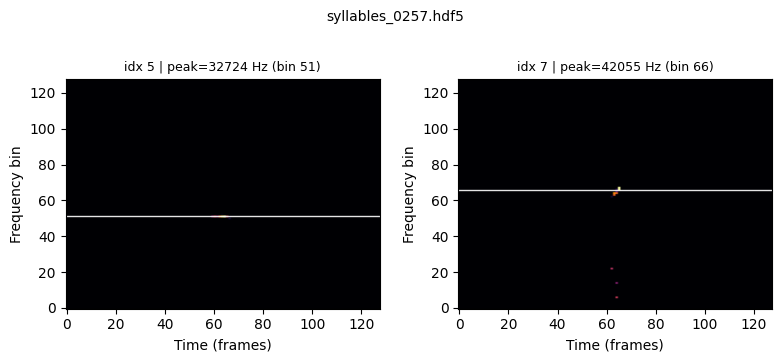

[259/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0258.hdf5
   wrote peak_freq_hz (min=1622.0, max=50141.7)


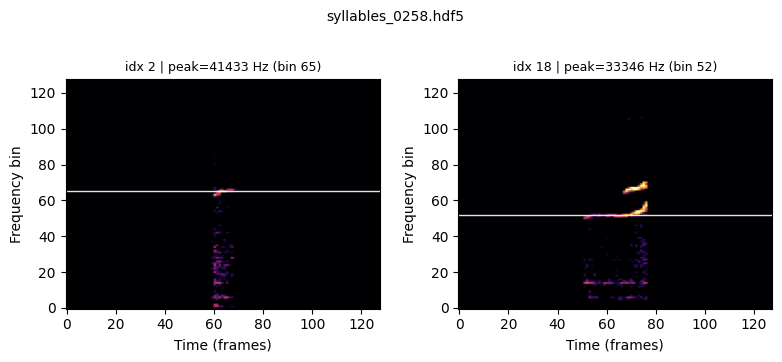

[260/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0259.hdf5
   wrote peak_freq_hz (min=1000.0, max=47653.5)


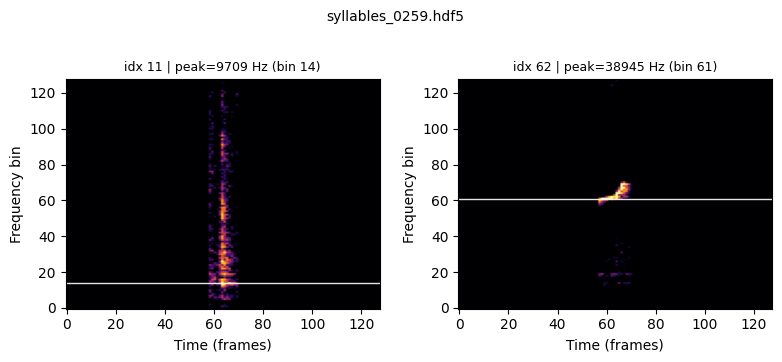

[261/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0260.hdf5
   wrote peak_freq_hz (min=1000.0, max=51385.8)


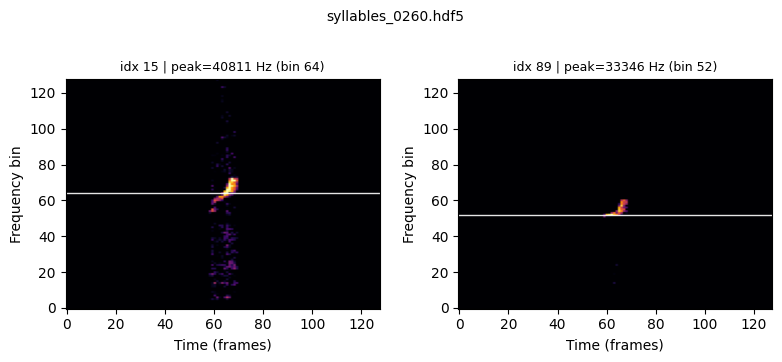

[262/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0261.hdf5
   wrote peak_freq_hz (min=4110.2, max=50763.8)


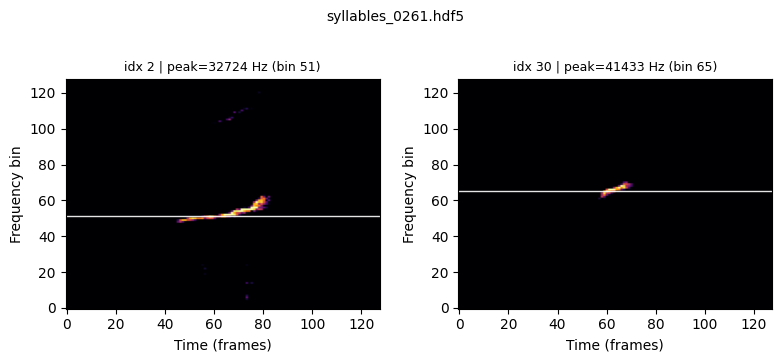

[263/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0262.hdf5
   wrote peak_freq_hz (min=1000.0, max=61338.6)


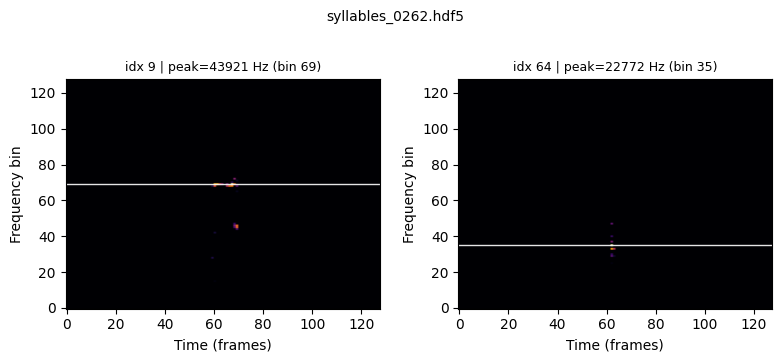

[264/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0263.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


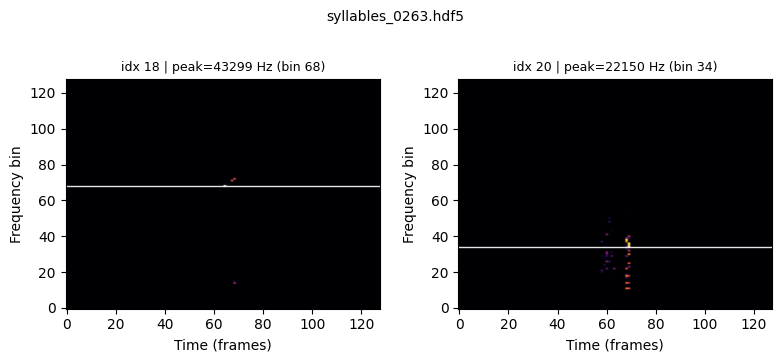

[265/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0264.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


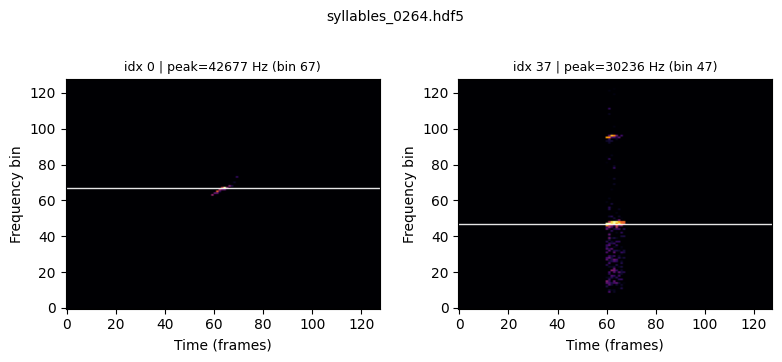

[266/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0265.hdf5
   wrote peak_freq_hz (min=1622.0, max=48275.6)


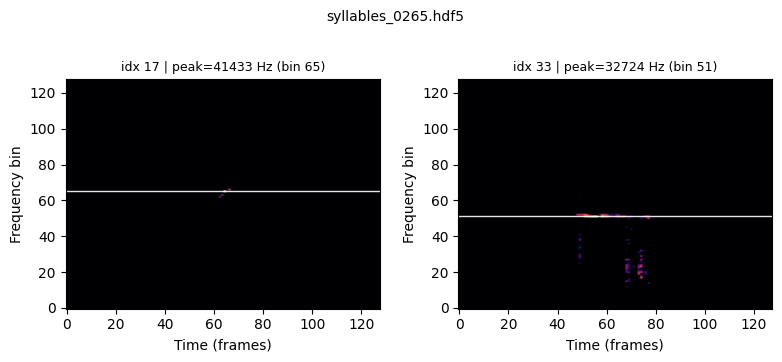

[267/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0266.hdf5
   wrote peak_freq_hz (min=1000.0, max=76889.8)


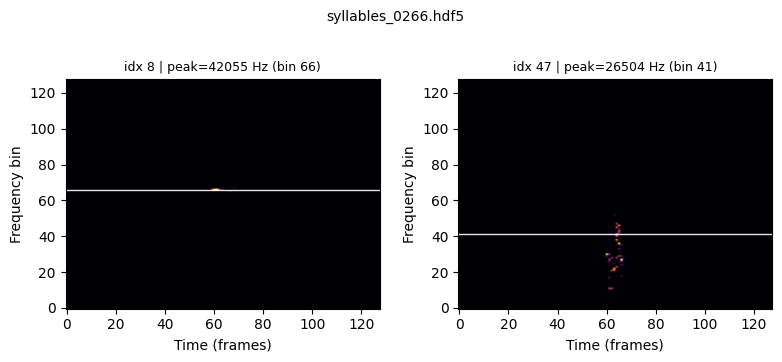

[268/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0267.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


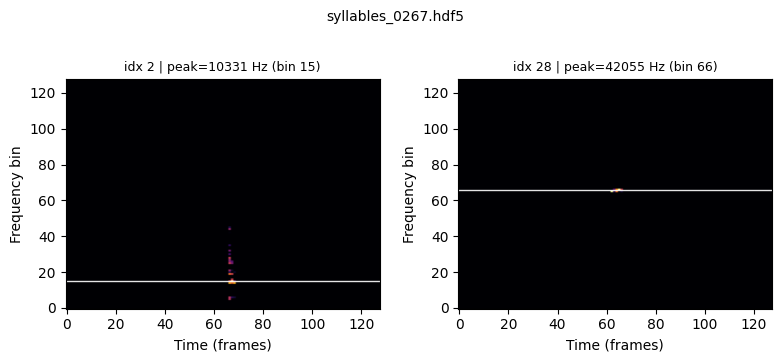

[269/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0268.hdf5
   wrote peak_freq_hz (min=1000.0, max=66937.0)


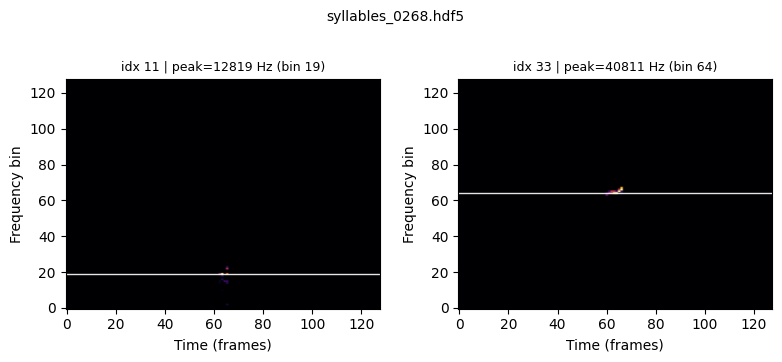

[270/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0269.hdf5
   wrote peak_freq_hz (min=1000.0, max=56362.2)


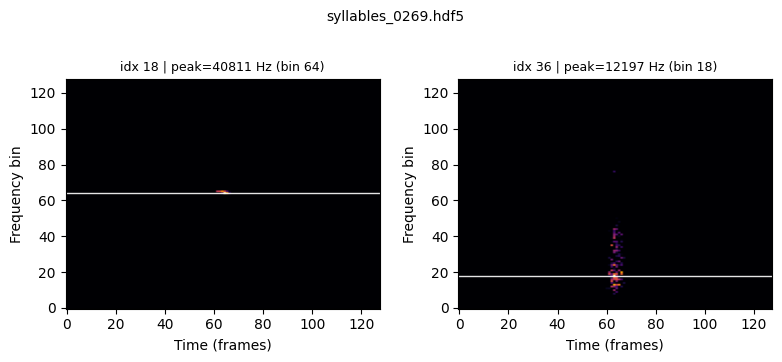

[271/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0270.hdf5
   wrote peak_freq_hz (min=1000.0, max=56984.3)


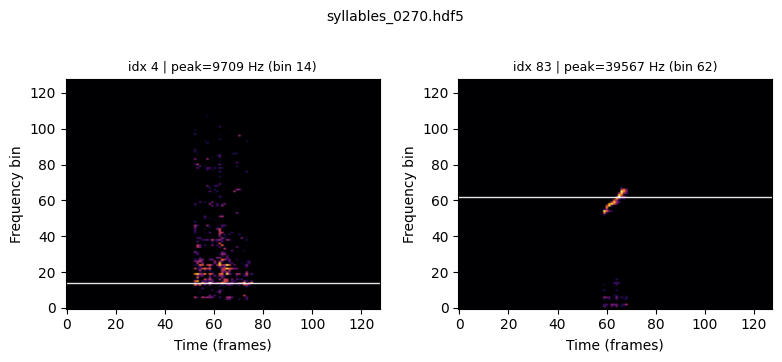

[272/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0271.hdf5
   wrote peak_freq_hz (min=1000.0, max=47031.5)


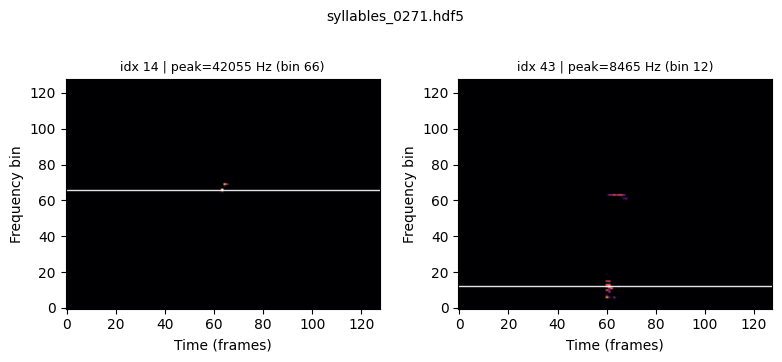

[273/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0272.hdf5
   wrote peak_freq_hz (min=4732.3, max=65070.9)


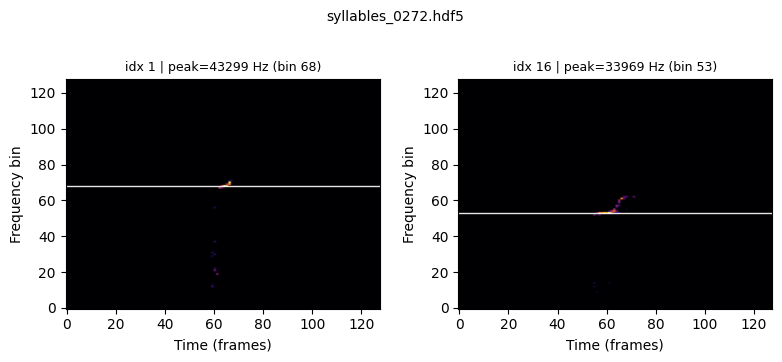

[274/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0273.hdf5
   wrote peak_freq_hz (min=1000.0, max=61960.6)


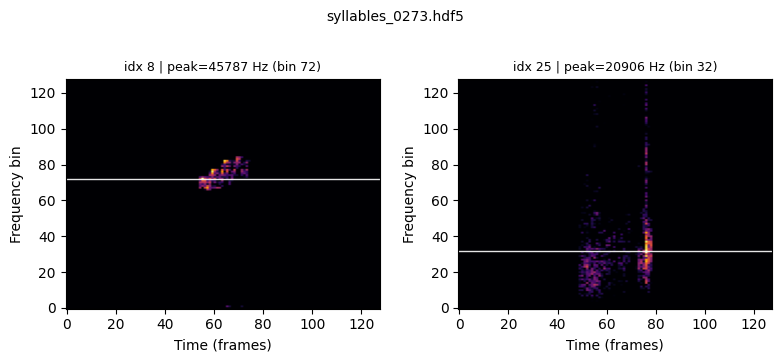

[275/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0274.hdf5
   wrote peak_freq_hz (min=1000.0, max=45165.4)


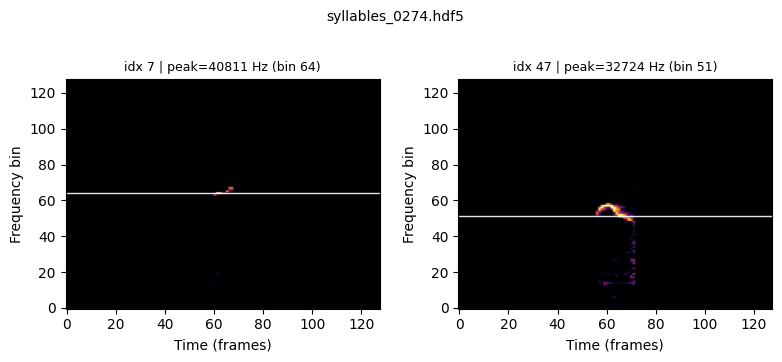

[276/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0275.hdf5
   wrote peak_freq_hz (min=4732.3, max=71913.4)


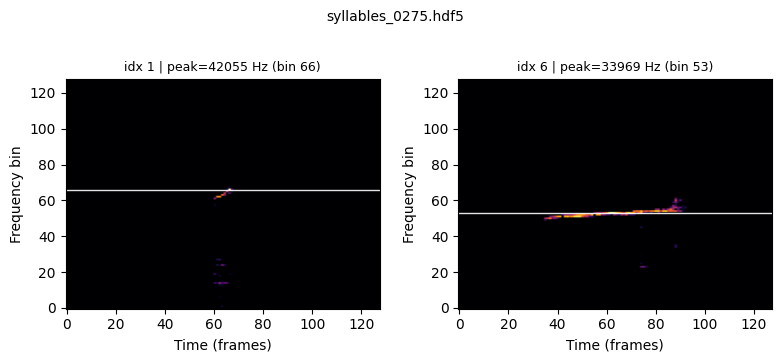

[277/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0276.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


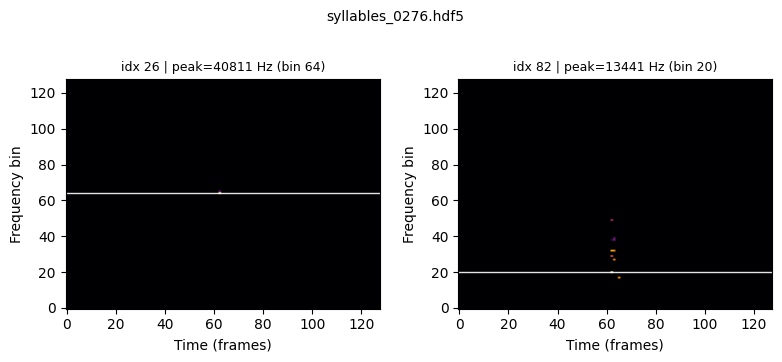

[278/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0277.hdf5
   wrote peak_freq_hz (min=1000.0, max=44543.3)


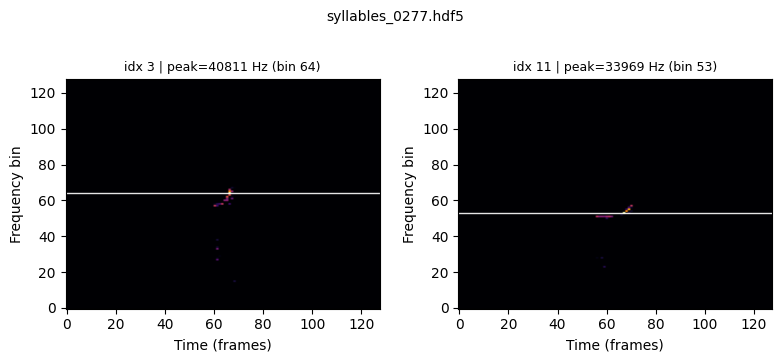

[279/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0278.hdf5
   wrote peak_freq_hz (min=1000.0, max=43921.3)


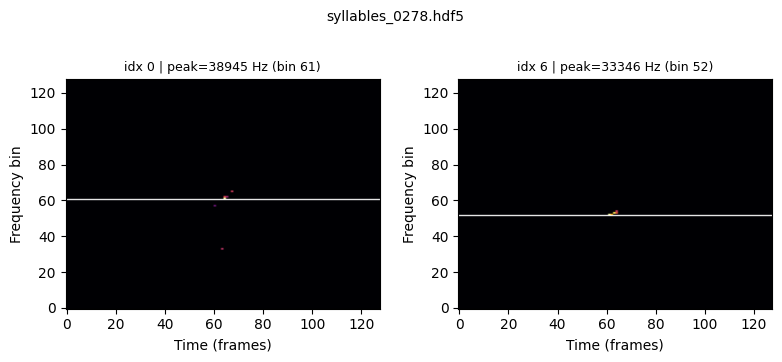

[280/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0279.hdf5
   wrote peak_freq_hz (min=1000.0, max=43921.3)


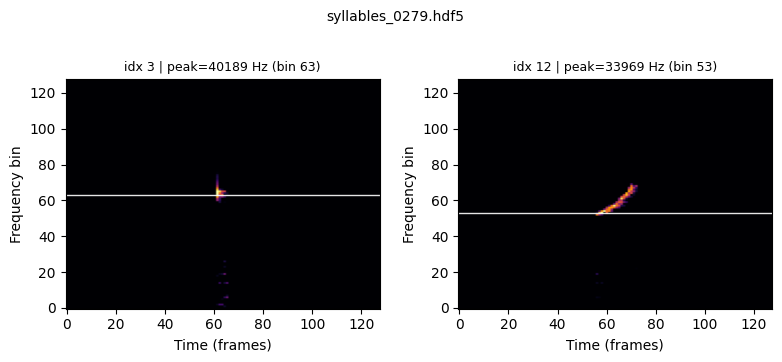

[281/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0280.hdf5
   wrote peak_freq_hz (min=1622.0, max=59472.4)


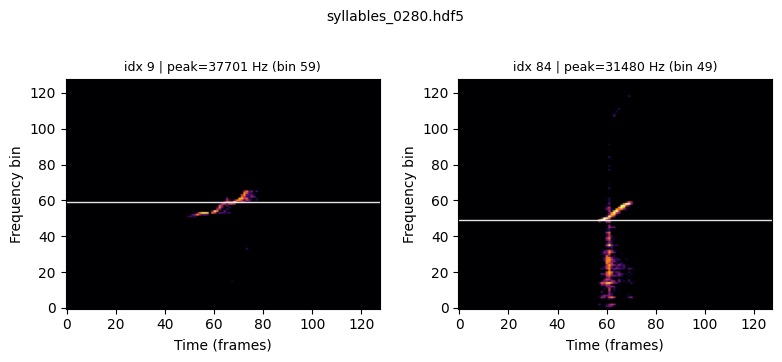

[282/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0281.hdf5
   wrote peak_freq_hz (min=1000.0, max=42677.2)


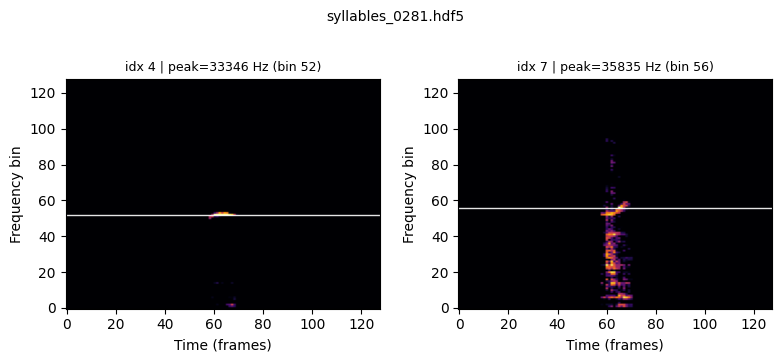

[283/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0282.hdf5
   wrote peak_freq_hz (min=1000.0, max=43299.2)


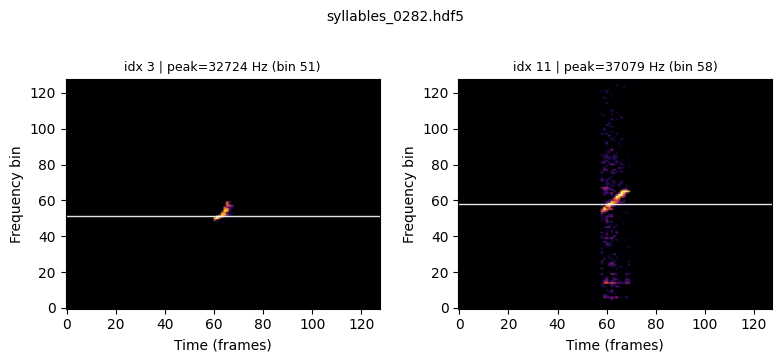

[284/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0283.hdf5
   wrote peak_freq_hz (min=1000.0, max=48275.6)


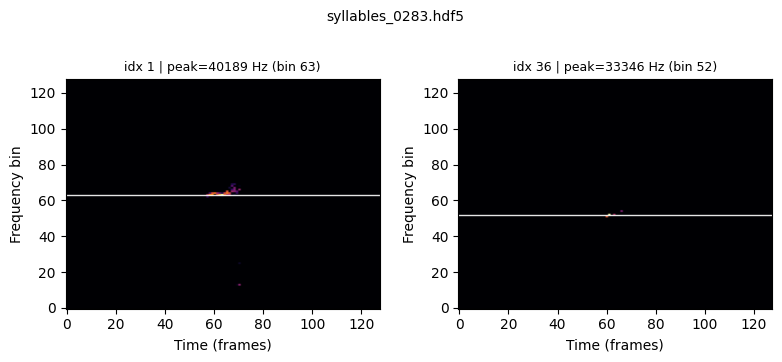

[285/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0284.hdf5
   wrote peak_freq_hz (min=1000.0, max=45787.4)


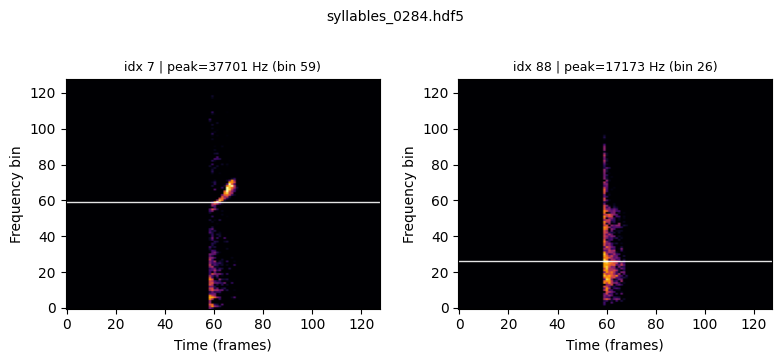

[286/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0285.hdf5
   wrote peak_freq_hz (min=1622.0, max=45165.4)


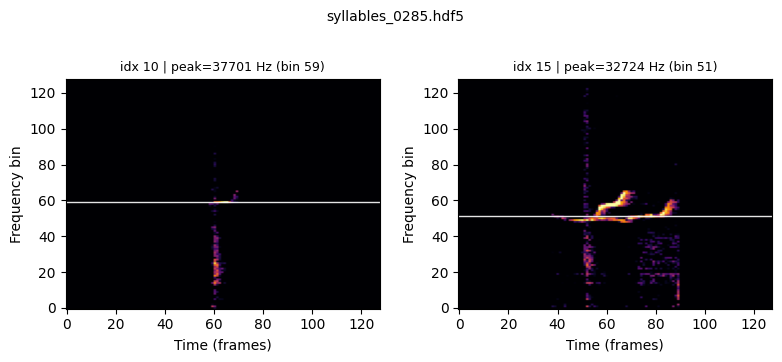

[287/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0286.hdf5
   wrote peak_freq_hz (min=1622.0, max=54496.1)


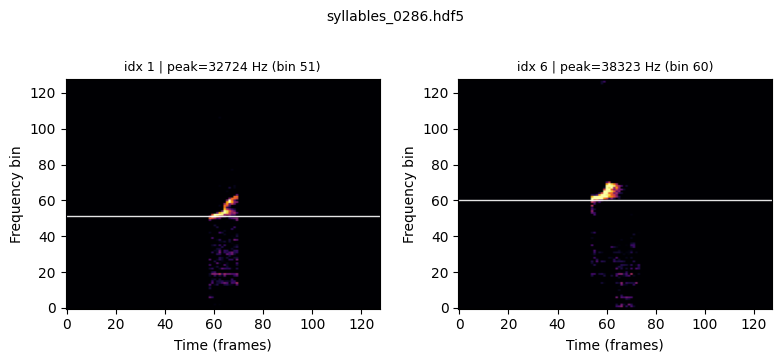

[288/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0287.hdf5
   wrote peak_freq_hz (min=4732.3, max=43299.2)


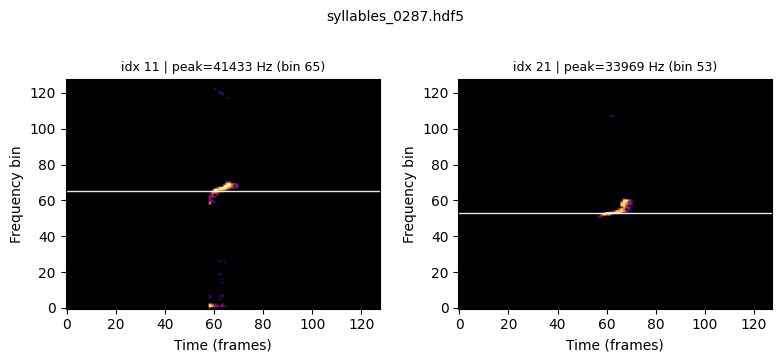

[289/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0288.hdf5
   wrote peak_freq_hz (min=1000.0, max=45165.4)


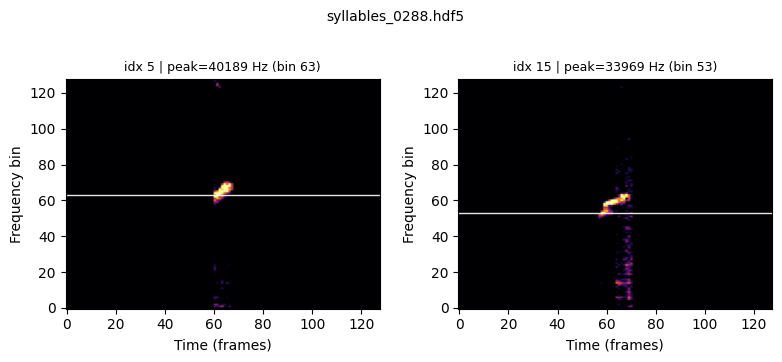

[290/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0289.hdf5
   wrote peak_freq_hz (min=1000.0, max=51385.8)


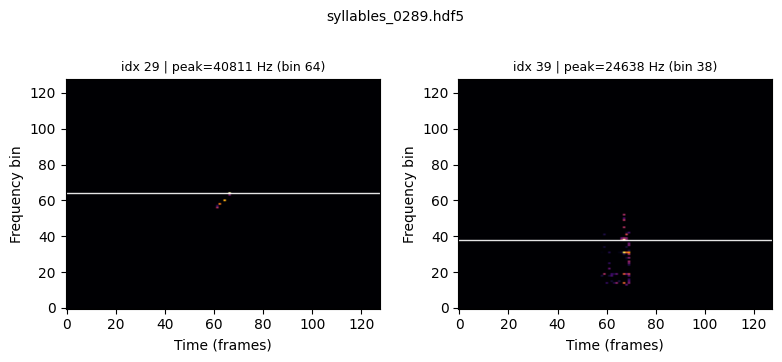

[291/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0290.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


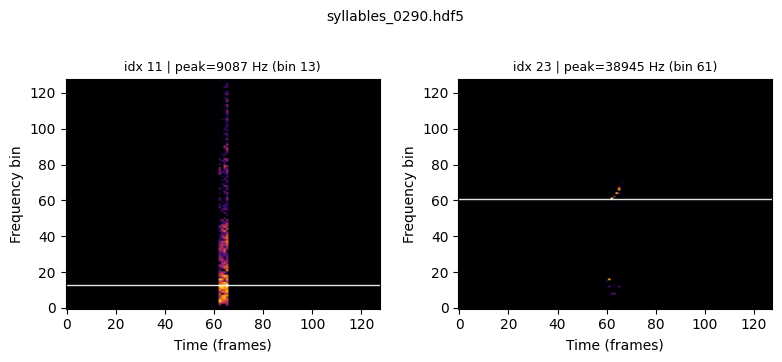

[292/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0291.hdf5
   wrote peak_freq_hz (min=1000.0, max=54496.1)


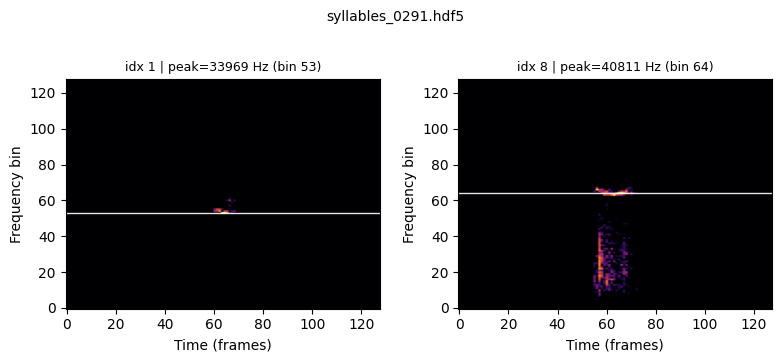

[293/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0292.hdf5
   wrote peak_freq_hz (min=1622.0, max=48897.6)


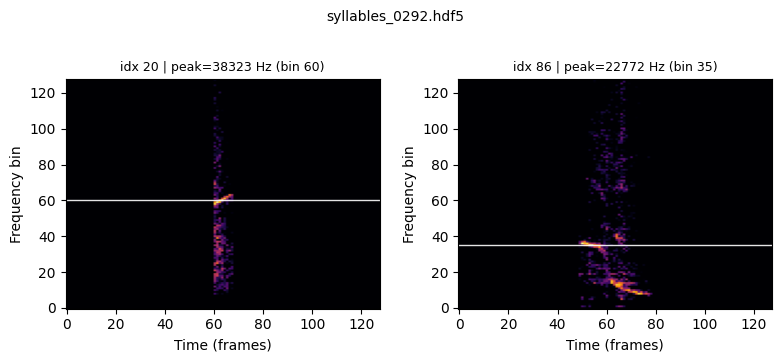

[294/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0293.hdf5
   wrote peak_freq_hz (min=1000.0, max=47653.5)


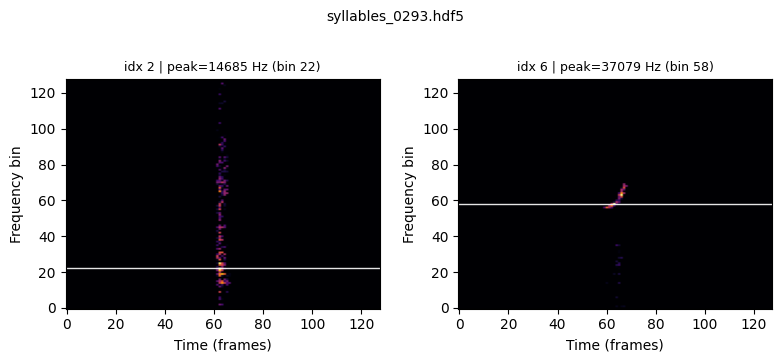

[295/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0294.hdf5
   wrote peak_freq_hz (min=2244.1, max=47031.5)


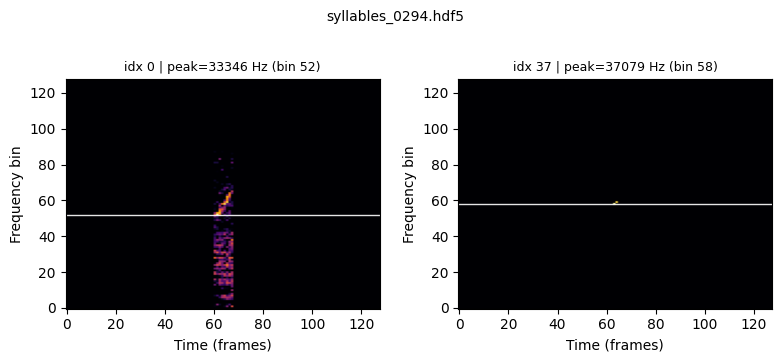

[296/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0295.hdf5
   wrote peak_freq_hz (min=1000.0, max=45787.4)


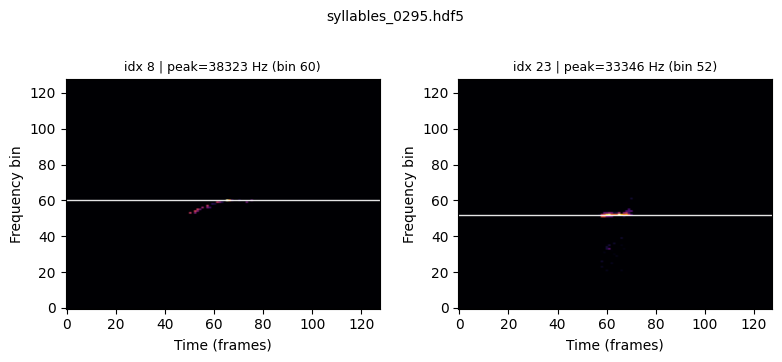

[297/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0296.hdf5
   wrote peak_freq_hz (min=1000.0, max=47653.5)


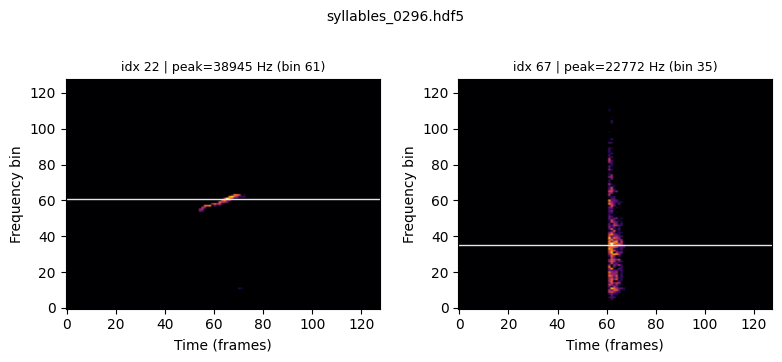

[298/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0297.hdf5
   wrote peak_freq_hz (min=1000.0, max=42055.1)


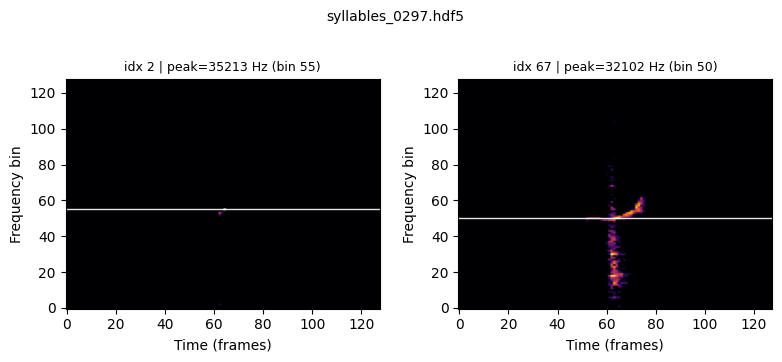

[299/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0298.hdf5
   wrote peak_freq_hz (min=1622.0, max=49519.7)


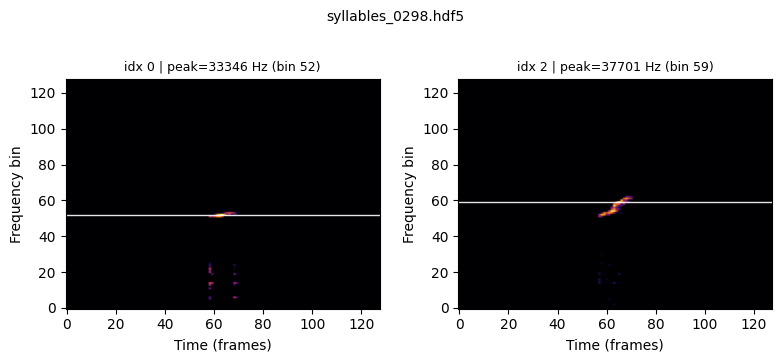

[300/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0299.hdf5
   wrote peak_freq_hz (min=2244.1, max=43921.3)


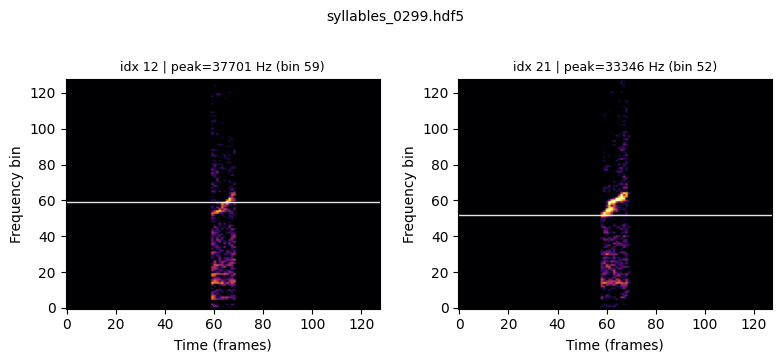

[301/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0300.hdf5
   wrote peak_freq_hz (min=2244.1, max=43921.3)


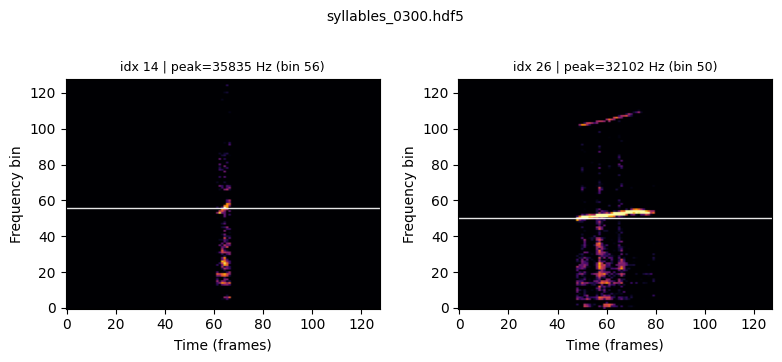

[302/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0301.hdf5
   wrote peak_freq_hz (min=1622.0, max=48275.6)


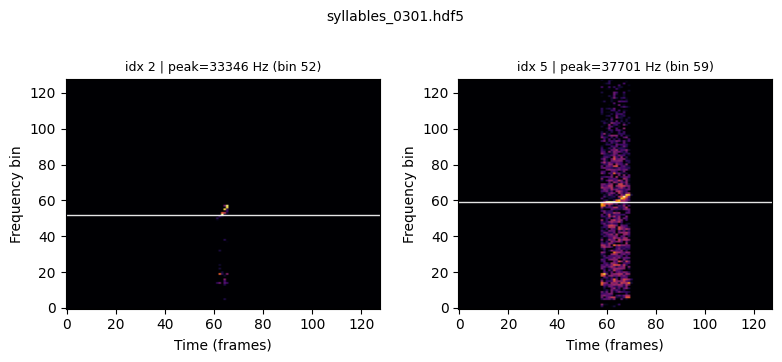

[303/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0302.hdf5
   wrote peak_freq_hz (min=1622.0, max=43921.3)


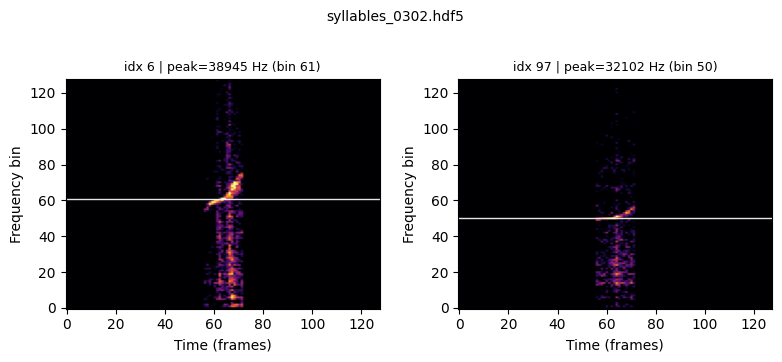

[304/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0303.hdf5
   wrote peak_freq_hz (min=1622.0, max=53874.0)


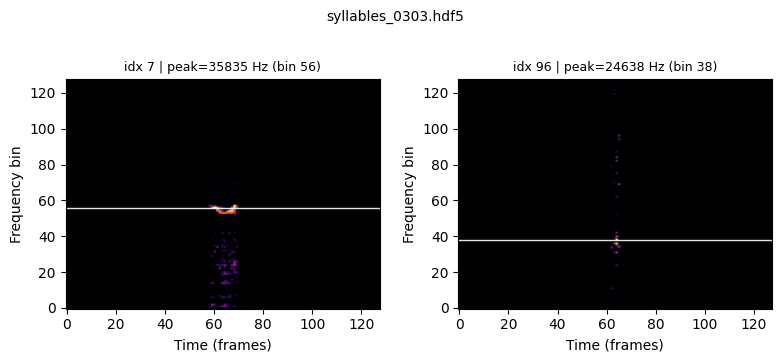

[305/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0304.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


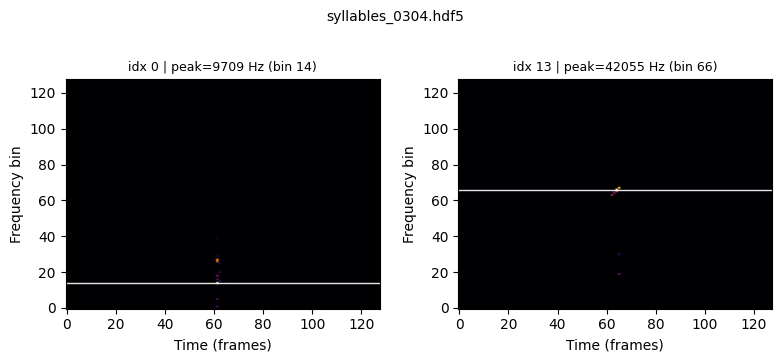

[306/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0305.hdf5
   wrote peak_freq_hz (min=1622.0, max=61338.6)


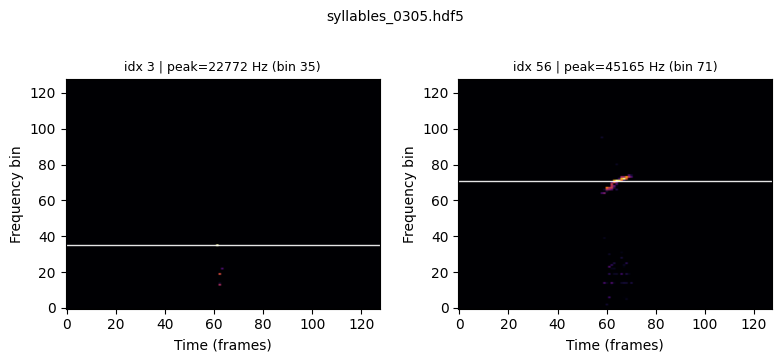

[307/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0306.hdf5
   wrote peak_freq_hz (min=1000.0, max=56984.3)


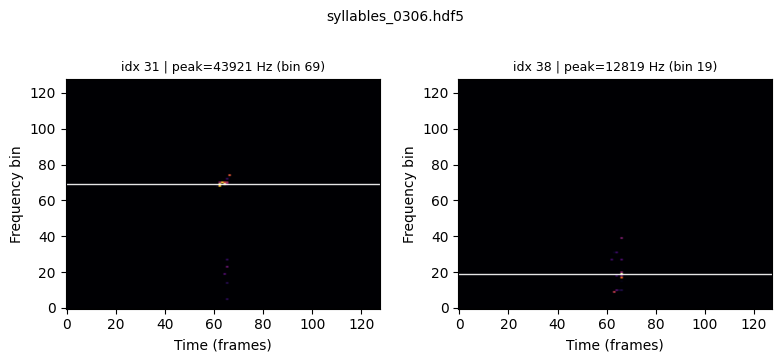

[308/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0307.hdf5
   wrote peak_freq_hz (min=1622.0, max=55740.2)


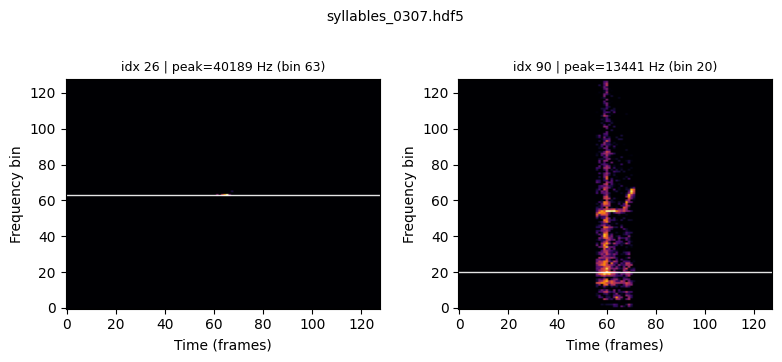

[309/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0308.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


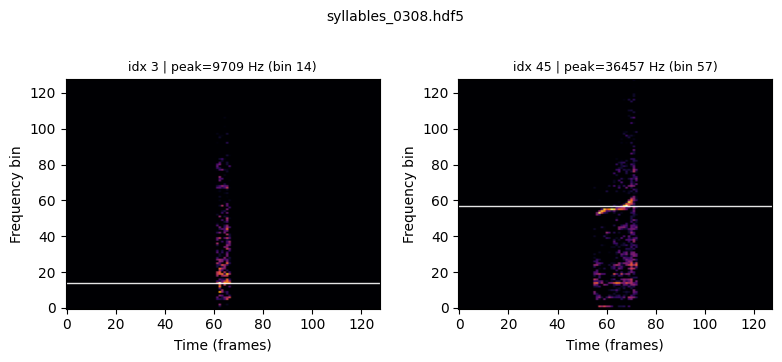

[310/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0309.hdf5
   wrote peak_freq_hz (min=7842.5, max=63826.8)


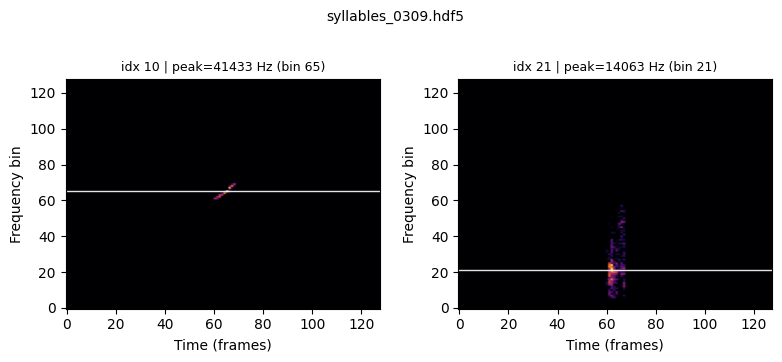

[311/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0310.hdf5
   wrote peak_freq_hz (min=1622.0, max=55118.1)


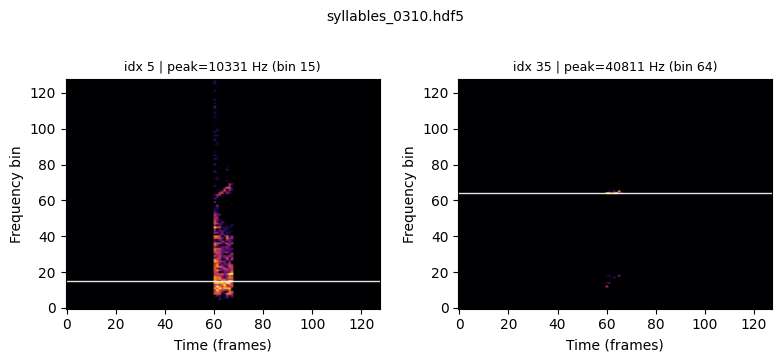

[312/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0311.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


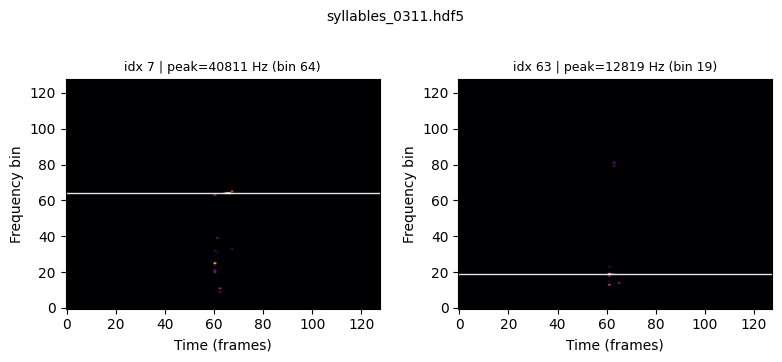

[313/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0312.hdf5
   wrote peak_freq_hz (min=1000.0, max=58850.4)


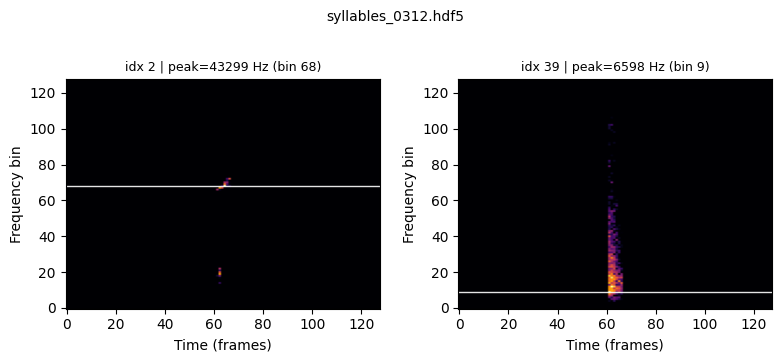

[314/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0313.hdf5
   wrote peak_freq_hz (min=1622.0, max=50763.8)


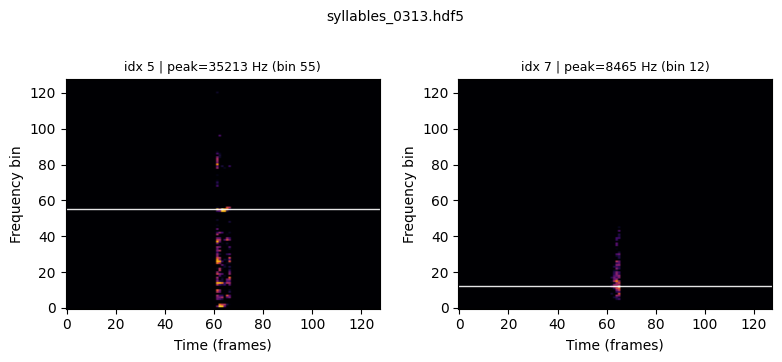

[315/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0314.hdf5
   wrote peak_freq_hz (min=1622.0, max=53252.0)


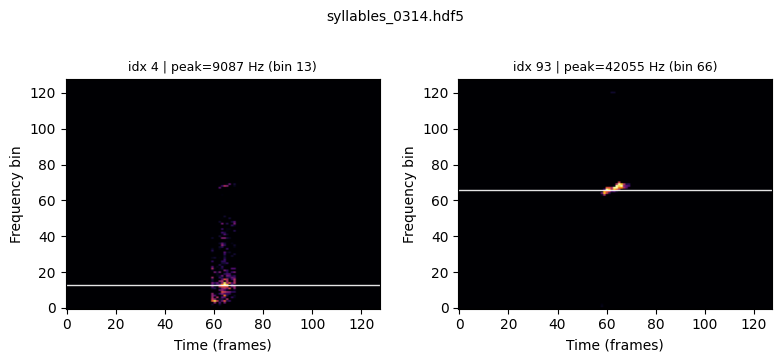

[316/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0315.hdf5
   wrote peak_freq_hz (min=1000.0, max=45165.4)


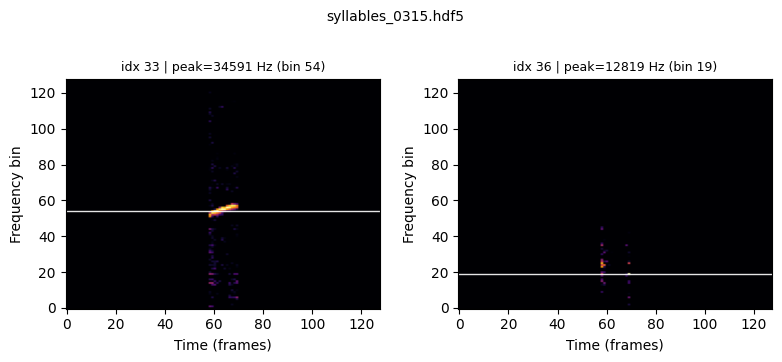

[317/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0316.hdf5
   wrote peak_freq_hz (min=1622.0, max=42677.2)


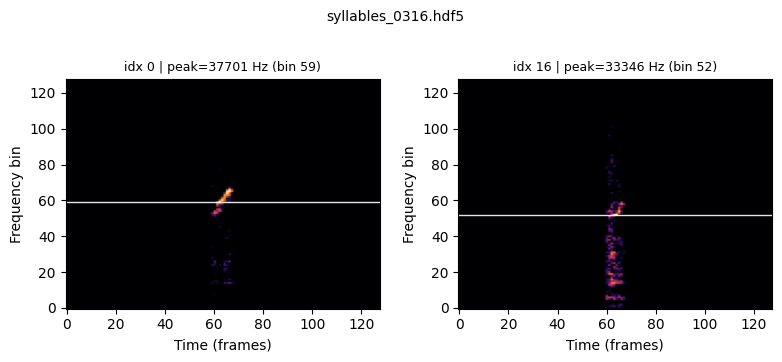

[318/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0317.hdf5
   wrote peak_freq_hz (min=1622.0, max=46409.4)


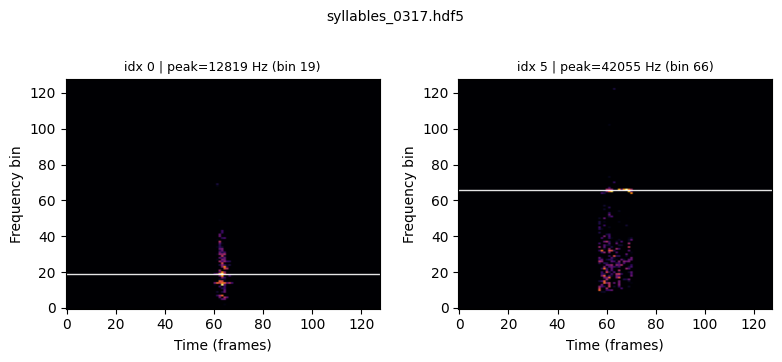

[319/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0318.hdf5
   wrote peak_freq_hz (min=1622.0, max=48275.6)


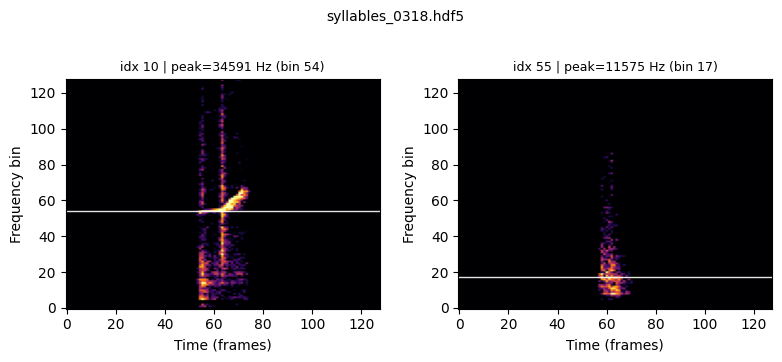

[320/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0319.hdf5
   wrote peak_freq_hz (min=1622.0, max=42677.2)


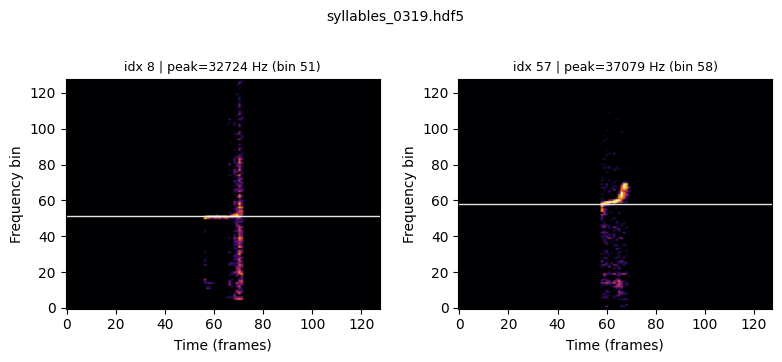

[321/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0320.hdf5
   wrote peak_freq_hz (min=2244.1, max=49519.7)


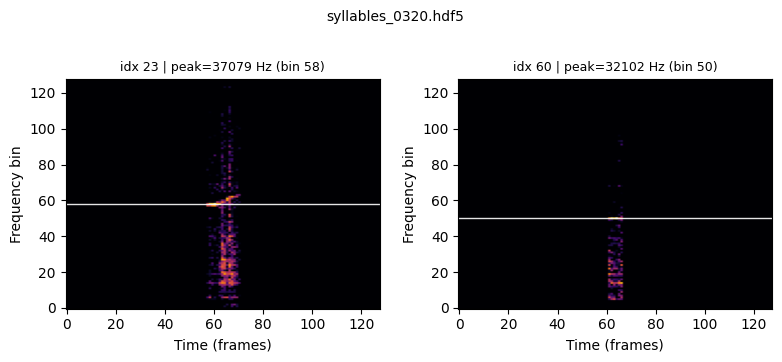

[322/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0321.hdf5
   wrote peak_freq_hz (min=2244.1, max=65692.9)


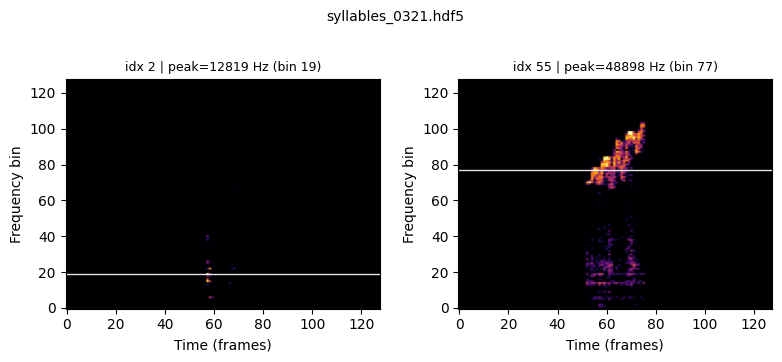

[323/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0322.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


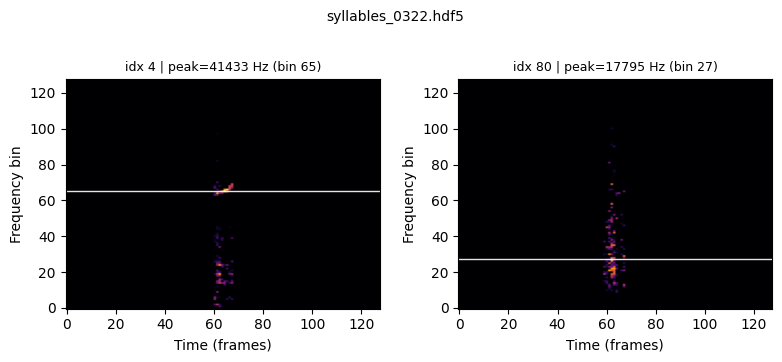

[324/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0323.hdf5
   wrote peak_freq_hz (min=1000.0, max=63204.7)


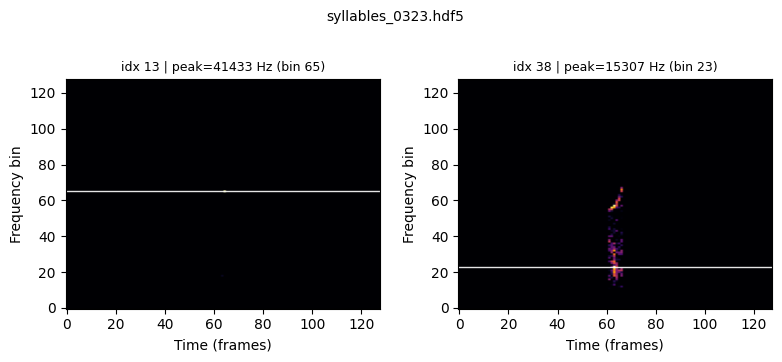

[325/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0324.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


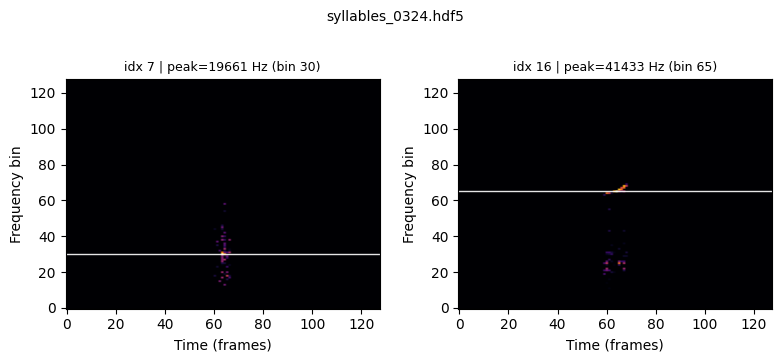

[326/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0325.hdf5
   wrote peak_freq_hz (min=1000.0, max=70047.2)


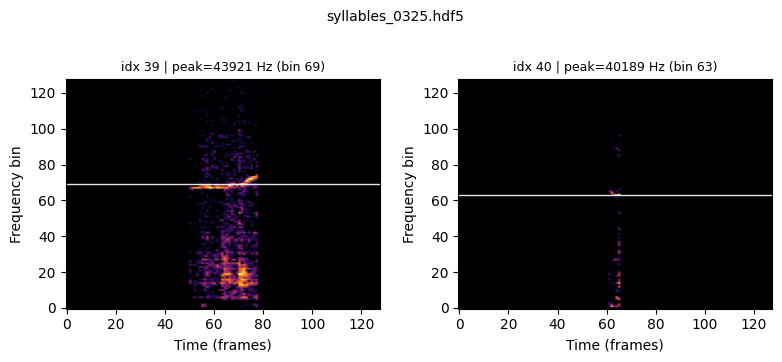

[327/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0326.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


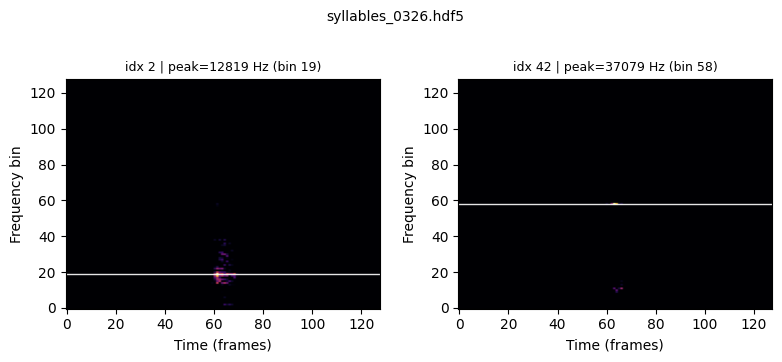

[328/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0327.hdf5
   wrote peak_freq_hz (min=1000.0, max=45787.4)


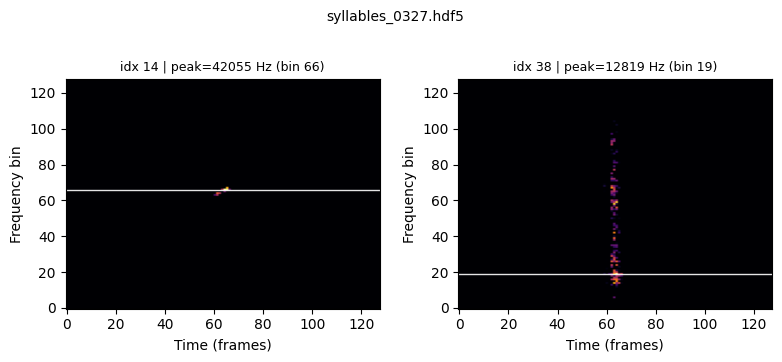

[329/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0328.hdf5
   wrote peak_freq_hz (min=1622.0, max=45787.4)


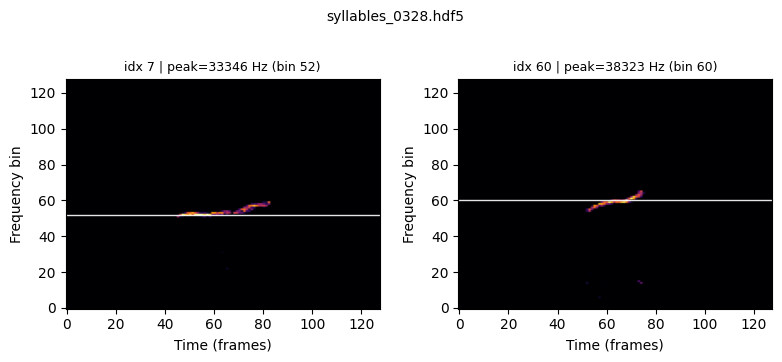

[330/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0329.hdf5
   wrote peak_freq_hz (min=4110.2, max=53874.0)


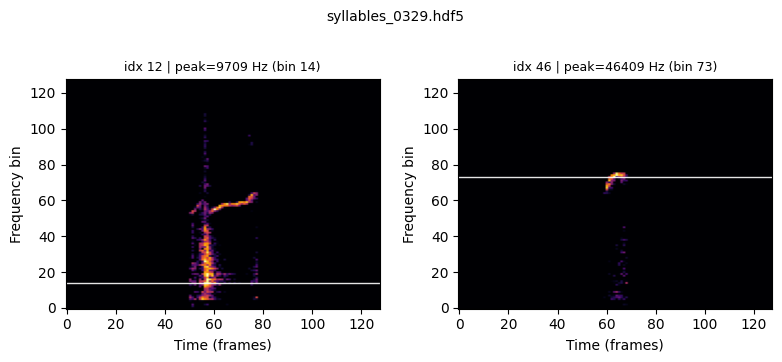

[331/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0330.hdf5
   wrote peak_freq_hz (min=4110.2, max=52007.9)


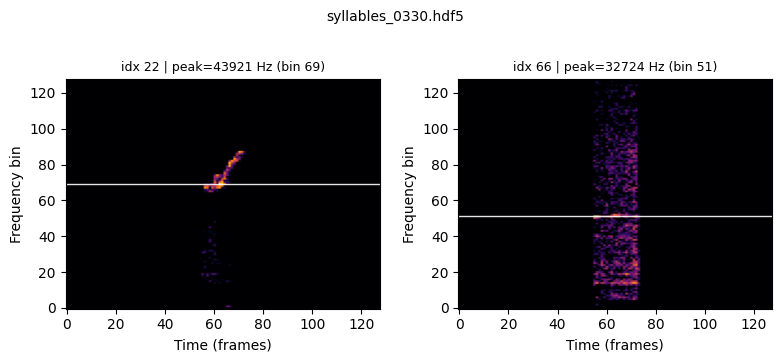

[332/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0331.hdf5
   wrote peak_freq_hz (min=1622.0, max=46409.4)


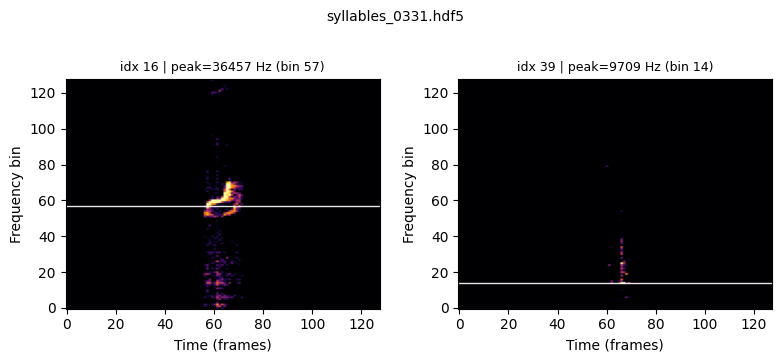

[333/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0332.hdf5
   wrote peak_freq_hz (min=1622.0, max=43299.2)


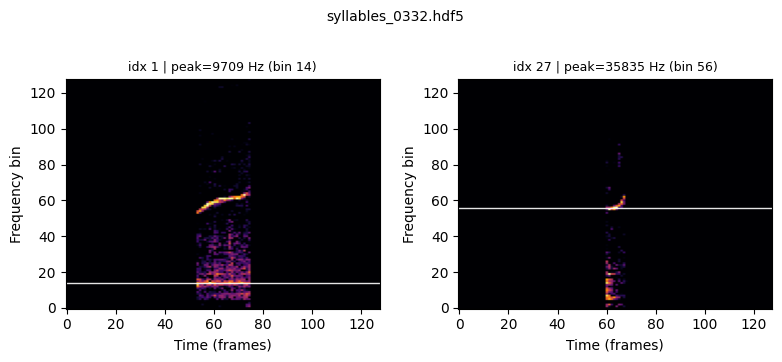

[334/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0333.hdf5
   wrote peak_freq_hz (min=1622.0, max=45165.4)


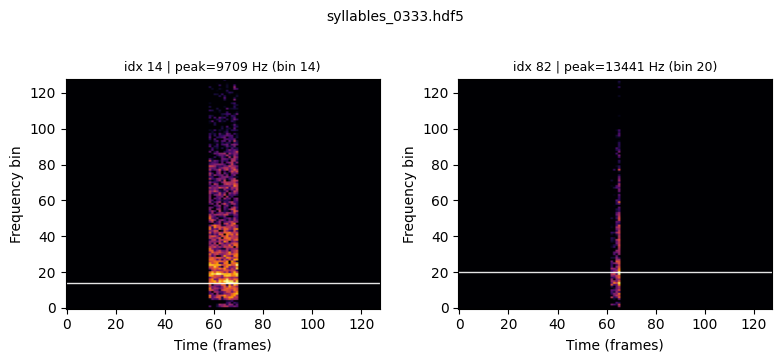

[335/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0334.hdf5
   wrote peak_freq_hz (min=1000.0, max=50141.7)


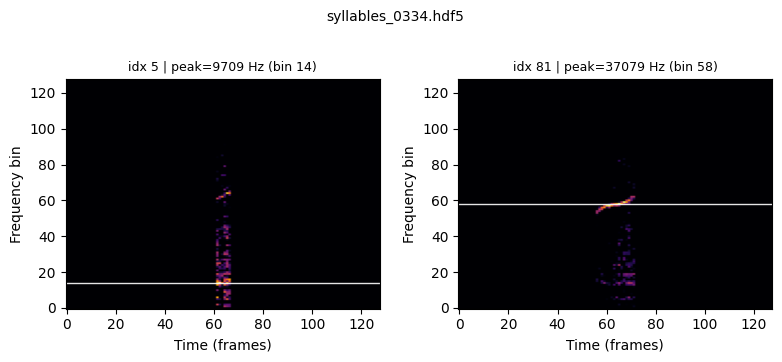

[336/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0335.hdf5
   wrote peak_freq_hz (min=1000.0, max=60716.5)


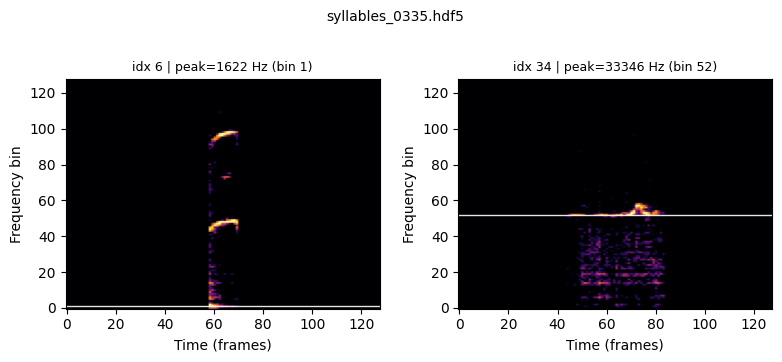

[337/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0336.hdf5
   wrote peak_freq_hz (min=1622.0, max=50141.7)


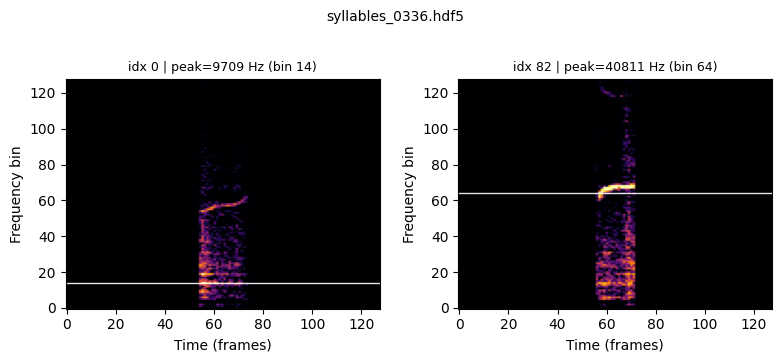

[338/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0337.hdf5
   wrote peak_freq_hz (min=2244.1, max=53252.0)


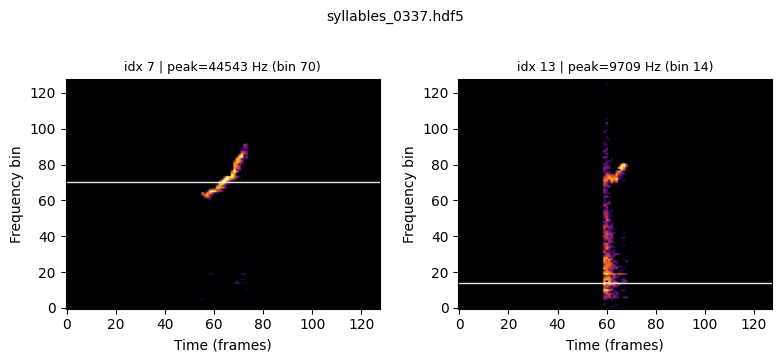

[339/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0338.hdf5
   wrote peak_freq_hz (min=1622.0, max=50141.7)


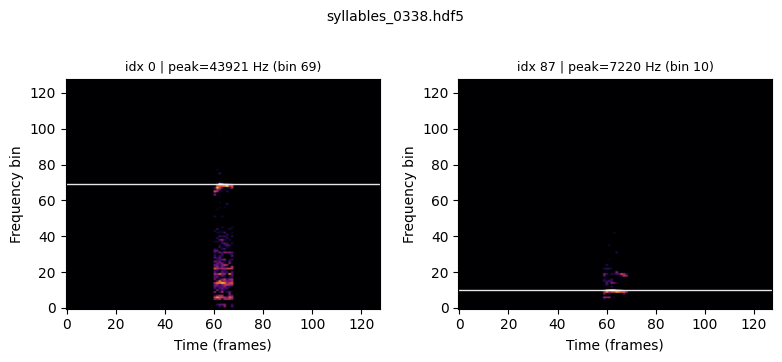

[340/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0339.hdf5
   wrote peak_freq_hz (min=1622.0, max=50763.8)


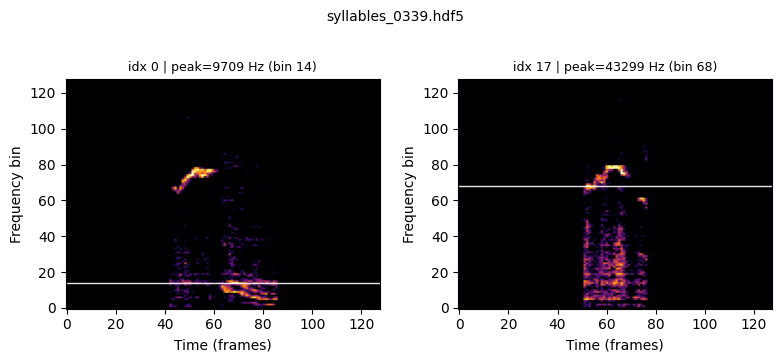

[341/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0340.hdf5
   wrote peak_freq_hz (min=4110.2, max=48897.6)


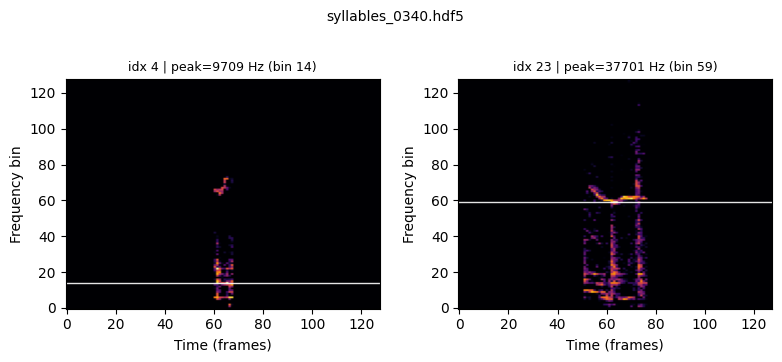

[342/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0341.hdf5
   wrote peak_freq_hz (min=1622.0, max=45165.4)


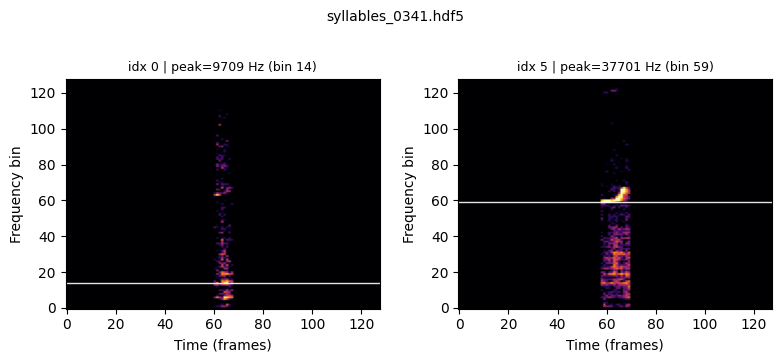

[343/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0342.hdf5
   wrote peak_freq_hz (min=1622.0, max=49519.7)


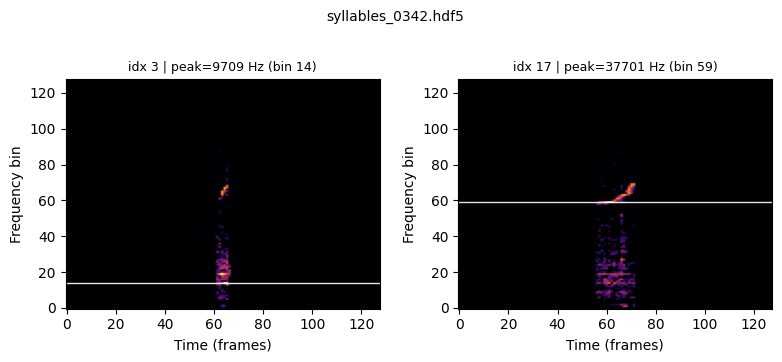

[344/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0343.hdf5
   wrote peak_freq_hz (min=2244.1, max=48897.6)


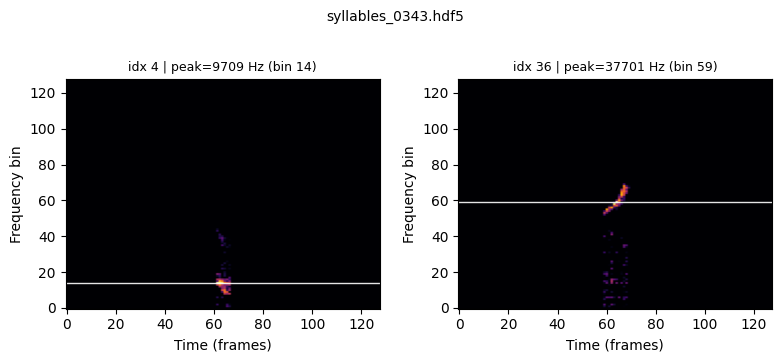

[345/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0344.hdf5
   wrote peak_freq_hz (min=1000.0, max=53252.0)


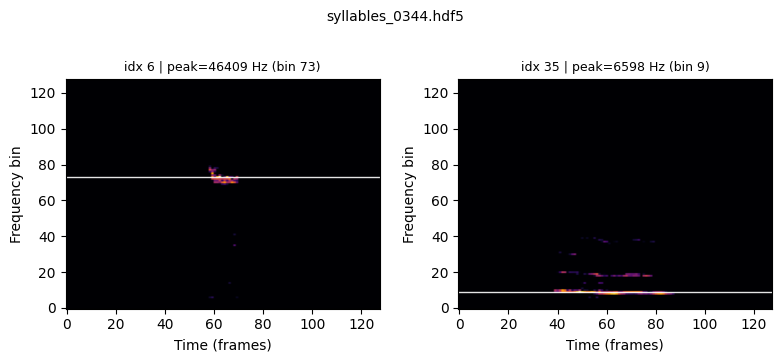

[346/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0345.hdf5
   wrote peak_freq_hz (min=1622.0, max=52007.9)


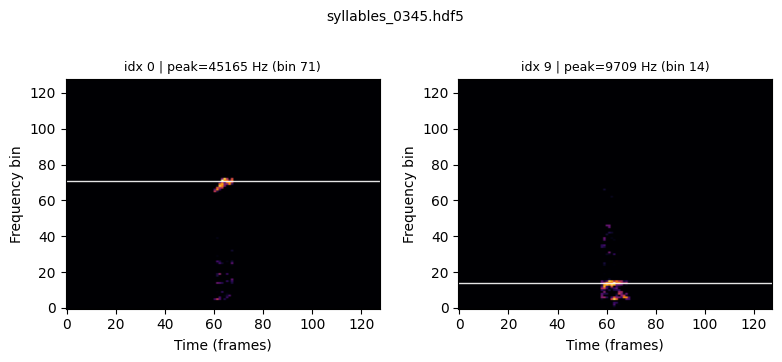

[347/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0346.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


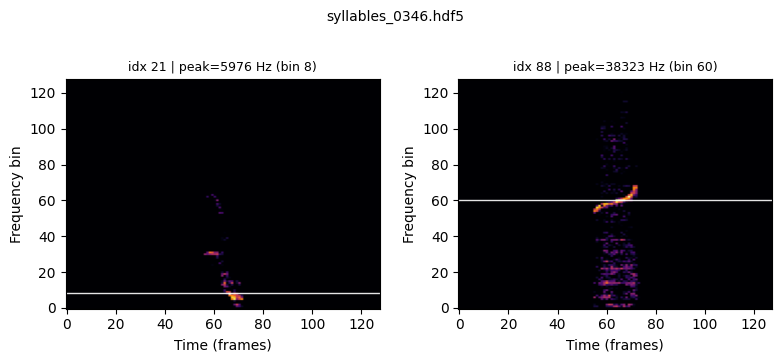

[348/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0347.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


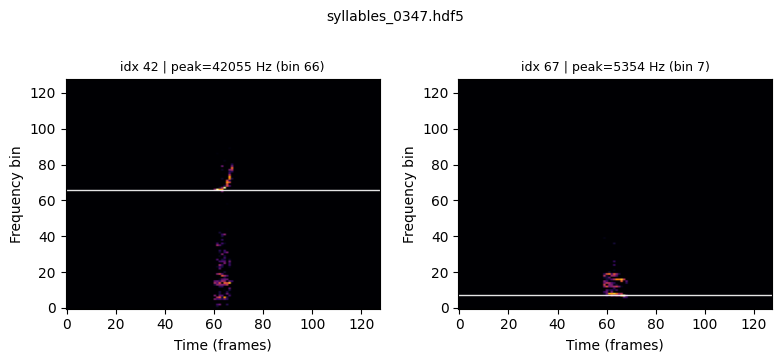

[349/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0348.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


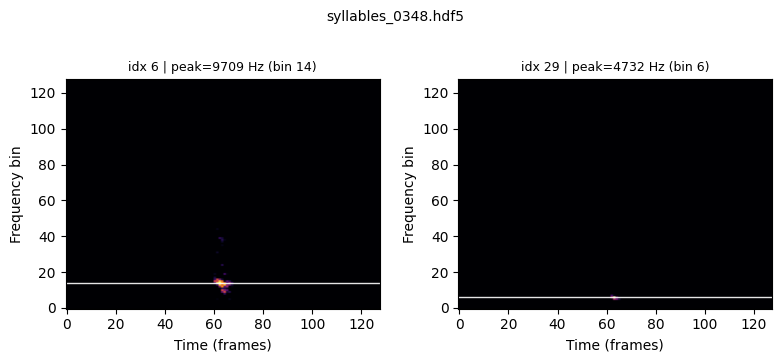

[350/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0349.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


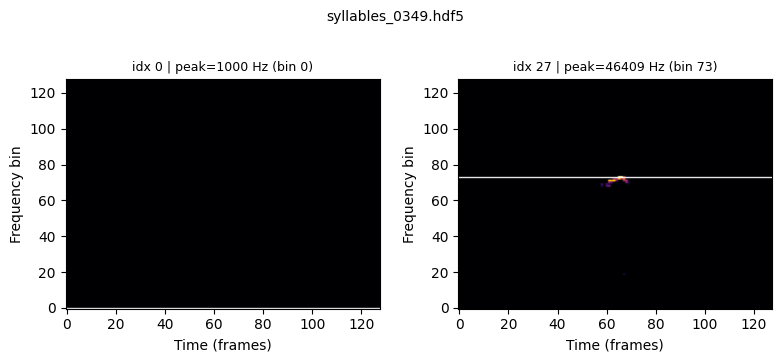

[351/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0350.hdf5
   wrote peak_freq_hz (min=1000.0, max=57606.3)


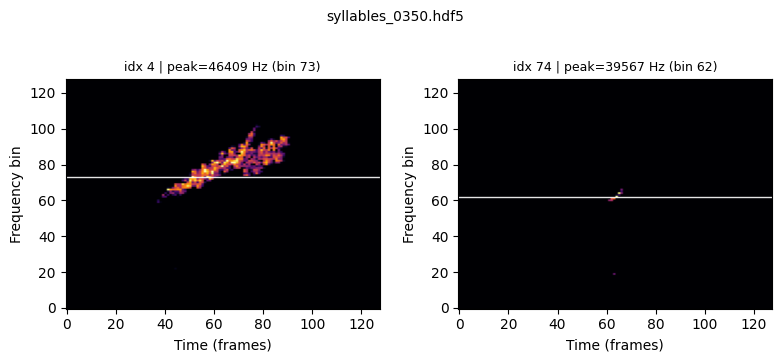

[352/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0351.hdf5
   wrote peak_freq_hz (min=1000.0, max=49519.7)


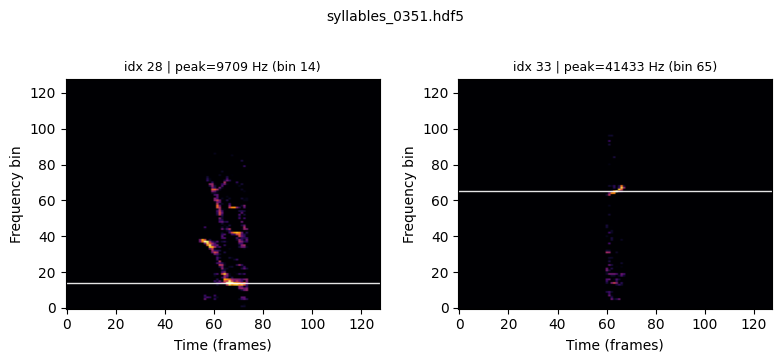

[353/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0352.hdf5
   wrote peak_freq_hz (min=4732.3, max=51385.8)


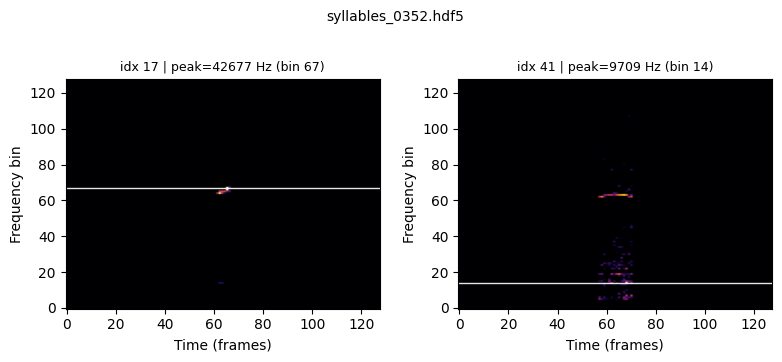

[354/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0353.hdf5
   wrote peak_freq_hz (min=1000.0, max=80000.0)


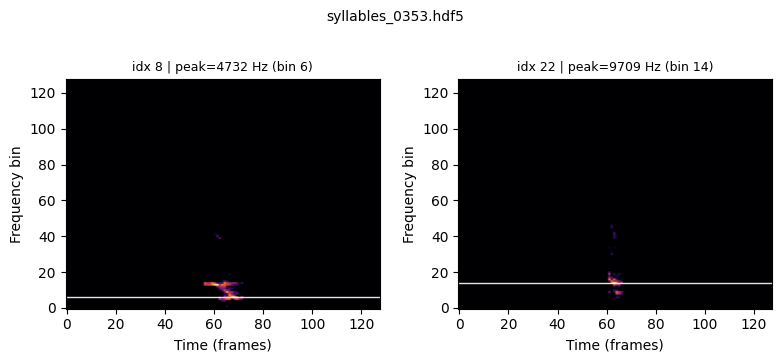

[355/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0354.hdf5
   wrote peak_freq_hz (min=1000.0, max=60094.5)


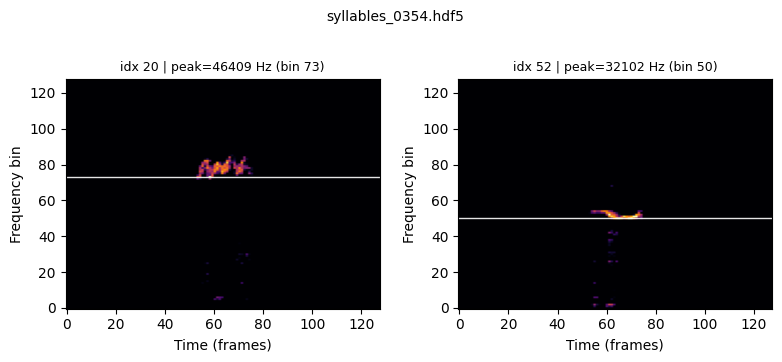

[356/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0355.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


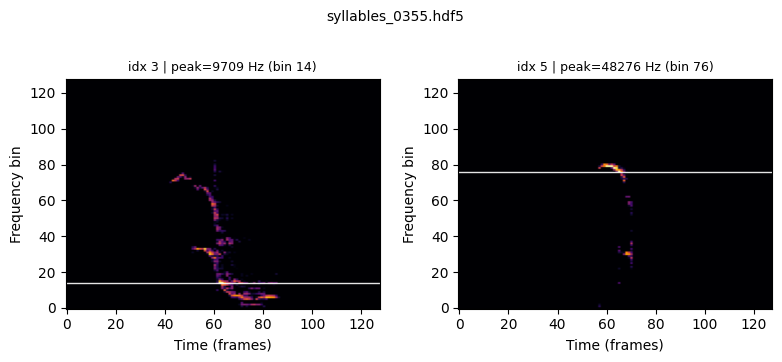

[357/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0356.hdf5
   wrote peak_freq_hz (min=1000.0, max=52007.9)


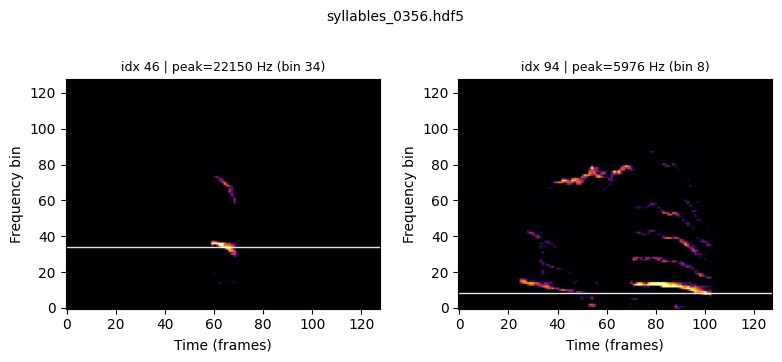

[358/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0357.hdf5
   wrote peak_freq_hz (min=1000.0, max=50763.8)


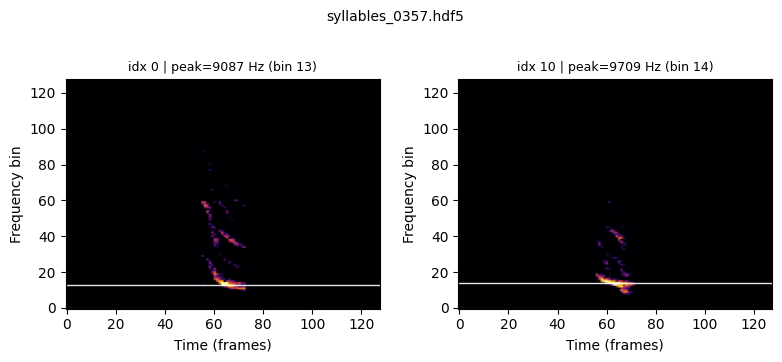

[359/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0358.hdf5
   wrote peak_freq_hz (min=1000.0, max=51385.8)


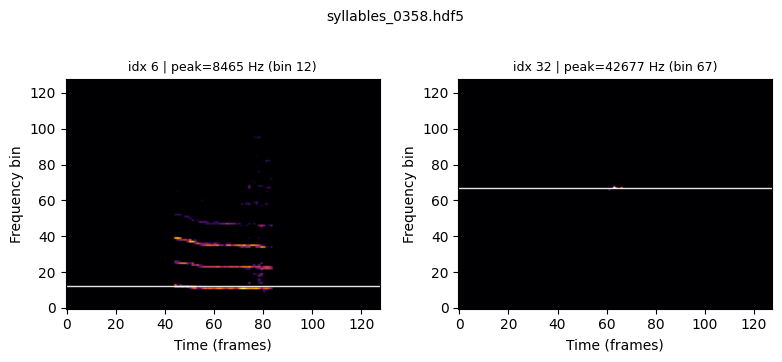

[360/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0359.hdf5
   wrote peak_freq_hz (min=2244.1, max=53874.0)


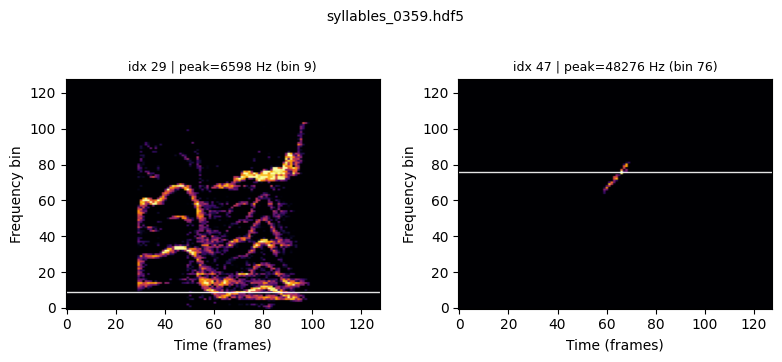

[361/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0360.hdf5
   wrote peak_freq_hz (min=1000.0, max=53874.0)


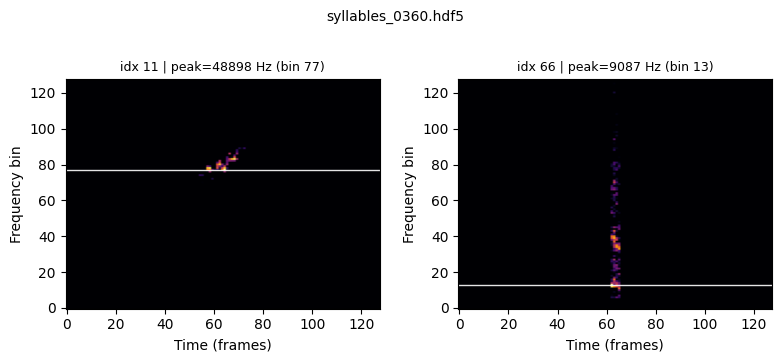

[362/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0361.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


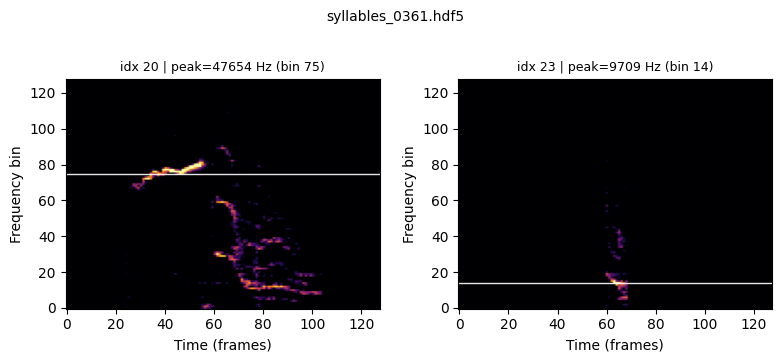

[363/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0362.hdf5
   wrote peak_freq_hz (min=1000.0, max=52629.9)


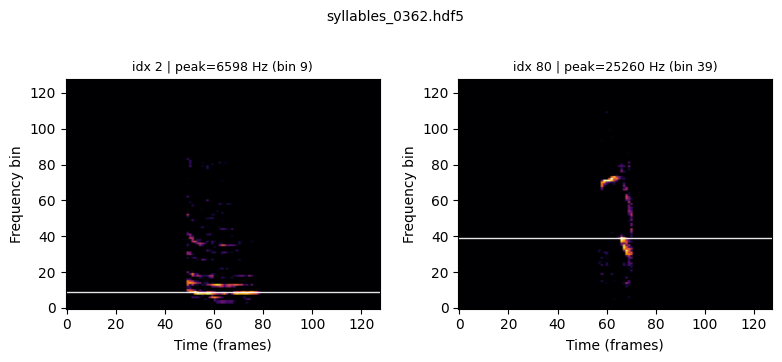

[364/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0363.hdf5
   wrote peak_freq_hz (min=1000.0, max=57606.3)


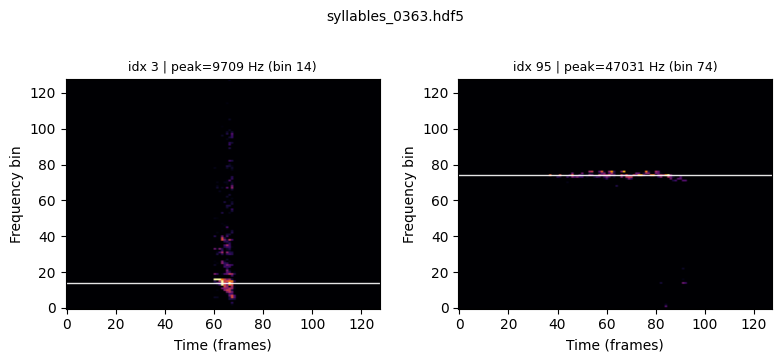

[365/365] updating: D:\Data\235\processed-data-freq\family1\syllables_0364.hdf5
   wrote peak_freq_hz (min=1000.0, max=55118.1)


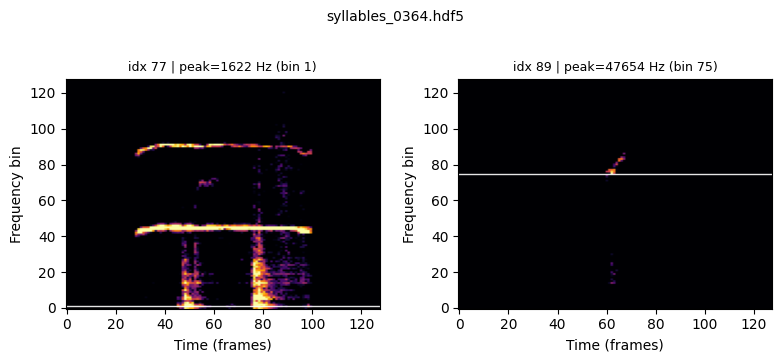

✅ Done updating HDF5 files with 'peak_bin' and 'peak_freq_hz'.


In [34]:
# ============================
# Add peak frequency to existing HDF5 shards + preview plots
# ============================
import os, glob, shutil, h5py
import numpy as np
import matplotlib.pyplot as plt

# ---------- PATHS & BEHAVIOR ----------
H5_DIR_IN   = r"D:\Data\235\processed-data\family1"   # folder containing existing .hdf5 shards
H5_DIR_OUT  = r"D:\Data\235\processed-data-freq\family1"
MAKE_BACKUP = True                   # if modifying in-place, make a .bak copy once per file

# ---------- SPECTROGRAM GRID (must match how specs were made) ----------
IS_MEL        = False                # True if bins are mel-spaced (as in your preprocessing p['mel'])
MIN_FREQ_HZ   = 1000.0               # p['min_freq']
MAX_FREQ_HZ   = 80000.0              # p['max_freq']
NUM_FREQ_BINS = None                 # if None, infer from spec shape (recommended)

# How to summarize across time before finding the peak:
PEAK_METHOD   = "max"                # 'max' (peak over time) or 'mean' (average over time)

# ---------- PREVIEW PLOTS ----------
N_EXAMPLES_PER_FILE = 2              # how many random examples to show per file (set 0 for none)
CMAP = "inferno"

# ---------- helpers ----------
def _mel(f):      # match ava.preprocessing.preprocess helpers
    return 2595 * np.log10(1 + f/700.0)

def _inv_mel(m):
    return 700 * (10**(m/2595.0) - 1)

def build_freq_axis(n_f):
    """Recreate bin-center frequencies in Hz to match how specs were generated."""
    if IS_MEL:
        m_lo, m_hi = _mel(MIN_FREQ_HZ), _mel(MAX_FREQ_HZ)
        return _inv_mel(np.linspace(m_lo, m_hi, n_f))
    else:
        return np.linspace(MIN_FREQ_HZ, MAX_FREQ_HZ, n_f)

def summarize_over_time(spec_2d):
    """spec_2d shape: [F, T] (or [T, F] — we’ll handle below); returns 1D [F]."""
    # Ensure [F, T] ordering
    F, T = spec_2d.shape if spec_2d.shape[0] <= spec_2d.shape[1] else spec_2d.T.shape
    s = spec_2d if spec_2d.shape[0] == F else spec_2d.T
    if PEAK_METHOD == "mean":
        return np.mean(s, axis=1)
    return np.max(s, axis=1)

def ensure_out_path(h5_in_path):
    """Return (out_path, in_place) given config."""
    in_place = (not H5_DIR_OUT)
    if in_place:
        return h5_in_path, True
    os.makedirs(H5_DIR_OUT, exist_ok=True)
    return os.path.join(H5_DIR_OUT, os.path.basename(h5_in_path)), False

# ---------- main ----------
h5_files = sorted(glob.glob(os.path.join(H5_DIR_IN, "*.hdf5")))
print(f"Found {len(h5_files)} HDF5 files in {H5_DIR_IN}")

for fidx, h5_in in enumerate(h5_files, 1):
    out_path, in_place = ensure_out_path(h5_in)

    # copy if writing to a separate output dir
    if not in_place:
        shutil.copy2(h5_in, out_path)
    elif MAKE_BACKUP and not os.path.exists(h5_in + ".bak"):
        shutil.copy2(h5_in, h5_in + ".bak")

    print(f"[{fidx}/{len(h5_files)}] updating: {out_path}")

    with h5py.File(out_path, "r+") as f:
        # specs: expected shape [N, F, T] (as you saved with np.stack)
        specs = f["specs"]
        N = specs.shape[0]
        # infer number of freq bins if not given
        n_f = specs.shape[1] if NUM_FREQ_BINS is None else int(NUM_FREQ_BINS)
        if n_f != specs.shape[1]:
            raise ValueError(f"NUM_FREQ_BINS={n_f} but specs have F={specs.shape[1]}")

        freq_axis_hz = build_freq_axis(n_f)

        # compute peak per spec
        peak_bin = np.empty((N,), dtype=np.int32)
        peak_hz  = np.empty((N,), dtype=np.float32)

        for i in range(N):
            sp = np.array(specs[i])   # shape [F, T]
            profile = summarize_over_time(sp)  # [F]
            b = int(np.argmax(profile))
            peak_bin[i] = b
            peak_hz[i]  = float(freq_axis_hz[b])

        # write/overwrite datasets
        if "peak_bin" in f:
            del f["peak_bin"]
        if "peak_freq_hz" in f:
            del f["peak_freq_hz"]
        f.create_dataset("peak_bin",     data=peak_bin,  dtype="i4")
        f.create_dataset("peak_freq_hz", data=peak_hz,   dtype="f4")

        # quick sanity echo
        print(f"   wrote peak_freq_hz (min={peak_hz.min():.1f}, max={peak_hz.max():.1f})")

        # -------- inline previews (not saved) --------
        if N_EXAMPLES_PER_FILE > 0:
            # choose examples spanning quantiles of peak freq to make it informative
            qs = np.linspace(0, 1, N_EXAMPLES_PER_FILE+2)[1:-1] if N_EXAMPLES_PER_FILE > 2 else [0.25, 0.75][:N_EXAMPLES_PER_FILE]
            targ = np.quantile(peak_hz, qs) if len(qs) else []
            # pick nearest indices to those target freqs (unique)
            chosen = set()
            for th in np.atleast_1d(targ):
                idx = int(np.argmin(np.abs(peak_hz - th)))
                chosen.add(idx)
            while len(chosen) < min(N_EXAMPLES_PER_FILE, N):
                chosen.add(np.random.randint(0, N))
            chosen = sorted(chosen)[:N_EXAMPLES_PER_FILE]

            ncols = min(3, len(chosen))
            nrows = int(np.ceil(len(chosen) / ncols))
            if chosen:
                fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3.5*nrows), squeeze=False)
                axes = axes.ravel()
                for ax, i in zip(axes, chosen):
                    sp = np.array(specs[i])  # [F, T]
                    # plot
                    im = ax.imshow(sp, origin="lower", aspect="auto", cmap=CMAP)
                    # annotate peak line
                    ax.axhline(peak_bin[i], color="w", lw=1, alpha=0.9)
                    ax.set_title(f"idx {i} | peak={peak_hz[i]:.0f} Hz (bin {peak_bin[i]})", fontsize=9)
                    ax.set_xlabel("Time (frames)")
                    ax.set_ylabel("Frequency bin")
                    # optional tiny colorbar per row
                plt.suptitle(os.path.basename(out_path), y=1.02, fontsize=10)
                plt.tight_layout()
                plt.show()

print("✅ Done updating HDF5 files with 'peak_bin' and 'peak_freq_hz'.")
